In [1]:
import numpy as np
import time
from os import path
import matplotlib.pyplot as plt
import qcodes as qc
import qtplot.qtplot
import matplotlib.colors as colors
import qcodes.instrument_drivers.nplab_drivers as npd
from matplotlib.colors import SymLogNorm, LogNorm

In [2]:
from scipy.interpolate import RectBivariateSpline
from scipy.ndimage import gaussian_filter

In [3]:
import qcodes.instrument_drivers.nplab_drivers as npd

In [4]:
cd ..

/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data


In [5]:
qc.DataSet.default_io.base_location = path.abspath('.')
figfile = path.abspath('.') + '/Figures/TBGWSe2PaperPlots_Robbie/'

In [6]:
%matplotlib widget

# M30 contact 28-29 lockin865 40-41 lockin 830

In [5]:
data_gate1 = qc.load_data('data/2020-05-05/#011_M30_baseT_865_29-28__830_40-41_0p5nA_backgate_12-03-08')

<IPython.core.display.Javascript object>


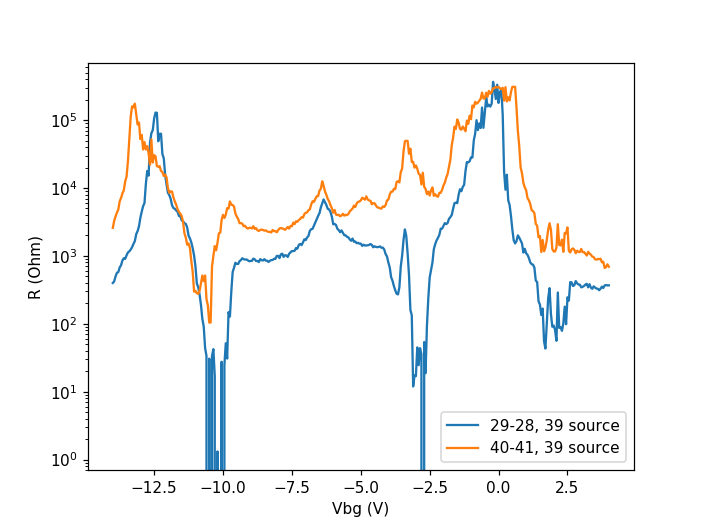

In [200]:
plt.figure()
plt.semilogy(data_gate1.srframe_volt_p1_set, npd.Rxxfromdata(data_gate1, 0.5e-9, 'lockin865'), label='29-28, 39 source')
plt.semilogy(data_gate1.srframe_volt_p1_set, npd.Rxxfromdata(data_gate1, 0.5e-9, 'lockin830'), label='40-41, 39 source')
plt.xlabel('Vbg (V)')
plt.ylabel('R (Ohm)')
plt.legend()

In [6]:
data_2Dgate1 = qc.load_data('data/2020-05-05/#024_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_19-52-29')

In [7]:
data_2Dgate2 = qc.load_data('data/2020-05-06/#001_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_16-52-16')

<IPython.core.display.Javascript object>


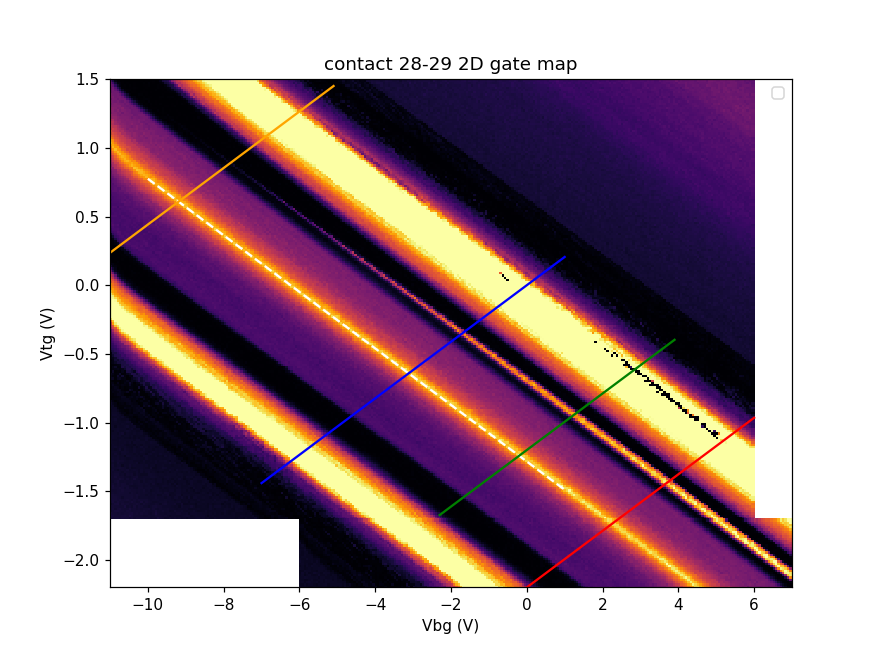

No handles with labels found to put in legend.


In [12]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin865_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='blue')

#x3 = np.array([-5,5])
#plt.plot(x3, x3*(slDrc)+0.3, color='red', linestyle='dashed')

x4 = np.array([-11,-5.1])
plt.plot(x4, x4*(-slDrc)+2.5, color='orange')

x5 = np.array([-2.3,3.9])
plt.plot(x5, x5*(-slDrc)-1.2, color='green')

x6 = np.array([0,6])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')

plt.legend()

In [39]:
data_2Dgate1_1K = qc.load_data('data/2020-06-15/#113_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_1K_22-25-50')

In [40]:
data_2Dgate2_1K = qc.load_data('data/2020-06-16/#001_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_1K_19-11-49')

<IPython.core.display.Javascript object>


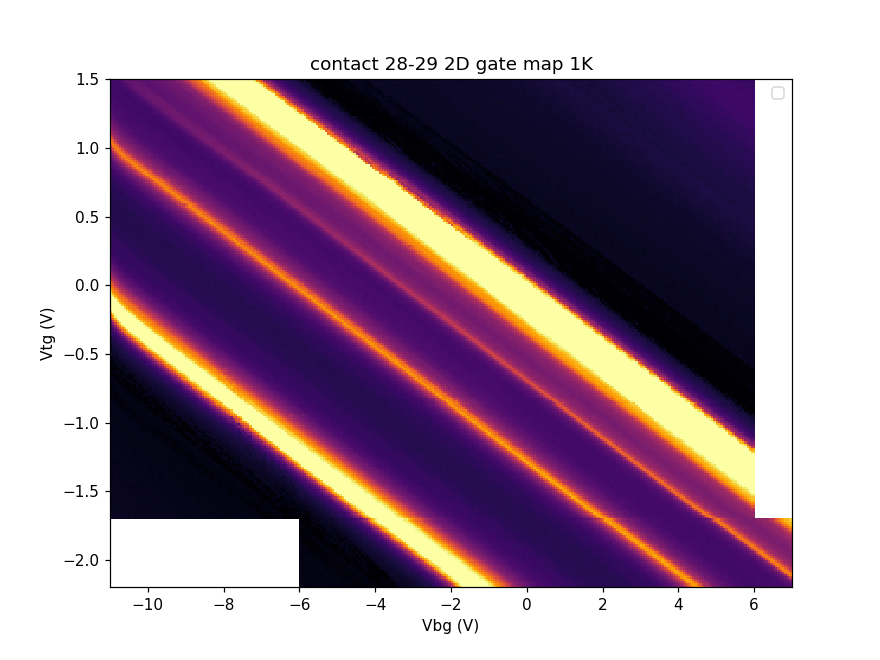

No handles with labels found to put in legend.


In [44]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1_1K.srframe_volt_p1_set[0,:],data_2Dgate1_1K.srdc_volt_set[:],data_2Dgate1_1K.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=1e4))
plt.pcolormesh(data_2Dgate2_1K.srframe_volt_p1_set[0,:],data_2Dgate2_1K.srdc_volt_set[:31],data_2Dgate2_1K.lockin865_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map 1K')
plt.legend()

In [757]:
def convert(list): 
    s = [str(i) for i in list] 
    res = int("".join(s)) 
    return(res)

In [876]:
x1_D0 = -7
y1_D0 = x1_D0*(-slDrc)
x2_D0 = 1
y2_D0 = x2_D0*(-slDrc)
ind_x1 = npd.val_to_index([x1_D0], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y1 = npd.val_to_index([y1_D0], data_2Dgate1.srframe_volt_p5_set[:])
ind_x2 = npd.val_to_index([x2_D0], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y2 = npd.val_to_index([y2_D0], data_2Dgate1.srframe_volt_p5_set[:])

x3 = -11
y3 = x3*(-slDrc)+2.5
x4 = -5.1
y4 = x4*(-slDrc)+2.5
ind_x3 = npd.val_to_index([x3], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y3 = npd.val_to_index([y3], data_2Dgate1.srframe_volt_p5_set[:])
ind_x4 = npd.val_to_index([x4], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y4 = npd.val_to_index([y4], data_2Dgate1.srframe_volt_p5_set[:])

x5 = -2.3
y5 = x5*(-slDrc)-1.2
x6 = 3.9
y6 = x6*(-slDrc)-1.2
ind_x5 = npd.val_to_index([x5], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y5 = npd.val_to_index([y5], data_2Dgate1.srframe_volt_p5_set[:])
ind_x6 = npd.val_to_index([x6], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y6 = npd.val_to_index([y6], data_2Dgate1.srframe_volt_p5_set[:])

x7 = 0
y7 = x7*(-slDrc)-2.2
y8 = -1.7
x8 = (y8+2.2)/(-slDrc)
ind_x7 = npd.val_to_index([x7], data_2Dgate2.srframe_volt_p1_set[0,:])
ind_y7 = npd.val_to_index([y7], data_2Dgate2.srframe_volt_p5_set[:])
ind_x8 = npd.val_to_index([x8], data_2Dgate2.srframe_volt_p1_set[0,:])
ind_y8 = npd.val_to_index([y8], data_2Dgate2.srframe_volt_p5_set[:])

y9 = -1.7
x9 = (y9+2.2)/(-slDrc)
x10 = 6
y10 = x10*(-slDrc)-2.2
ind_x9 = npd.val_to_index([x9], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y9 = npd.val_to_index([y9], data_2Dgate1.srframe_volt_p5_set[:])
ind_x10 = npd.val_to_index([x10], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y10 = npd.val_to_index([y10], data_2Dgate1.srframe_volt_p5_set[:])

-7.00 is not a value in the array
Plotted -6.99 instead
-1.44 is not a value in the array
Plotted -1.43 instead
1.00 is not a value in the array
Plotted 0.98 instead
0.21 is not a value in the array
Plotted 0.20 instead
0.24 is not a value in the array
Plotted 0.23 instead
-5.10 is not a value in the array
Plotted -5.10 instead
1.45 is not a value in the array
Plotted 1.45 instead
-2.30 is not a value in the array
Plotted -2.28 instead
-1.67 is not a value in the array
Plotted -1.67 instead
3.90 is not a value in the array
Plotted 3.93 instead
-0.40 is not a value in the array
Plotted -0.40 instead
2.43 is not a value in the array
Plotted 2.44 instead
2.43 is not a value in the array
Plotted 2.42 instead
-0.97 is not a value in the array
Plotted -0.97 instead


In [877]:
num_x1 = convert(ind_x1)  
num_x2 = convert(ind_x2)  
num_y1 = convert(ind_y1)
num_y2 = convert(ind_y2)

num_x3 = convert(ind_x3)  
num_x4 = convert(ind_x4)  
num_y3 = convert(ind_y3)
num_y4 = convert(ind_y4)

num_x5 = convert(ind_x5)  
num_x6 = convert(ind_x6)  
num_y5 = convert(ind_y5)
num_y6 = convert(ind_y6)

num_x7 = convert(ind_x7)  
num_x8 = convert(ind_x8)  
num_y7 = convert(ind_y7)
num_y8 = convert(ind_y8)

num_x9 = convert(ind_x9)  
num_x10 = convert(ind_x10)  
num_y9 = convert(ind_y9)
num_y10 = convert(ind_y10)

In [878]:
numx_vals = [num_x1, num_x2]
numy_vals = [num_y1, num_y2]
sl_num, b_num = np.polyfit(numx_vals, numy_vals, 1)

numx_vals2 = [num_x3, num_x4]
numy_vals2 = [num_y3, num_y4]
sl_num2, b_num2 = np.polyfit(numx_vals2, numy_vals2, 1)

numx_vals3 = [num_x5, num_x6]
numy_vals3 = [num_y5, num_y6]
sl_num3, b_num3 = np.polyfit(numx_vals3, numy_vals3, 1)

numx_vals4 = [num_x7, num_x8]
numy_vals4 = [num_y7, num_y8]
sl_num4, b_num4 = np.polyfit(numx_vals4, numy_vals4, 1)

numx_vals5 = [num_x9, num_x10]
numy_vals5 = [num_y9, num_y10]
sl_num5, b_num5 = np.polyfit(numx_vals5, numy_vals5, 1)

In [879]:
D0_value = np.zeros(num_x2-num_x1+1)
for i in range(num_x2-num_x1+1):
    D0_value[i] = data_2Dgate1.lockin865_X[int(round(sl_num*(num_x1+i)+b_num)),num_x1+i]
    
Dplus_value = np.zeros(num_x4-num_x3+1)
for i in range(num_x4-num_x3+1):
    Dplus_value[i] = data_2Dgate1.lockin865_X[int(round(sl_num2*(num_x3+i)+b_num2)),num_x3+i]
    
Dminus_value = np.zeros(num_x6-num_x5+1)
for i in range(num_x6-num_x5+1):
    Dminus_value[i] = data_2Dgate1.lockin865_X[int(round(sl_num3*(num_x5+i)+b_num3)),num_x5+i]
    
Dminus2_value = np.zeros(num_x8-num_x7+1)
for i in range(num_x8-num_x7+1):
    Dminus2_value[i] = data_2Dgate2.lockin865_X[int(round(sl_num4*(num_x7+i)+b_num4)),num_x7+i]
    
Dminus3_value = np.zeros(num_x10-num_x9+1)
for i in range(num_x10-num_x9+1):
    Dminus3_value[i] = data_2Dgate1.lockin865_X[int(round(sl_num5*(num_x9+i)+b_num5)),num_x9+i]

<IPython.core.display.Javascript object>


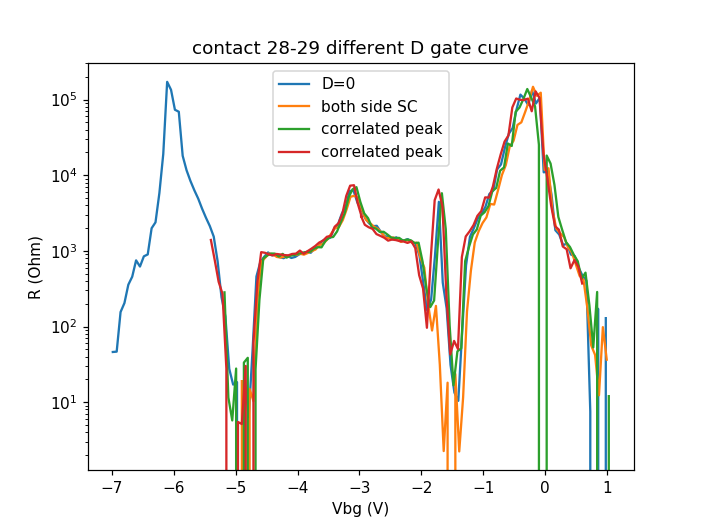

In [880]:
plt.figure()
plt.semilogy(data_2Dgate1.srframe_volt_p1_set[0, num_x1:num_x2+1], D0_value[:]/0.5e-9, label='D=0')
plt.semilogy(data_2Dgate1.srframe_volt_p1_set[0, num_x3:num_x4+1]+6.1, Dplus_value[:]/0.5e-9, label='both side SC')
plt.semilogy(data_2Dgate1.srframe_volt_p1_set[0, num_x5:num_x6+1]-2.9, Dminus_value[:]/0.5e-9, label='correlated peak')
plt.semilogy(np.concatenate((data_2Dgate2.srframe_volt_p1_set[0, num_x7:num_x8+1],data_2Dgate1.srframe_volt_p1_set[0, num_x9:num_x10+1]))-5.4, np.concatenate((Dminus2_value[:], Dminus3_value[:]))/0.5e-9, label='correlated peak')
plt.xlabel('Vbg (V)')
plt.ylabel('R (Ohm)')
plt.title('contact 28-29 different D gate curve')
plt.legend()

In [765]:
#plt.figure()
for i in range(2):
    indx = 1 + i*180
    plt.semilogy(data_2Dgate1.srframe_volt_p1_set[0,:], data_2Dgate1.lockin865_X[indx, :]/0.5e-9, label='Vtg {:.3f} V'.format(data_2Dgate1.srframe_volt_p5_set[indx]))
plt.xlabel('Vbg (V)')
plt.ylabel('R (Ohm)')
plt.legend()

<IPython.core.display.Javascript object>


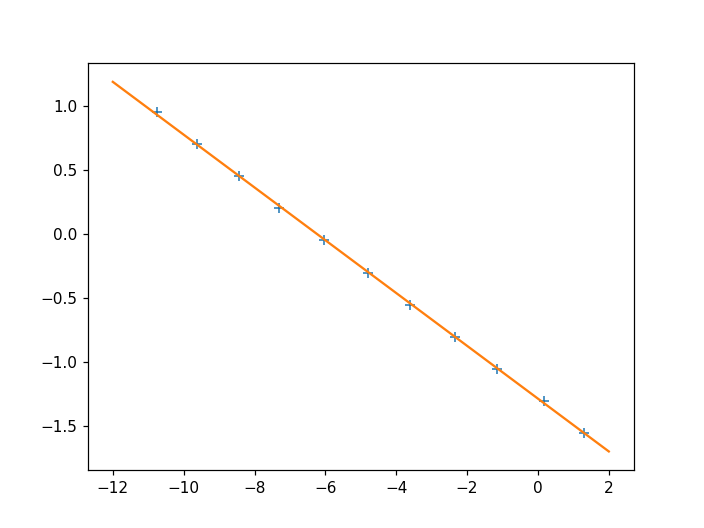

In [11]:
#Dirac point Vbg-Vtg slop
Vtg_vals = [-1.55, -1.3, -1.05, -0.8, -0.55, -0.3, -0.05, 0.2, 0.45, 0.7, 0.95]
Vbg_vals = [1.3, 0.166, -1.15, -2.34, -3.60, -4.79, -6.04, -7.30, -8.43, -9.62, -10.75]
slDrc, bDrc = np.polyfit(Vbg_vals, Vtg_vals, 1)

plt.figure()
plt.plot(Vbg_vals, Vtg_vals, '+')
x1 = np.array([-12,2])
plt.plot(x1, x1*slDrc + bDrc)

<IPython.core.display.Javascript object>


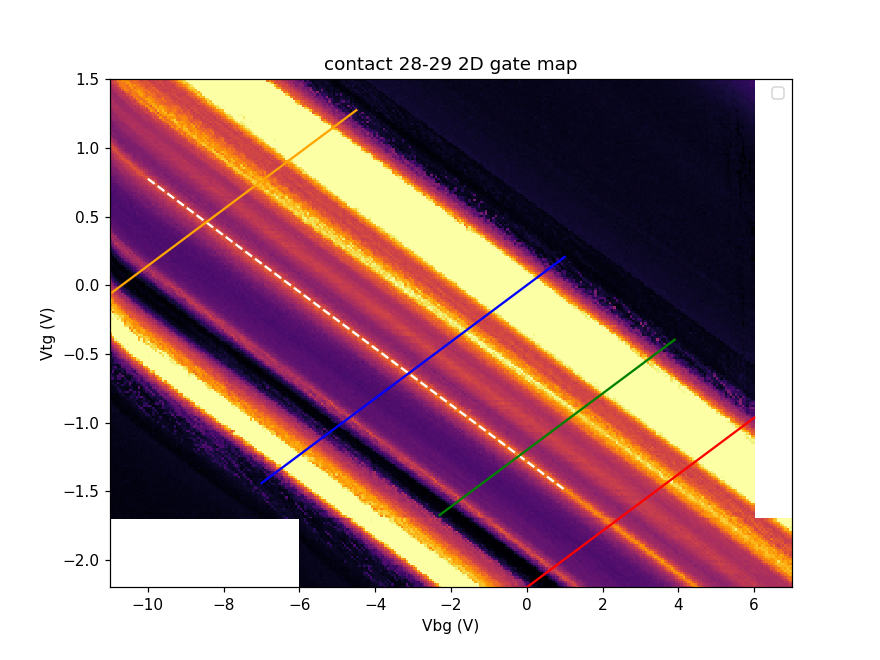

No handles with labels found to put in legend.


In [946]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin830_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin830_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='blue')

#x3 = np.array([-5,5])
#plt.plot(x3, x3*(slDrc)+0.3, color='red', linestyle='dashed')

x4 = np.array([-11,-4.5])
plt.plot(x4, x4*(-slDrc)+2.2, color='orange')

x5 = np.array([-2.3,3.9])
plt.plot(x5, x5*(-slDrc)-1.2, color='green')

x6 = np.array([0,6])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')

plt.legend()

<IPython.core.display.Javascript object>


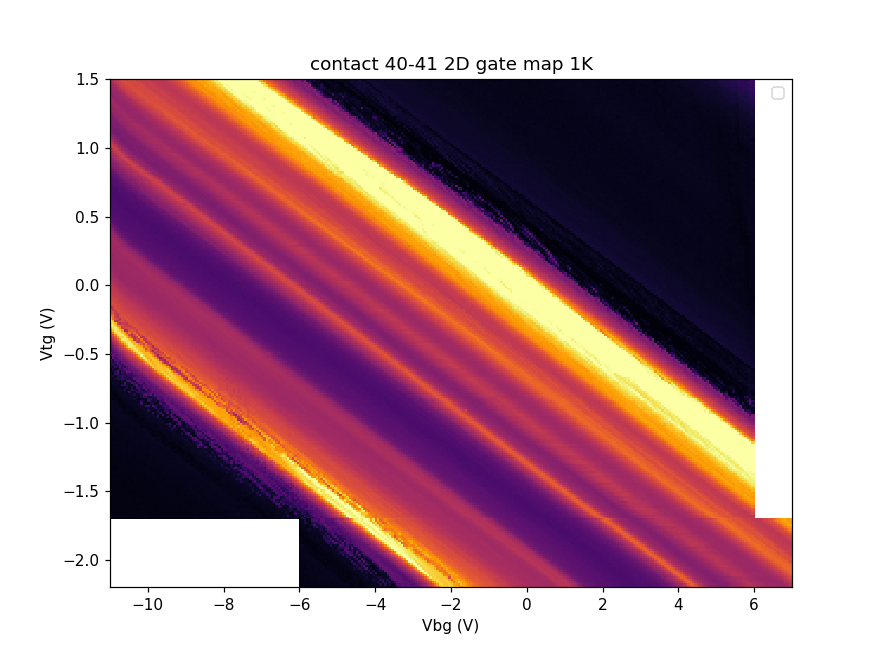

No handles with labels found to put in legend.


In [45]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1_1K.srframe_volt_p1_set[0,:],data_2Dgate1_1K.srdc_volt_set[:],data_2Dgate1_1K.lockin830_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate2_1K.srframe_volt_p1_set[0,:],data_2Dgate2_1K.srdc_volt_set[:31],data_2Dgate2_1K.lockin830_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 40-41 2D gate map 1K')
plt.legend()

In [947]:
x1_D0 = -7
y1_D0 = x1_D0*(-slDrc)
x2_D0 = 1
y2_D0 = x2_D0*(-slDrc)
ind_x1 = npd.val_to_index([x1_D0], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y1 = npd.val_to_index([y1_D0], data_2Dgate1.srframe_volt_p5_set[:])
ind_x2 = npd.val_to_index([x2_D0], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y2 = npd.val_to_index([y2_D0], data_2Dgate1.srframe_volt_p5_set[:])

x3 = -11
y3 = x3*(-slDrc)+2.2
x4 = -4.5
y4 = x4*(-slDrc)+2.2
ind_x3 = npd.val_to_index([x3], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y3 = npd.val_to_index([y3], data_2Dgate1.srframe_volt_p5_set[:])
ind_x4 = npd.val_to_index([x4], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y4 = npd.val_to_index([y4], data_2Dgate1.srframe_volt_p5_set[:])

x5 = -2.3
y5 = x5*(-slDrc)-1.2
x6 = 3.9
y6 = x6*(-slDrc)-1.2
ind_x5 = npd.val_to_index([x5], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y5 = npd.val_to_index([y5], data_2Dgate1.srframe_volt_p5_set[:])
ind_x6 = npd.val_to_index([x6], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y6 = npd.val_to_index([y6], data_2Dgate1.srframe_volt_p5_set[:])

x7 = 0
y7 = x7*(-slDrc)-2.2
y8 = -1.7
x8 = (y8+2.2)/(-slDrc)
ind_x7 = npd.val_to_index([x7], data_2Dgate2.srframe_volt_p1_set[0,:])
ind_y7 = npd.val_to_index([y7], data_2Dgate2.srframe_volt_p5_set[:])
ind_x8 = npd.val_to_index([x8], data_2Dgate2.srframe_volt_p1_set[0,:])
ind_y8 = npd.val_to_index([y8], data_2Dgate2.srframe_volt_p5_set[:])

y9 = -1.7
x9 = (y9+2.2)/(-slDrc)
x10 = 6
y10 = x10*(-slDrc)-2.2
ind_x9 = npd.val_to_index([x9], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y9 = npd.val_to_index([y9], data_2Dgate1.srframe_volt_p5_set[:])
ind_x10 = npd.val_to_index([x10], data_2Dgate1.srframe_volt_p1_set[0,:])
ind_y10 = npd.val_to_index([y10], data_2Dgate1.srframe_volt_p5_set[:])

-7.00 is not a value in the array
Plotted -6.99 instead
-1.44 is not a value in the array
Plotted -1.43 instead
1.00 is not a value in the array
Plotted 0.98 instead
0.21 is not a value in the array
Plotted 0.20 instead
-0.06 is not a value in the array
Plotted -0.07 instead
-4.50 is not a value in the array
Plotted -4.48 instead
1.27 is not a value in the array
Plotted 1.27 instead
-2.30 is not a value in the array
Plotted -2.28 instead
-1.67 is not a value in the array
Plotted -1.67 instead
3.90 is not a value in the array
Plotted 3.93 instead
-0.40 is not a value in the array
Plotted -0.40 instead
2.43 is not a value in the array
Plotted 2.44 instead
2.43 is not a value in the array
Plotted 2.42 instead
-0.97 is not a value in the array
Plotted -0.97 instead


In [948]:
num_x1 = convert(ind_x1)  
num_x2 = convert(ind_x2)  
num_y1 = convert(ind_y1)
num_y2 = convert(ind_y2)

num_x3 = convert(ind_x3)  
num_x4 = convert(ind_x4)  
num_y3 = convert(ind_y3)
num_y4 = convert(ind_y4)

num_x5 = convert(ind_x5)  
num_x6 = convert(ind_x6)  
num_y5 = convert(ind_y5)
num_y6 = convert(ind_y6)

num_x7 = convert(ind_x7)  
num_x8 = convert(ind_x8)  
num_y7 = convert(ind_y7)
num_y8 = convert(ind_y8)

num_x9 = convert(ind_x9)  
num_x10 = convert(ind_x10)  
num_y9 = convert(ind_y9)
num_y10 = convert(ind_y10)

In [949]:
numx_vals = [num_x1, num_x2]
numy_vals = [num_y1, num_y2]
sl_num, b_num = np.polyfit(numx_vals, numy_vals, 1)

numx_vals2 = [num_x3, num_x4]
numy_vals2 = [num_y3, num_y4]
sl_num2, b_num2 = np.polyfit(numx_vals2, numy_vals2, 1)

numx_vals3 = [num_x5, num_x6]
numy_vals3 = [num_y5, num_y6]
sl_num3, b_num3 = np.polyfit(numx_vals3, numy_vals3, 1)

numx_vals4 = [num_x7, num_x8]
numy_vals4 = [num_y7, num_y8]
sl_num4, b_num4 = np.polyfit(numx_vals4, numy_vals4, 1)

numx_vals5 = [num_x9, num_x10]
numy_vals5 = [num_y9, num_y10]
sl_num5, b_num5 = np.polyfit(numx_vals5, numy_vals5, 1)

In [950]:
D0_value = np.zeros(num_x2-num_x1+1)
for i in range(num_x2-num_x1+1):
    D0_value[i] = data_2Dgate1.lockin830_X[int(round(sl_num*(num_x1+i)+b_num)),num_x1+i]
    
Dplus_value = np.zeros(num_x4-num_x3+1)
for i in range(num_x4-num_x3+1):
    Dplus_value[i] = data_2Dgate1.lockin830_X[int(round(sl_num2*(num_x3+i)+b_num2)),num_x3+i]
    
Dminus_value = np.zeros(num_x6-num_x5+1)
for i in range(num_x6-num_x5+1):
    Dminus_value[i] = data_2Dgate1.lockin830_X[int(round(sl_num3*(num_x5+i)+b_num3)),num_x5+i]
    
Dminus2_value = np.zeros(num_x8-num_x7+1)
for i in range(num_x8-num_x7+1):
    Dminus2_value[i] = data_2Dgate2.lockin830_X[int(round(sl_num4*(num_x7+i)+b_num4)),num_x7+i]
    
Dminus3_value = np.zeros(num_x10-num_x9+1)
for i in range(num_x10-num_x9+1):
    Dminus3_value[i] = data_2Dgate1.lockin830_X[int(round(sl_num5*(num_x9+i)+b_num5)),num_x9+i]

<IPython.core.display.Javascript object>


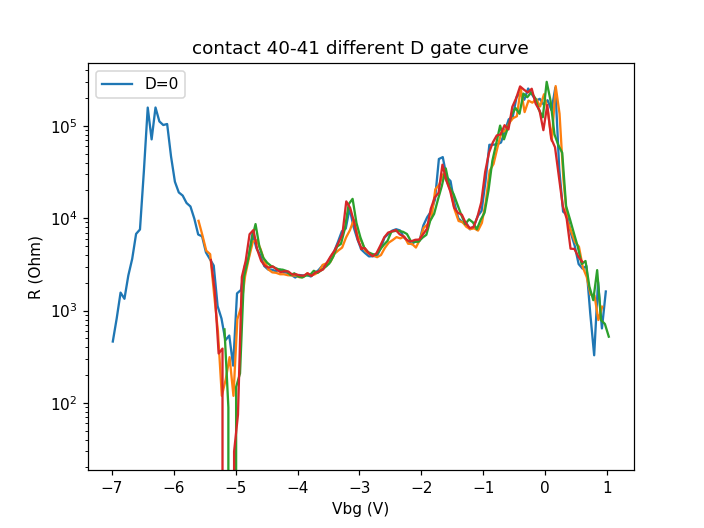

In [951]:
plt.figure()
plt.semilogy(data_2Dgate1.srframe_volt_p1_set[0, num_x1:num_x2+1], D0_value[:]/0.5e-9, label='D=0')
plt.semilogy(data_2Dgate1.srframe_volt_p1_set[0, num_x3:num_x4+1]+5.4, Dplus_value[:]/0.5e-9, label='')
plt.semilogy(data_2Dgate1.srframe_volt_p1_set[0, num_x5:num_x6+1]-2.9, Dminus_value[:]/0.5e-9, label='')
plt.semilogy(np.concatenate((data_2Dgate2.srframe_volt_p1_set[0, num_x7:num_x8+1],data_2Dgate1.srframe_volt_p1_set[0, num_x9:num_x10+1]))-5.4, np.concatenate((Dminus2_value[:], Dminus3_value[:]))/0.5e-9, label='')
plt.xlabel('Vbg (V)')
plt.ylabel('R (Ohm)')
plt.title('contact 40-41 different D gate curve')
plt.legend()

In [206]:
slDrc

-0.2058088083627785

We have 

\begin{eqnarray}
n & = & [C_tV_t + C_bV_b]/e + n_0\\
D & = & [C_tV_t - C_bV_b]/\epsilon_0
\end{eqnarray}

We can easily pick out the line for $n = 0$:

\begin{equation}
V_t  =  -\frac{C_b}{C_t} V_b - \frac{e}{C_t} n_0
\end{equation}

Then we have the slope $m_1 = -C_b/C_t$ (we can get $m_1$ from our line fit to the CNP) and intercept $b_1 = -e n_0/C_t$

We want to find a line for $D = 0$:

\begin{equation}
V_t = \frac{C_b}{C_t} V_b
\end{equation}

Where the slope $m_2 = C_b/C_t = -m_1$, and the intercept is 0. If the $D=0$ line here goes through $(V_b, V_t) = (0, 0)$, then we have the $D = 0$ line fully constrained.

We just need to make a parameter to sweep across n, with D = 0. Something like this:

In [109]:
print(slDrc)

-0.2058088083627785


In [ ]:
def zerofieldsw(Vb):
    
    srframe.volt_p1(Vb)
    srframe.volt_p5(-slDrc*Vb)
    
zeroDparam = qc.Parameter('zeroDparam', set_cmd=zerofieldsw)

# then we can sweep zeroDparam

# fan diagram and 2D gate map at high field

In [1352]:
dfan1 = qc.load_data('data/2020-05-06/#005_M30_865_29-28__830_40-41_1nA_baseT_B-n_D0_sweep_23-13-35')

In [1445]:
dfan3 = qc.load_data('data/2020-05-19/#010_M30_865_29-28_830_40-41_1nA_baseT_B-n_orangeline_sweep_19-01-49')

In [1461]:
dfan4 = qc.load_data('data/2020-05-21/#007_M30_865_29-28_830_40-41_1nA_baseT_B-n_redline_sweep_14-33-36')

In [1462]:
dfan5 = qc.load_data('data/2020-05-23/#001_M30_865_29-28_830_40-41_1nA_baseT_B-n_redline_sweep_11-34-02')

In [1493]:
dfan6 = qc.load_data('data/2020-05-24/#002_M30_865_29-28_830_40-41_1nA_baseT_B-n_orangeline_sweep_16-12-02')

<IPython.core.display.Javascript object>


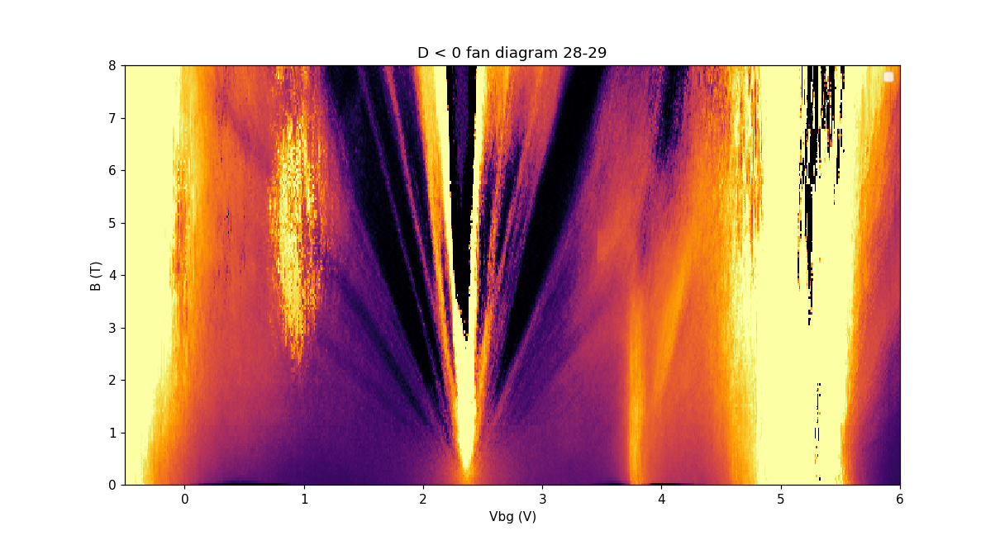

No handles with labels found to put in legend.


In [1475]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan4.constant_D_redline_nsw_set[0,:],dfan4.triton_field_set_stable_set[:116],dfan4.lockin865_X[:116,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=2e4))
plt.pcolormesh(dfan5.constant_D_redline_nsw_set[0,:],dfan5.triton_field_set_stable_set[1:],dfan5.lockin865_X[1:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=2e4))
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D < 0 fan diagram 28-29')
plt.legend()

<IPython.core.display.Javascript object>


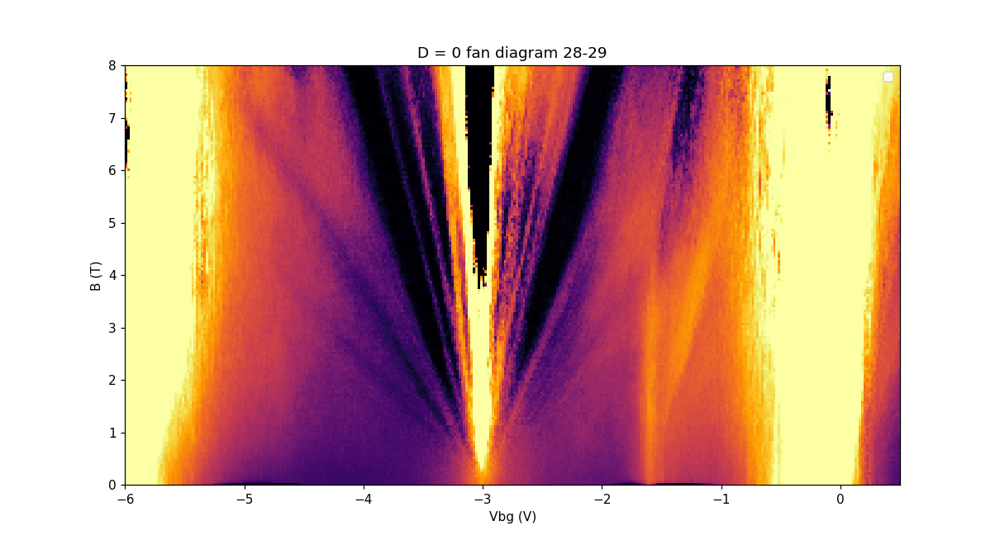

No handles with labels found to put in legend.


In [1478]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan1.zeroDparam_set[0,:],dfan1.triton_field_set_stable_set[:],dfan1.lockin865_X[:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=2e4))
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D = 0 fan diagram 28-29')
plt.xlim(-6, 0.5)
plt.legend()

<IPython.core.display.Javascript object>


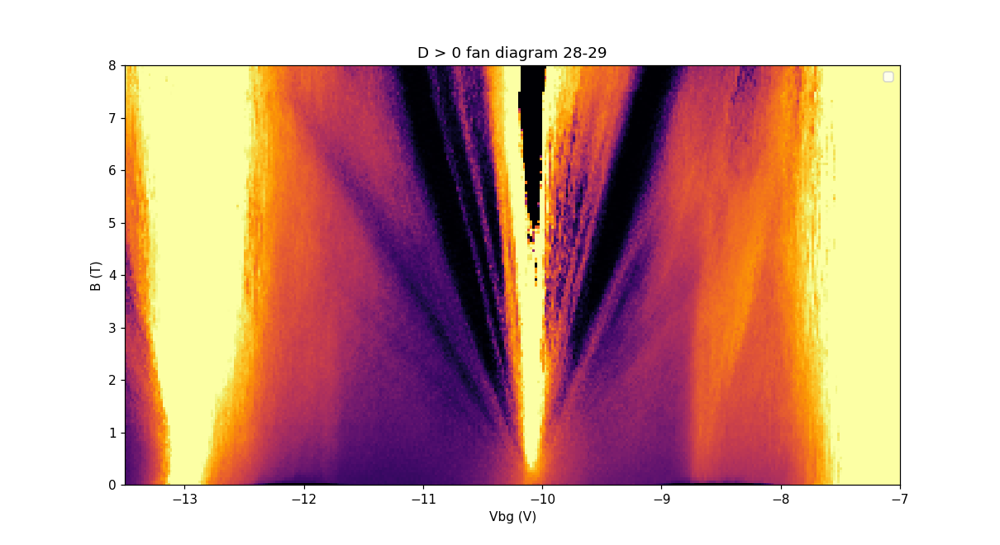

No handles with labels found to put in legend.


In [1495]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan3.constant_D_orangeline_nsw_set[0,:],dfan3.triton_field_set_stable_set[:151],dfan3.lockin865_X[:151,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=2e4))
plt.pcolormesh(dfan6.constant_D_orangeline_nsw_set[0,:],dfan6.triton_field_set_stable_set[2:],dfan6.lockin865_X[2:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=2e4))
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D > 0 fan diagram 28-29')
plt.xlim(-13.5,-7)
plt.ylim(0,8)
plt.legend()

In [1383]:
data_2Dgate3 = qc.load_data('data/2020-05-17/#003_M30_865_29-28__830_40-41_1nA_2dgatesweep_8T_16-27-29')

<IPython.core.display.Javascript object>


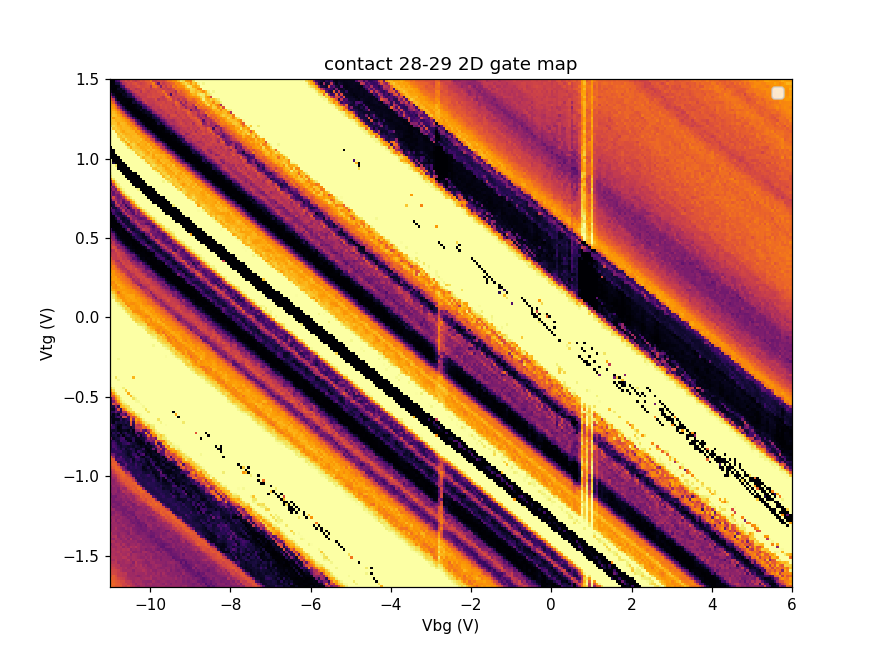

No handles with labels found to put in legend.


In [1441]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate3.srframe_volt_p1_set[0,:],data_2Dgate3.srframe_volt_p5_set[:],data_2Dgate3.lockin865_X[:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')


plt.legend()

In [1394]:
data_2Dgate4 = qc.load_data('data/2020-05-18/#001_M30_865_29-28__830_40-41_1nA_2dgatesweep_5T_14-07-28')

<IPython.core.display.Javascript object>


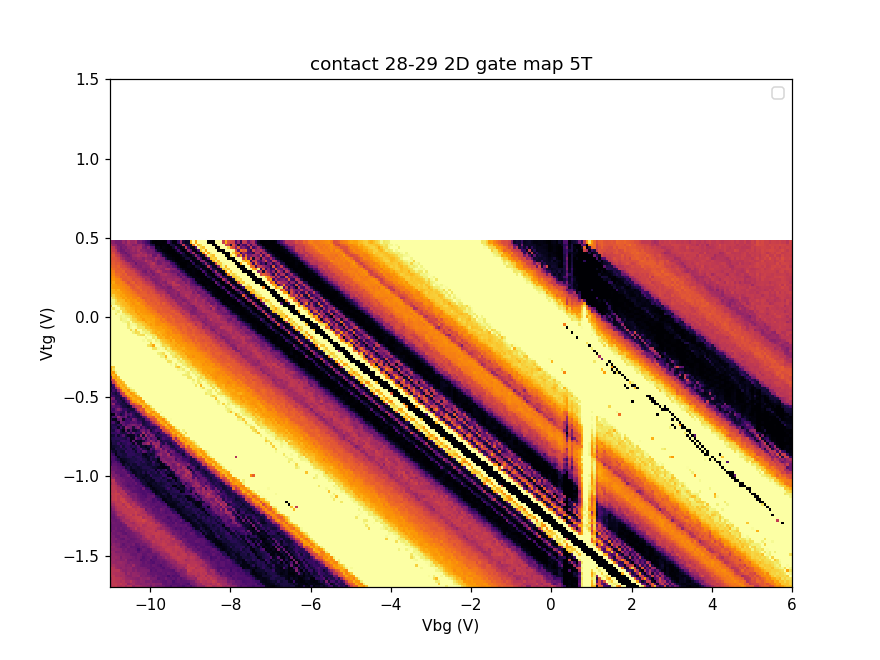

No handles with labels found to put in legend.


In [1405]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate4.srframe_volt_p1_set[0,:],data_2Dgate4.srframe_volt_p5_set[:132],data_2Dgate4.lockin865_X[:132,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map 5T')
plt.ylim(-1.7,1.5)
plt.legend()

In [1361]:
dfan2 = qc.load_data('data/2020-05-15/#005_M30_865_28-42__830_32-40_1nA_baseT_B-n_D0_sweep_21-41-18')

<IPython.core.display.Javascript object>


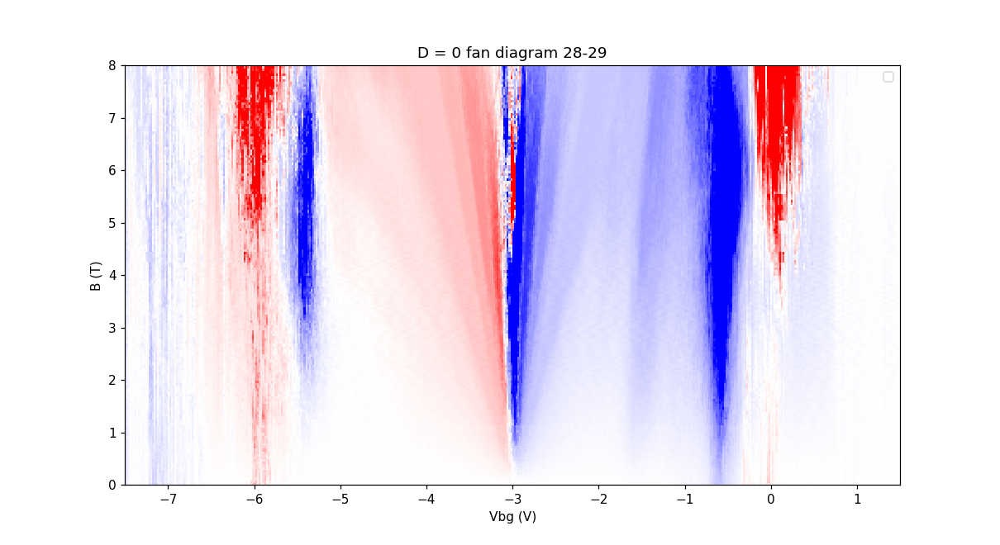

No handles with labels found to put in legend.


In [1363]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan2.zeroDparam_set[0,:],dfan2.triton_field_set_stable_set[:],dfan2.lockin865_X[:,:]/1e-9,cmap='bwr', vmin=-3e4, vmax=3e4)
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D = 0 fan diagram 28-29')
plt.legend()

<IPython.core.display.Javascript object>


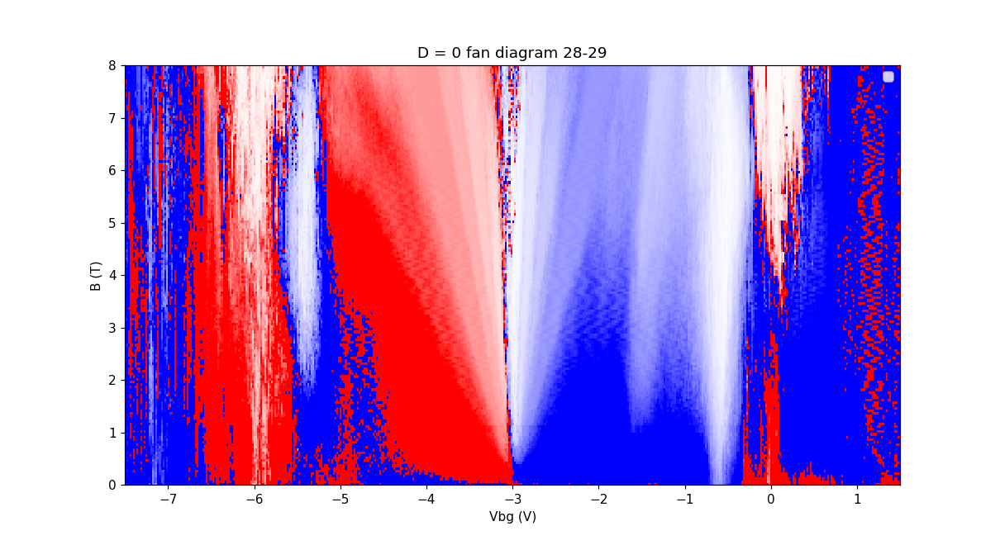

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
No handles with labels found to put in legend.


In [1366]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan2.zeroDparam_set[0,:],dfan2.triton_field_set_stable_set[:],(1/(dfan2.lockin865_X[:,:]/1e-9))/(1.602e-19**2/6.6e-34),cmap='bwr', vmin=-10, vmax=10)
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D = 0 fan diagram 28-29')
plt.legend()

<IPython.core.display.Javascript object>


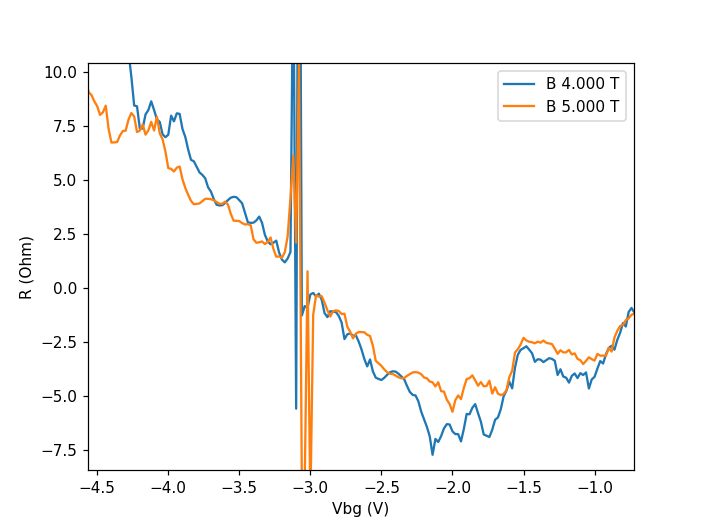

In [1393]:
plt.figure()
for i in range(2):
    indx = 80 + i*20
    plt.plot(dfan2.zeroDparam_set[0,:], (1/(dfan2.lockin865_X[indx,:]/1e-9))/(1.602e-19**2/6.6e-34), label='B {:.3f} T'.format(dfan2.triton_field_set_stable_set[indx]))
plt.xlabel('Vbg (V)')
plt.ylabel('R (Ohm)')
plt.legend()

<IPython.core.display.Javascript object>


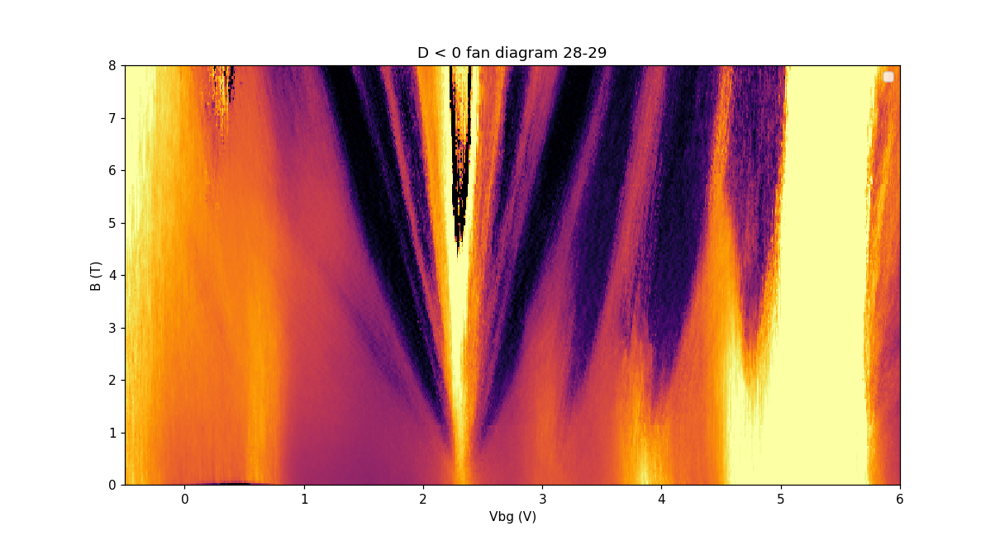

No handles with labels found to put in legend.


In [1486]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan4.constant_D_redline_nsw_set[0,:],dfan4.triton_field_set_stable_set[:116],dfan4.lockin830_X[:116,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=4e4))
plt.pcolormesh(dfan5.constant_D_redline_nsw_set[0,:],dfan5.triton_field_set_stable_set[1:],dfan5.lockin830_X[1:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=4e4))
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D < 0 fan diagram 28-29')
plt.legend()

<IPython.core.display.Javascript object>


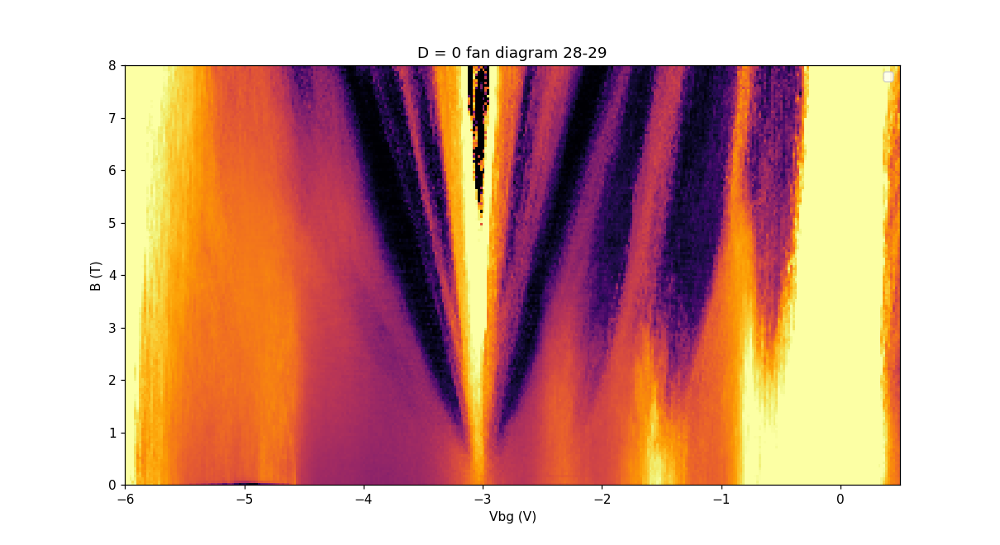

No handles with labels found to put in legend.


In [1492]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan1.zeroDparam_set[0,:],dfan1.triton_field_set_stable_set[:],dfan1.lockin830_X[:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=4e4))
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D = 0 fan diagram 28-29')
plt.xlim(-6, 0.5)
plt.legend()

<IPython.core.display.Javascript object>


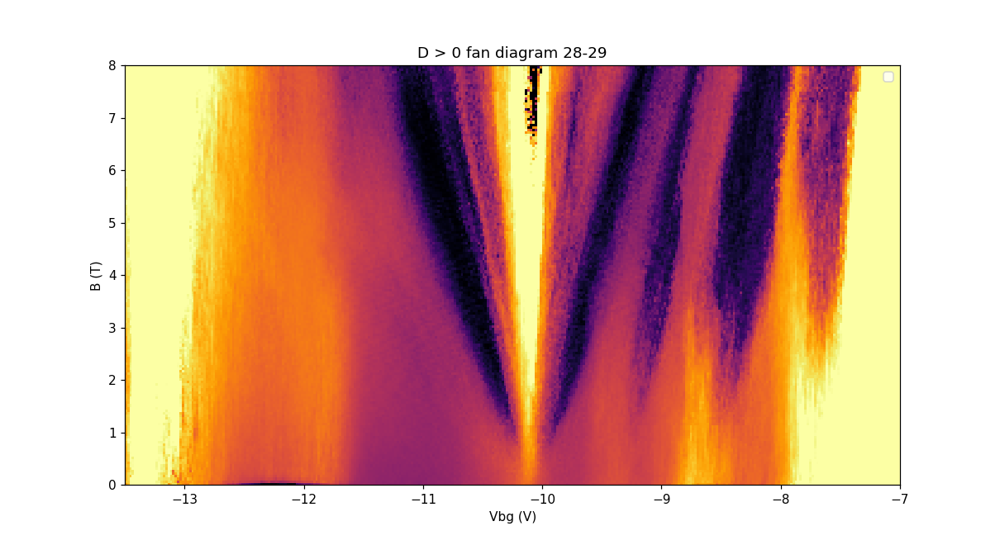

No handles with labels found to put in legend.


In [1498]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan3.constant_D_orangeline_nsw_set[0,:],dfan3.triton_field_set_stable_set[:151],dfan3.lockin830_X[:151,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=4e4))
plt.pcolormesh(dfan6.constant_D_orangeline_nsw_set[0,:],dfan6.triton_field_set_stable_set[2:],dfan6.lockin830_X[2:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=4e4))
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D > 0 fan diagram 28-29')
plt.xlim(-13.5,-7)
plt.ylim(0,8)
plt.legend()

<IPython.core.display.Javascript object>


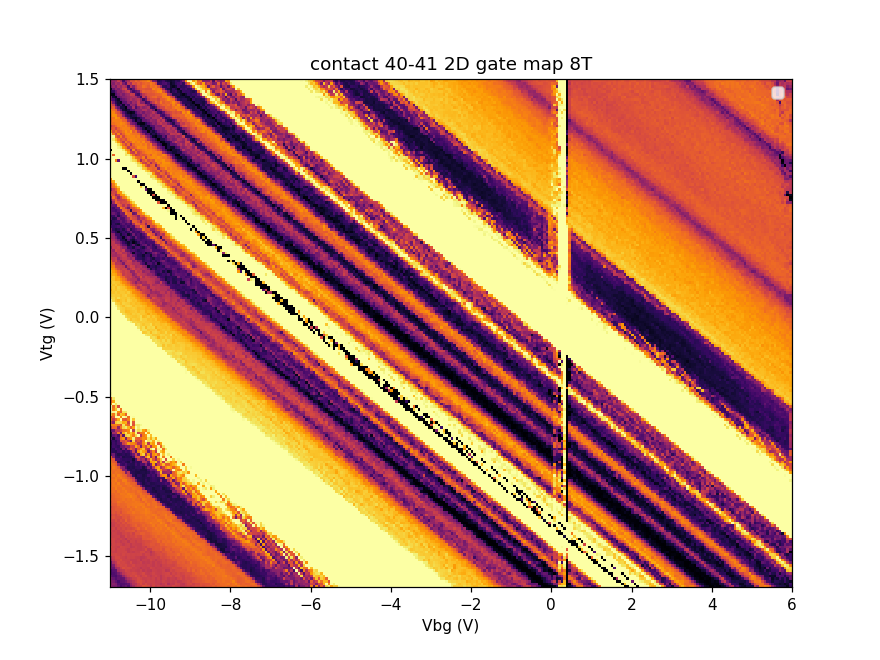

No handles with labels found to put in legend.


In [1442]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate3.srframe_volt_p1_set[0,:],data_2Dgate3.srframe_volt_p5_set[:],data_2Dgate3.lockin830_X[:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))

plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 40-41 2D gate map 8T')


plt.legend()

<IPython.core.display.Javascript object>


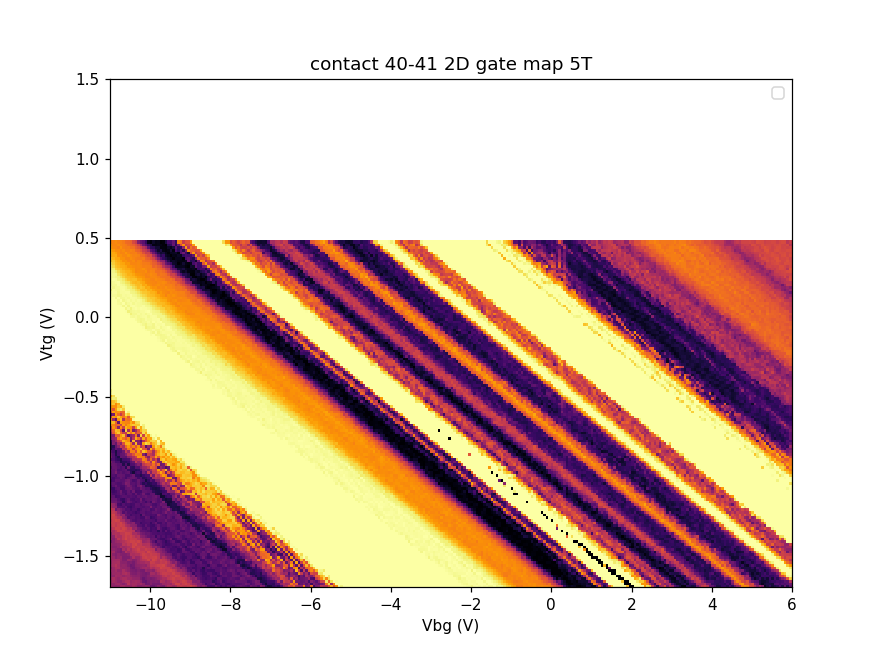

No handles with labels found to put in legend.


In [1409]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate4.srframe_volt_p1_set[0,:],data_2Dgate4.srframe_volt_p5_set[:132],data_2Dgate4.lockin830_X[:132,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 40-41 2D gate map 5T')
plt.ylim(-1.7,1.5)
plt.legend()

<IPython.core.display.Javascript object>


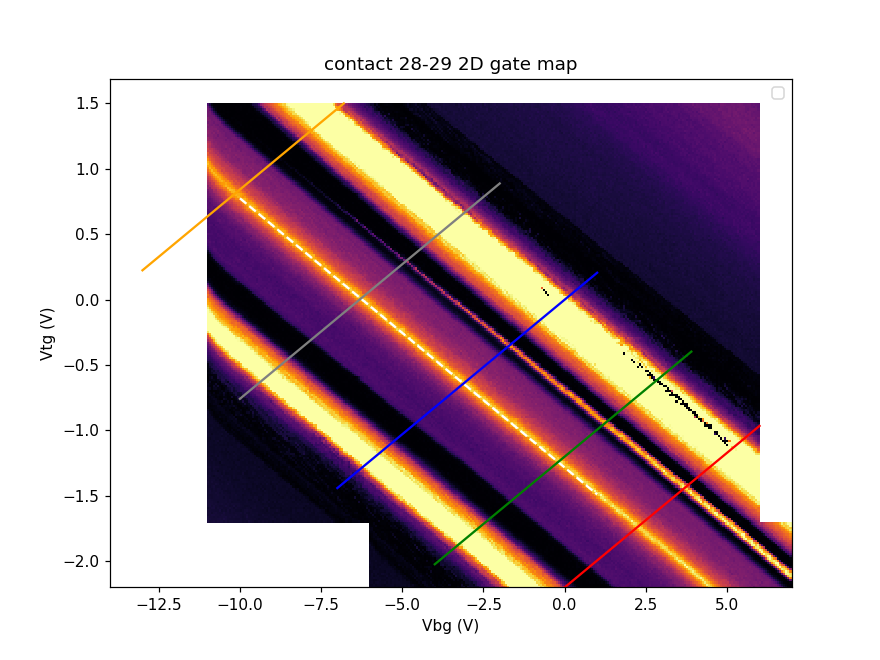

No handles with labels found to put in legend.


In [1444]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin865_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='blue')

#x3 = np.array([-5,5])
#plt.plot(x3, x3*(slDrc)+0.3, color='red', linestyle='dashed')

x4 = np.array([-13,-6.8])
plt.plot(x4, x4*(-slDrc)+2.9, color='orange')

x5 = np.array([-4,3.9])
plt.plot(x5, x5*(-slDrc)-1.2, color='green')

x6 = np.array([0,6])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')

x7 = np.array([-10,-2])
plt.plot(x7, x7*(-slDrc)+1.3, color='grey')

x8 = 3.783
#plt.plot(x8, x8*(-slDrc)-2.2, color='red', marker='o')

#constant n line cross the x8, for later
b_correlated_electron_28_29 = x8*(-slDrc) - 2.2 - x8*slDrc
x9 = np.array([-10,6])
#plt.plot(x9, x9*slDrc + b_correlated_electron_28_29, color='blue', linestyle='dashed')

plt.legend()

# some different D field gate curve measurement

In [44]:
dataD0cute = qc.load_data('data/2020-05-11/#006_M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep_12-42-35')
dataredcute = qc.load_data('data/2020-05-11/#008_M30_865_40-41__830_28-29_0.5nA_-0p8mT_redline_sweep_14-41-14')
datagreencute = qc.load_data('data/2020-05-11/#010_M30_865_40-41__830_28-29_0.5nA_-0p8mT_greenline_sweep_15-02-49')
datagreycute = qc.load_data('data/2020-05-11/#011_M30_865_40-41__830_28-29_0.5nA_-0p8mT_greyline_sweep_15-24-07')
dataorangecute = qc.load_data('data/2020-05-11/#012_M30_865_40-41__830_28-29_0.5nA_-0p8mT_orangeline_sweep_15-51-36')

<IPython.core.display.Javascript object>


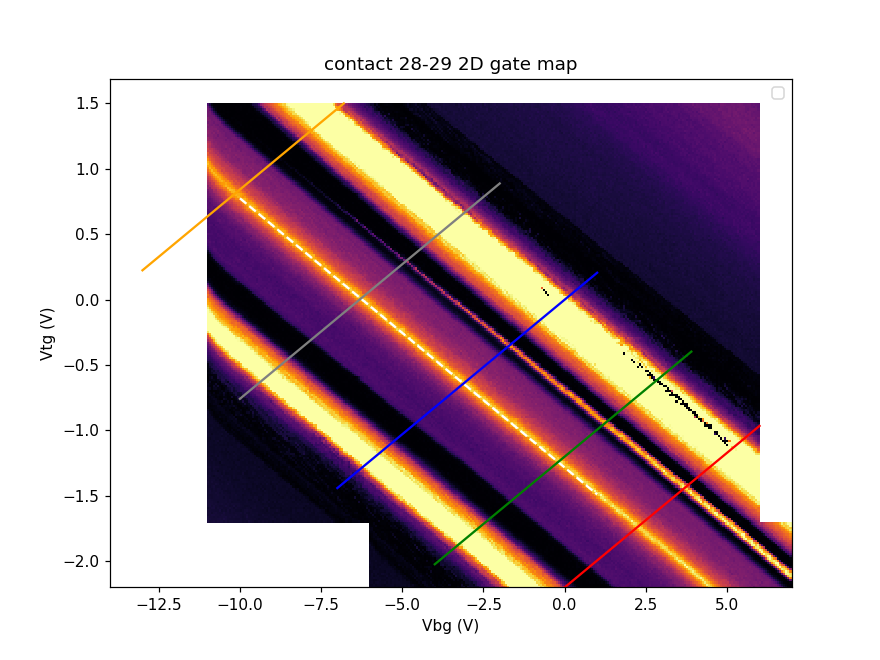

No handles with labels found to put in legend.


In [1337]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin865_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='blue')

#x3 = np.array([-5,5])
#plt.plot(x3, x3*(slDrc)+0.3, color='red', linestyle='dashed')

x4 = np.array([-13,-6.8])
plt.plot(x4, x4*(-slDrc)+2.9, color='orange')

x5 = np.array([-4,3.9])
plt.plot(x5, x5*(-slDrc)-1.2, color='green')

x6 = np.array([0,6])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')

x7 = np.array([-10,-2])
plt.plot(x7, x7*(-slDrc)+1.3, color='grey')

x8 = 3.783
#plt.plot(x8, x8*(-slDrc)-2.2, color='red', marker='o')

#constant n line cross the x8, for later
b_correlated_electron_28_29 = x8*(-slDrc) - 2.2 - x8*slDrc
x9 = np.array([-10,6])
#plt.plot(x9, x9*slDrc + b_correlated_electron_28_29, color='blue', linestyle='dashed')

plt.legend()

<IPython.core.display.Javascript object>


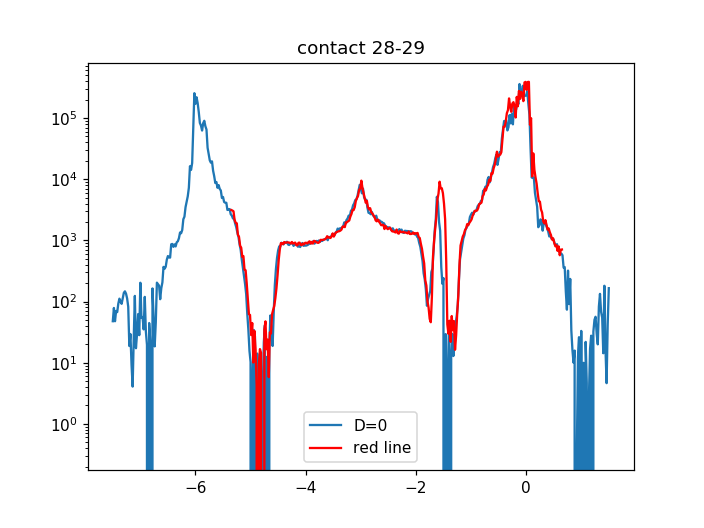

In [46]:
plt.figure()
plt.semilogy(dataD0cute.zeroDparam_set, npd.Rxxfromdata(dataD0cute, 0.5e-9, 'lockin865'), label='D=0')
plt.semilogy(dataredcute.constant_D_redline_nsw_set[:]-5.35, npd.Rxxfromdata(dataredcute, 0.5e-9, 'lockin865'), label='red line', color='red')
#plt.semilogy(datagreencute.constant_D_greenline_nsw_set[:]-2.95, npd.Rxxfromdata(datagreencute, 0.5e-9, 'lockin865'), label='green line', color='green')
#plt.semilogy(datagreycute.constant_D_greyline_nsw_set[:]+3.2, npd.Rxxfromdata(datagreycute, 0.5e-9, 'lockin865'), label='grey line', color='grey')
#plt.semilogy(dataorangecute.constant_D_orangeline_nsw_set[:]+7.1, npd.Rxxfromdata(dataorangecute, 0.5e-9, 'lockin865'), label='orange line', color='orange')
plt.title('contact 28-29')
plt.legend()

<IPython.core.display.Javascript object>


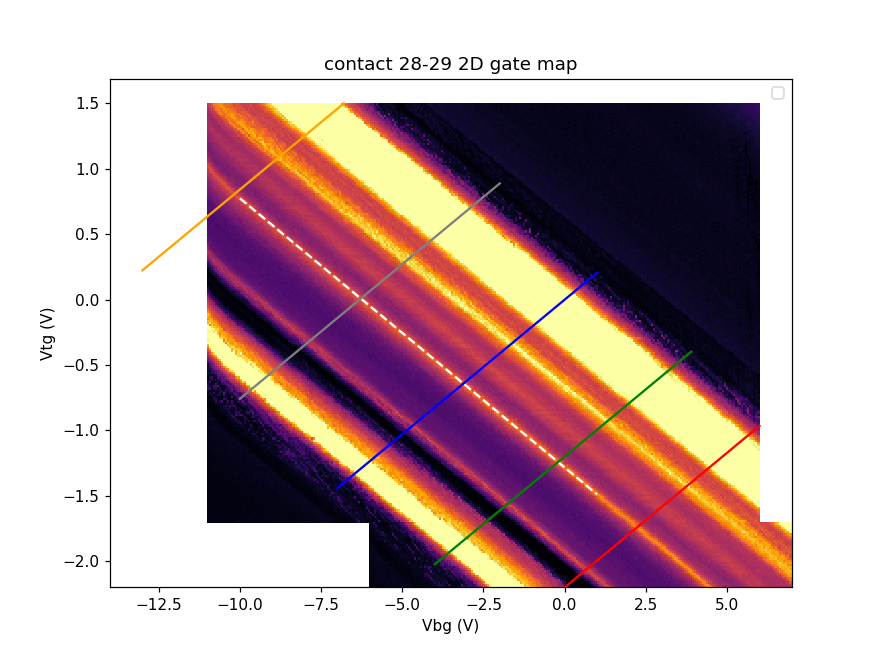

No handles with labels found to put in legend.


In [110]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin830_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin830_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='blue')

#x3 = np.array([-5,5])
#plt.plot(x3, x3*(slDrc)+0.3, color='red', linestyle='dashed')

x4 = np.array([-13,-6.8])
plt.plot(x4, x4*(-slDrc)+2.9, color='orange')

x5 = np.array([-4,3.9])
plt.plot(x5, x5*(-slDrc)-1.2, color='green')

x6 = np.array([0,6])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')

x7 = np.array([-10,-2])
plt.plot(x7, x7*(-slDrc)+1.3, color='grey')



plt.legend()

<IPython.core.display.Javascript object>


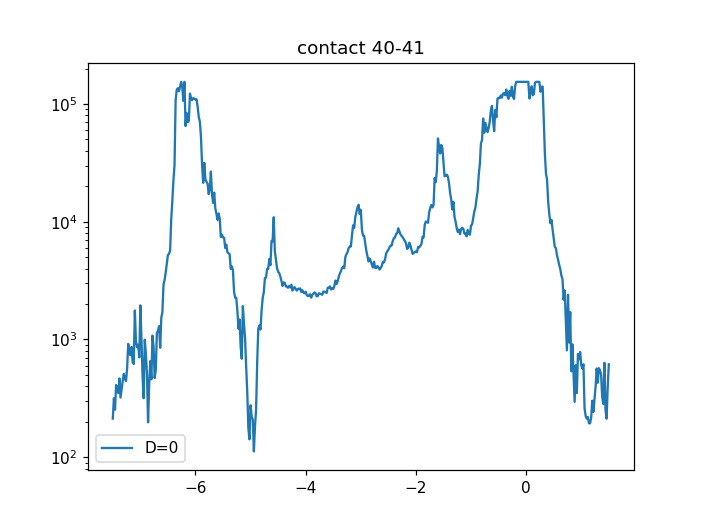

In [1336]:
plt.figure()
plt.semilogy(dataD0cute.zeroDparam_set, npd.Rxxfromdata(dataD0cute, 0.5e-9, 'lockin830'), label='D=0')
#plt.semilogy(dataredcute.constant_D_redline_nsw_set[:]-5.4, npd.Rxxfromdata(dataredcute, 0.5e-9, 'lockin830'), label='red line', color='red')
#plt.semilogy(datagreencute.constant_D_greenline_nsw_set[:]-2.95, npd.Rxxfromdata(datagreencute, 0.5e-9, 'lockin830'), label='green line', color='green')
#plt.semilogy(datagreycute.constant_D_greyline_nsw_set[:]+3.2, npd.Rxxfromdata(datagreycute, 0.5e-9, 'lockin830'), label='grey line', color='grey')
#plt.semilogy(dataorangecute.constant_D_orangeline_nsw_set[:]+7.1, npd.Rxxfromdata(dataorangecute, 0.5e-9, 'lockin830'), label='orange line', color='orange')
plt.title('contact 40-41')
plt.legend()

# T line cut

In [14]:
import colorcet as cc   # install quickly with "conda install colorcet"

In [15]:
from matplotlib import ticker

In [16]:
import matplotlib.colors as colors

In [17]:
from scipy.interpolate import interp2d

In [18]:
dtempbase_orange = qc.load_data('data/2020-05-24/#006_M30_865_28-29_830_40-41_0p5nA_-0p8mT_orangeline_sweep_23-38-15')
dtemp_1_orange = qc.load_data('data/2020-05-25/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_orangeline_0p5nA_00-00-45')
dtemp_2_orange = qc.load_data('data/2020-05-25/#002_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_orangeline_0p5nA_06-27-37')
dtemp_3_orange = qc.load_data('data/2020-05-25/#003_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_orangeline_0p5nA_07-46-45')
dtemp_4_orange = qc.load_data('data/2020-05-25/#004_M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_orangeline_0p5nA_11-57-46')
dtemp_5_orange = qc.load_data('data/2020-05-26/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_orangeline_0p5nA_13-57-02')
dtemp_6_orange = qc.load_data('data/2020-05-26/#002_M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_orangeline_0p5nA_20-10-58')

In [19]:
dtempbase_red = qc.load_data('data/2020-05-27/#002_M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep_10-01-39')
dtemp_1_red = qc.load_data('data/2020-05-27/#003_M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_redline_0p5nA_10-26-44')
dtemp_2_red = qc.load_data('data/2020-05-27/#004_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_redline_0p5nA_16-38-35')
dtemp_3_red = qc.load_data('data/2020-05-27/#005_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_redline_0p5nA_17-54-18')
dtemp_4_red = qc.load_data('data/2020-05-27/#006_M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_redline_0p5nA_20-12-53')
dtemp_5_red = qc.load_data('data/2020-05-28/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_redline_0p5nA_21-13-37')
dtemp_6_red = qc.load_data('data/2020-05-29/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_redline_0p5nA_03-02-32')

In [20]:
dtempbase_blue = qc.load_data('data/2020-06-04/#004_M30_865_28-29_830_40-41_0.5nA_-0p8mT_D0sweep_baseT_12-39-14')
dtemp_1_blue = qc.load_data('data/2020-06-04/#006_M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_D0_0p5nA_13-13-21')
dtemp_2_blue = qc.load_data('data/2020-06-04/#007_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_D0_0p5nA_19-54-05')
dtemp_3_blue = qc.load_data('data/2020-06-04/#008_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_D0_0p5nA_21-15-39')
dtemp_4_blue = qc.load_data('data/2020-06-04/#009_M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_D0_0p5nA_23-32-58')
dtemp_5_blue = qc.load_data('data/2020-06-06/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_D0_0p5nA_02-10-41')
dtemp_6_blue = qc.load_data('data/2020-06-06/#002_M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_D0_0p5nA_08-24-24')

In [21]:
temps = np.concatenate(([0.025], dtemp_1_orange.triton_pid_setpoint_set, dtemp_2_orange.triton_pid_setpoint_set[:], dtemp_3_orange.triton_pid_setpoint_set, dtemp_4_orange.triton_pid_setpoint_set))
temps_high = np.concatenate(([0.025], dtemp_1_orange.triton_pid_setpoint_set, dtemp_2_orange.triton_pid_setpoint_set[:], dtemp_3_orange.triton_pid_setpoint_set, dtemp_4_orange.triton_pid_setpoint_set, dtemp_5_orange.triton_pid_setpoint_set, dtemp_6_orange.triton_pid_setpoint_set))
tgate_orange = dtempbase_orange.constant_D_orangeline_nsw_set[:]
R2829_orange = np.vstack((npd.Rxxfromdata(dtempbase_orange , 0.5e-9), npd.Rxxfromdata(dtemp_1_orange, 0.5e-9), npd.Rxxfromdata(dtemp_2_orange, 0.5e-9), npd.Rxxfromdata(dtemp_3_orange, 0.5e-9), npd.Rxxfromdata(dtemp_4_orange, 0.5e-9)))
R2829_orange_high = np.vstack((npd.Rxxfromdata(dtempbase_orange , 0.5e-9), npd.Rxxfromdata(dtemp_1_orange, 0.5e-9), npd.Rxxfromdata(dtemp_2_orange, 0.5e-9), npd.Rxxfromdata(dtemp_3_orange, 0.5e-9), npd.Rxxfromdata(dtemp_4_orange, 0.5e-9), npd.Rxxfromdata(dtemp_5_orange, 0.5e-9), npd.Rxxfromdata(dtemp_6_orange, 0.5e-9)))
R4041_orange = np.vstack((npd.Rxxfromdata(dtempbase_orange , 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1_orange, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2_orange, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3_orange, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4_orange, 0.5e-9, 'lockin830')))
R4041_orange_high = np.vstack((npd.Rxxfromdata(dtempbase_orange , 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1_orange, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2_orange, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3_orange, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4_orange, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_5_orange, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_6_orange, 0.5e-9, 'lockin830')))

In [22]:
temps = np.concatenate(([0.025], dtemp_1_red.triton_pid_setpoint_set, dtemp_2_red.triton_pid_setpoint_set[:], dtemp_3_red.triton_pid_setpoint_set, dtemp_4_red.triton_pid_setpoint_set[:]))
tgate_red = dtempbase_red.constant_D_redline_nsw_set[:]
R2829_red = np.vstack((npd.Rxxfromdata(dtempbase_red , 0.5e-9), npd.Rxxfromdata(dtemp_1_red, 0.5e-9), npd.Rxxfromdata(dtemp_2_red, 0.5e-9), npd.Rxxfromdata(dtemp_3_red, 0.5e-9), npd.Rxxfromdata(dtemp_4_red, 0.5e-9)))
R2829_red_high = np.vstack((npd.Rxxfromdata(dtempbase_red , 0.5e-9), npd.Rxxfromdata(dtemp_1_red, 0.5e-9), npd.Rxxfromdata(dtemp_2_red, 0.5e-9), npd.Rxxfromdata(dtemp_3_red, 0.5e-9), npd.Rxxfromdata(dtemp_4_red, 0.5e-9), npd.Rxxfromdata(dtemp_5_red, 0.5e-9), npd.Rxxfromdata(dtemp_6_red, 0.5e-9)))
R4041_red = np.vstack((npd.Rxxfromdata(dtempbase_red , 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1_red, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2_red, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3_red, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4_red, 0.5e-9, 'lockin830')))
R4041_red_high = np.vstack((npd.Rxxfromdata(dtempbase_red , 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1_red, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2_red, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3_red, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4_red, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_5_red, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_6_red, 0.5e-9, 'lockin830')))

In [23]:
temps = np.concatenate(([0.025], dtemp_1_blue.triton_pid_setpoint_set, dtemp_2_blue.triton_pid_setpoint_set[:], dtemp_3_blue.triton_pid_setpoint_set, dtemp_4_blue.triton_pid_setpoint_set))
tgate_blue = dtempbase_blue.zeroDparam_set[:]
R2829_blue = np.vstack((npd.Rxxfromdata(dtempbase_blue , 0.5e-9), npd.Rxxfromdata(dtemp_1_blue, 0.5e-9), npd.Rxxfromdata(dtemp_2_blue, 0.5e-9), npd.Rxxfromdata(dtemp_3_blue, 0.5e-9), npd.Rxxfromdata(dtemp_4_blue, 0.5e-9)))
R2829_blue_high = np.vstack((npd.Rxxfromdata(dtempbase_blue , 0.5e-9), npd.Rxxfromdata(dtemp_1_blue, 0.5e-9), npd.Rxxfromdata(dtemp_2_blue, 0.5e-9), npd.Rxxfromdata(dtemp_3_blue, 0.5e-9), npd.Rxxfromdata(dtemp_4_blue, 0.5e-9), npd.Rxxfromdata(dtemp_5_blue, 0.5e-9), npd.Rxxfromdata(dtemp_6_blue, 0.5e-9)))
R4041_blue = np.vstack((npd.Rxxfromdata(dtempbase_blue , 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1_blue, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2_blue, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3_blue, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4_blue, 0.5e-9, 'lockin830')))
R4041_blue_high = np.vstack((npd.Rxxfromdata(dtempbase_blue , 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1_blue, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2_blue, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3_blue, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4_blue, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_5_blue, 0.5e-9, 'lockin830'), npd.Rxxfromdata(dtemp_6_blue, 0.5e-9, 'lockin830')))

In [24]:
R2829_orangecorr = np.copy(R2829_orange)
R2829_orangecorr[R2829_orange <= 0] = np.min(np.abs(R2829_orange[R2829_orange > 0]))
R4041_orangecorr = np.copy(R4041_orange)
R4041_orangecorr[R4041_orange <= 0] = np.min(np.abs(R4041_orange[R4041_orange > 0]))

In [25]:
R2829_redcorr = np.copy(R2829_red)
R2829_redcorr[R2829_red <= 0] = np.min(np.abs(R2829_red[R2829_red > 0]))
R4041_redcorr = np.copy(R4041_red)
R4041_redcorr[R4041_red <= 0] = np.min(np.abs(R4041_red[R4041_red > 0]))

In [26]:
R2829_bluecorr = np.copy(R2829_blue)
R2829_bluecorr[R2829_blue <= 0] = np.min(np.abs(R2829_blue[R2829_blue > 0]))
R4041_bluecorr = np.copy(R4041_blue)
R4041_bluecorr[R4041_blue <= 0] = np.min(np.abs(R4041_blue[R4041_blue > 0]))

In [27]:
tgate_orange_corr = tgate_orange[2:]  # need to correct for a gate offset at baseT
R2829_orangecorr = R2829_orangecorr[:, 2:]
R2829_orangecorr[0, :] = R2829_orange [0, :-2]
R2829_orangecorr[1, :] = R2829_orange [1, 1:-1]
R2829_orangecorr[31, :] = R2829_orange [31, 1:-1]
R2829_orangecorr[32, :] = R2829_orange [32, 1:-1]

In [28]:
tgate_orange_corr = tgate_orange[2:]  # need to correct for a gate offset at baseT
R4041_orangecorr = R4041_orangecorr[:, 2:]
R4041_orangecorr[0, :] = R4041_orange [0, :-2]
R4041_orangecorr[1, :] = R4041_orange [1, 1:-1]
R4041_orangecorr[31, :] = R4041_orange [31, 1:-1]
R4041_orangecorr[32, :] = R4041_orange [32, 1:-1]

In [29]:
tgate_red_corr = tgate_red[1:]  # need to correct for a gate offset at baseT
R2829_redcorr = R2829_redcorr[:, 1:]
R2829_redcorr[1, :] = R2829_red [1, :-1]
R2829_redcorr[2, :] = R2829_red [2, :-1]

In [30]:
tgate_red_corr = tgate_red[1:]  # need to correct for a gate offset at baseT
R4041_redcorr = R4041_redcorr[:, 1:]
R4041_redcorr[1, :] = R4041_red [1, :-1]
R4041_redcorr[2, :] = R4041_red [2, :-1]

In [31]:
def nD2928(Vb, Vt):
    Ct, Cb = 0.0028229350947619513, 0.0005809849079384244
    V0 = -3.07
    n0 = -2*Cb/1.602e-19*V0
    n = (Ct*Vt + Cb*Vb)/1.602e-19 + n0
    D = (Ct*Vt - Cb*Vb)/8.85e-12
    return n/10**16, D/10**9

def nD4041(Vb, Vt):
    Ct, Cb = 0.0028229350947619513, 0.0005809849079384244
    V0 = -3.1
    n0 = -2*Cb/1.602e-19*V0
    n = (Ct*Vt + Cb*Vb)/1.602e-19 + n0
    D = (Ct*Vt - Cb*Vb)/8.85e-12
    return n/10**16, D/10**9

In [32]:
ft = interp2d(tgate_orange_corr, temps, R2829_orangecorr, kind='cubic')

In [33]:
tgate_orange_interp = np.linspace(-13.58, -6.8, 679)
temps_interp = np.linspace(0.025, 2, 80)
R2829_orangecorr_interp = ft(tgate_orange_interp, temps_interp)

In [34]:
ft3 = interp2d(tgate_red_corr, temps, R2829_redcorr, kind='cubic')

In [35]:
tgate_red_interp = np.linspace(-0.5, 6, 651)
temps_interp = np.linspace(0.025, 2, 80)
R2829_redcorr_interp = ft3(tgate_red_interp, temps_interp)

In [36]:
ft5 = interp2d(tgate_blue, temps, R2829_bluecorr, kind='cubic')

In [37]:
tgate_blue_interp = np.linspace(-6.5, 0.6, 711)
temps_interp = np.linspace(0.025, 2, 80)
R2829_bluecorr_interp = ft5(tgate_blue_interp, temps_interp)

<IPython.core.display.Javascript object>


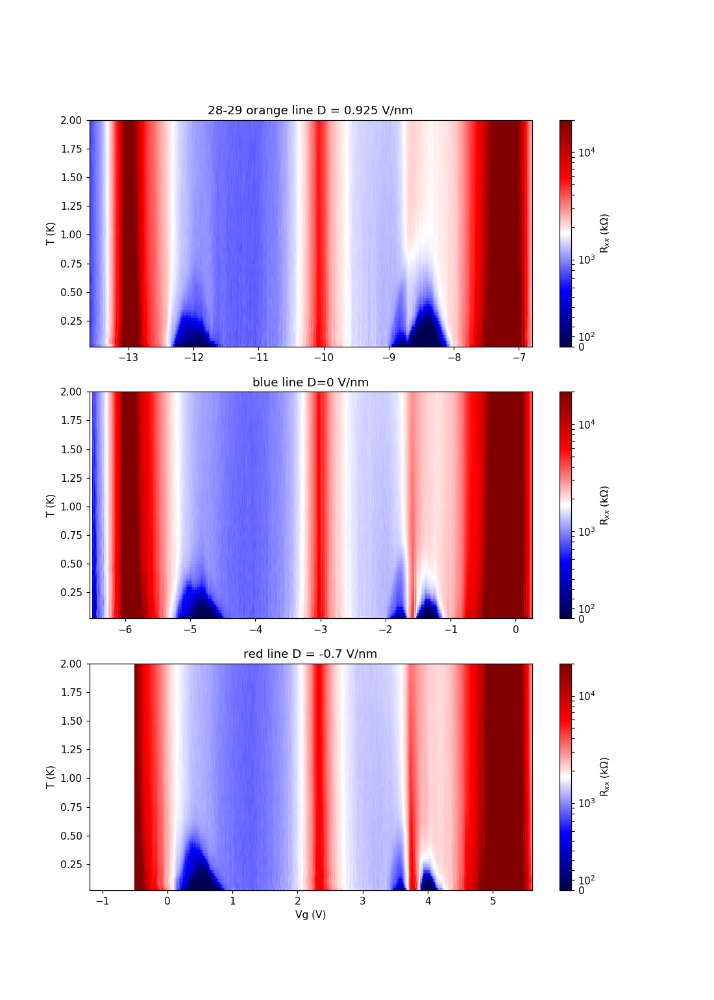

In [38]:
fig, ax = plt.subplots(3, 1, figsize=(10, 14))
coff = colors.SymLogNorm(750, vmin=0, vmax=2e4)

p1 = ax[0].pcolormesh(tgate_orange_interp, temps_interp, R2829_orangecorr_interp, norm=coff, cmap='seismic')
ax[0].set_ylabel('T (K)')
ax[0].set_xlim(-13.6, -6.8)
ax[0].set_title('28-29 orange line D = 0.925 V/nm')
fig.colorbar(p1, ax=ax[0], label='R$_{xx}$ (k$\Omega$)')

p2 = ax[1].pcolormesh(tgate_blue_interp, temps_interp, R2829_bluecorr_interp, norm=coff, cmap='seismic')
ax[1].set_ylabel('T (K)')
ax[1].set_xlim(-6.55, 0.25)
ax[1].set_title('blue line D=0 V/nm')
fig.colorbar(p2, ax=ax[1], label='R$_{xx}$ (k$\Omega$)')

p3 = ax[2].pcolormesh(tgate_red_interp, temps_interp, R2829_redcorr_interp, norm=coff, cmap='seismic')
ax[2].set_ylabel('T (K)')
ax[2].set_xlabel('Vg (V)')
ax[2].set_xlim(-1.2, 5.6)
ax[2].set_title('red line D = -0.7 V/nm')
fig.colorbar(p3, ax=ax[2], label='R$_{xx}$ (k$\Omega$)')

<IPython.core.display.Javascript object>


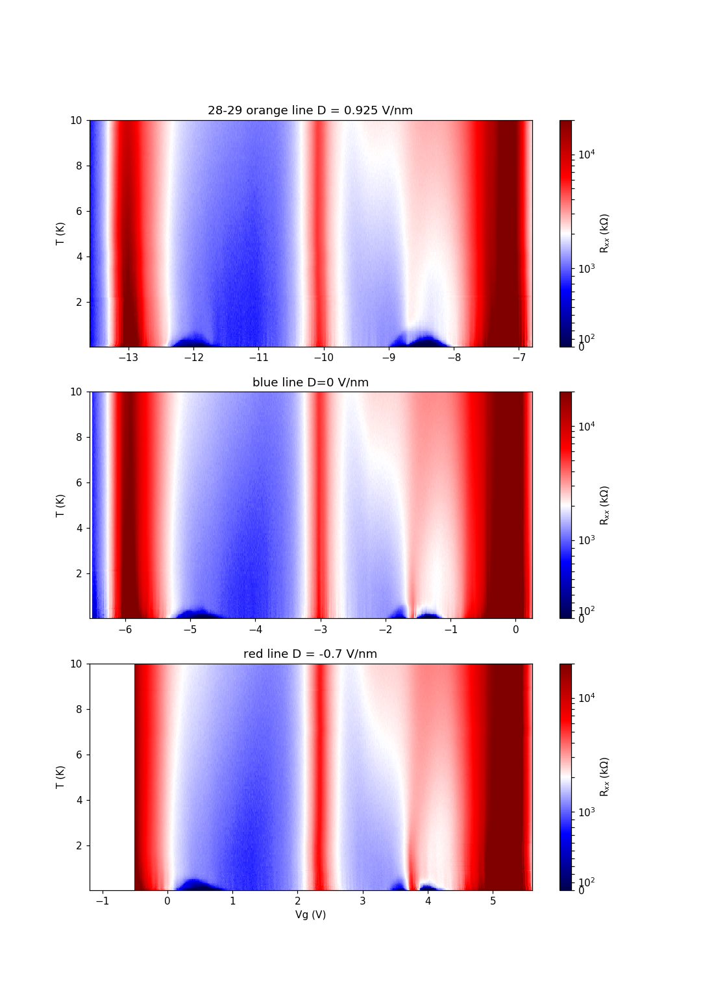

In [94]:
fig, ax = plt.subplots(3, 1, figsize=(10, 14))
coff = colors.SymLogNorm(1000, vmin=0, vmax=2e4)

p1 = ax[0].pcolormesh(tgate_orange_corr, temps, R2829_orangecorr, norm=coff, cmap='seismic')
ax[0].set_ylabel('T (K)')
ax[0].set_xlim(-13.6, -6.8)
ax[0].set_title('28-29 orange line D = 0.925 V/nm')
fig.colorbar(p1, ax=ax[0], label='R$_{xx}$ (k$\Omega$)')

p2 = ax[1].pcolormesh(tgate_blue, temps, R2829_bluecorr, norm=coff, cmap='seismic')
ax[1].set_ylabel('T (K)')
ax[1].set_xlim(-6.55, 0.25)
ax[1].set_title('blue line D=0 V/nm')
fig.colorbar(p2, ax=ax[1], label='R$_{xx}$ (k$\Omega$)')

p3 = ax[2].pcolormesh(tgate_red_corr, temps, R2829_redcorr, norm=coff, cmap='seismic')
ax[2].set_ylabel('T (K)')
ax[2].set_xlabel('Vg (V)')
ax[2].set_xlim(-1.2, 5.6)
ax[2].set_title('red line D = -0.7 V/nm')
fig.colorbar(p3, ax=ax[2], label='R$_{xx}$ (k$\Omega$)')

<IPython.core.display.Javascript object>


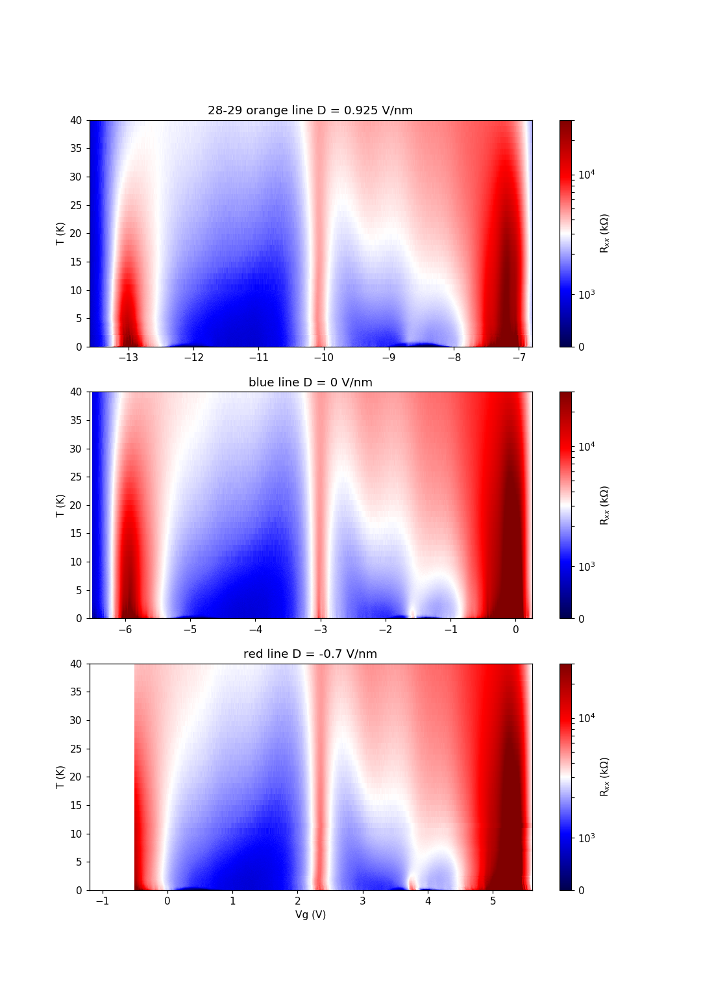

In [102]:
fig, ax = plt.subplots(3, 1, figsize=(10, 14))
coff = colors.SymLogNorm(1500, vmin=0, vmax=3e4)

p1 = ax[0].pcolormesh(tgate_orange, temps_high, R2829_orange_high, norm=coff, cmap='seismic')
ax[0].set_ylabel('T (K)')
ax[0].set_xlim(-13.6, -6.8)
ax[0].set_title('28-29 orange line D = 0.925 V/nm')
fig.colorbar(p1, ax=ax[0], label='R$_{xx}$ (k$\Omega$)')

p2 = ax[1].pcolormesh(tgate_blue, temps_high, R2829_blue_high, norm=coff, cmap='seismic')
ax[1].set_ylabel('T (K)')
ax[1].set_xlim(-6.55, 0.25)
ax[1].set_title('blue line D = 0 V/nm')
fig.colorbar(p2, ax=ax[1], label='R$_{xx}$ (k$\Omega$)')

p3 = ax[2].pcolormesh(tgate_red, temps_high, R2829_red_high, norm=coff, cmap='seismic')
ax[2].set_ylabel('T (K)')
ax[2].set_xlabel('Vg (V)')
ax[2].set_xlim(-1.2, 5.6)
ax[2].set_title('red line D = -0.7 V/nm')
fig.colorbar(p3, ax=ax[2], label='R$_{xx}$ (k$\Omega$)')

In [29]:
ft2 = interp2d(tgate_orange_corr, temps, R4041_orangecorr, kind='cubic')

In [30]:
tgate_orange_interp = np.linspace(-13.58, -6.8, 679)
temps_interp = np.linspace(0.025, 2, 80)
R4041_orangecorr_interp = ft2(tgate_orange_interp, temps_interp)

In [31]:
ft4 = interp2d(tgate_red_corr, temps, R4041_redcorr, kind='cubic')

In [32]:
tgate_red_interp = np.linspace(-0.5, 6, 651)
temps_interp = np.linspace(0.025, 2, 80)
R4041_redcorr_interp = ft4(tgate_red_interp, temps_interp)

In [57]:
ft6 = interp2d(tgate_blue, temps, R4041_bluecorr, kind='cubic')

In [58]:
tgate_blue_interp = np.linspace(-6.5, 0.6, 711)
temps_interp = np.linspace(0.025, 2, 80)
R4041_bluecorr_interp = ft6(tgate_blue_interp, temps_interp)

<IPython.core.display.Javascript object>


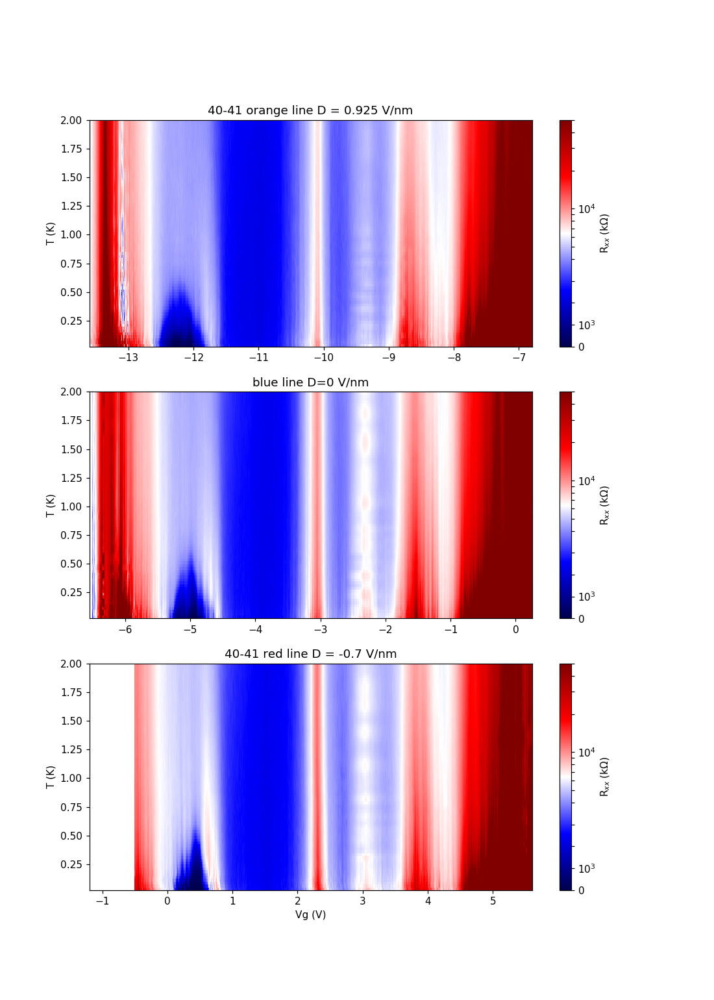

In [95]:
fig, ax = plt.subplots(3, 1, figsize=(10, 14))
coff = colors.SymLogNorm(4000, vmin=0, vmax=5e4)

p1 = ax[0].pcolormesh(tgate_orange_interp, temps_interp, R4041_orangecorr_interp, norm=coff, cmap='seismic')
ax[0].set_ylabel('T (K)')
ax[0].set_xlim(-13.6, -6.8)
ax[0].set_title('40-41 orange line D = 0.925 V/nm')
fig.colorbar(p1, ax=ax[0], label='R$_{xx}$ (k$\Omega$)')

p2 = ax[1].pcolormesh(tgate_blue_interp, temps_interp, R4041_bluecorr_interp, norm=coff, cmap='seismic')
ax[1].set_ylabel('T (K)')
ax[1].set_xlim(-6.55, 0.25)
ax[1].set_title('blue line D=0 V/nm')
fig.colorbar(p2, ax=ax[1], label='R$_{xx}$ (k$\Omega$)')

p3 = ax[2].pcolormesh(tgate_red_interp, temps_interp, R4041_redcorr_interp, norm=coff, cmap='seismic')
ax[2].set_ylabel('T (K)')
ax[2].set_xlabel('Vg (V)')
ax[2].set_xlim(-1.2, 5.6)
ax[2].set_title('40-41 red line D = -0.7 V/nm')
fig.colorbar(p3, ax=ax[2], label='R$_{xx}$ (k$\Omega$)')

<IPython.core.display.Javascript object>


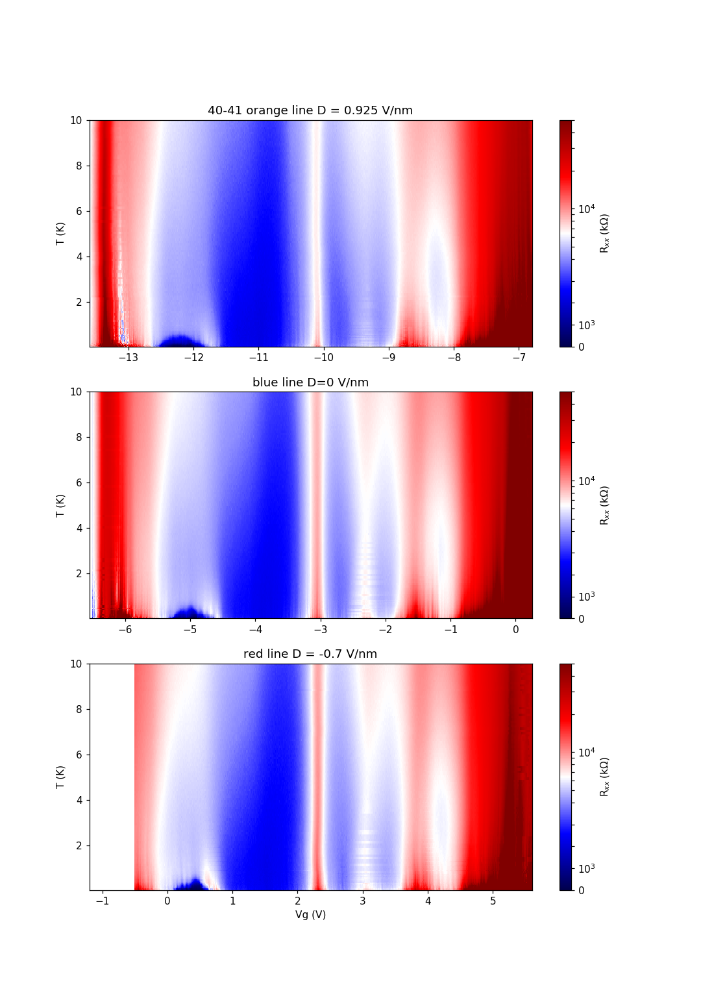

In [96]:
fig, ax = plt.subplots(3, 1, figsize=(10, 14))
coff = colors.SymLogNorm(4000, vmin=0, vmax=5e4)

p1 = ax[0].pcolormesh(tgate_orange_corr, temps, R4041_orangecorr, norm=coff, cmap='seismic')
ax[0].set_ylabel('T (K)')
ax[0].set_xlim(-13.6, -6.8)
ax[0].set_title('40-41 orange line D = 0.925 V/nm')
fig.colorbar(p1, ax=ax[0], label='R$_{xx}$ (k$\Omega$)')

p2 = ax[1].pcolormesh(tgate_blue, temps, R4041_bluecorr, norm=coff, cmap='seismic')
ax[1].set_ylabel('T (K)')
ax[1].set_xlim(-6.55, 0.25)
ax[1].set_title('blue line D=0 V/nm')
fig.colorbar(p2, ax=ax[1], label='R$_{xx}$ (k$\Omega$)')

p3 = ax[2].pcolormesh(tgate_red_corr, temps, R4041_redcorr, norm=coff, cmap='seismic')
ax[2].set_ylabel('T (K)')
ax[2].set_xlabel('Vg (V)')
ax[2].set_xlim(-1.2, 5.6)
ax[2].set_title('red line D = -0.7 V/nm')
fig.colorbar(p3, ax=ax[2], label='R$_{xx}$ (k$\Omega$)')

<IPython.core.display.Javascript object>


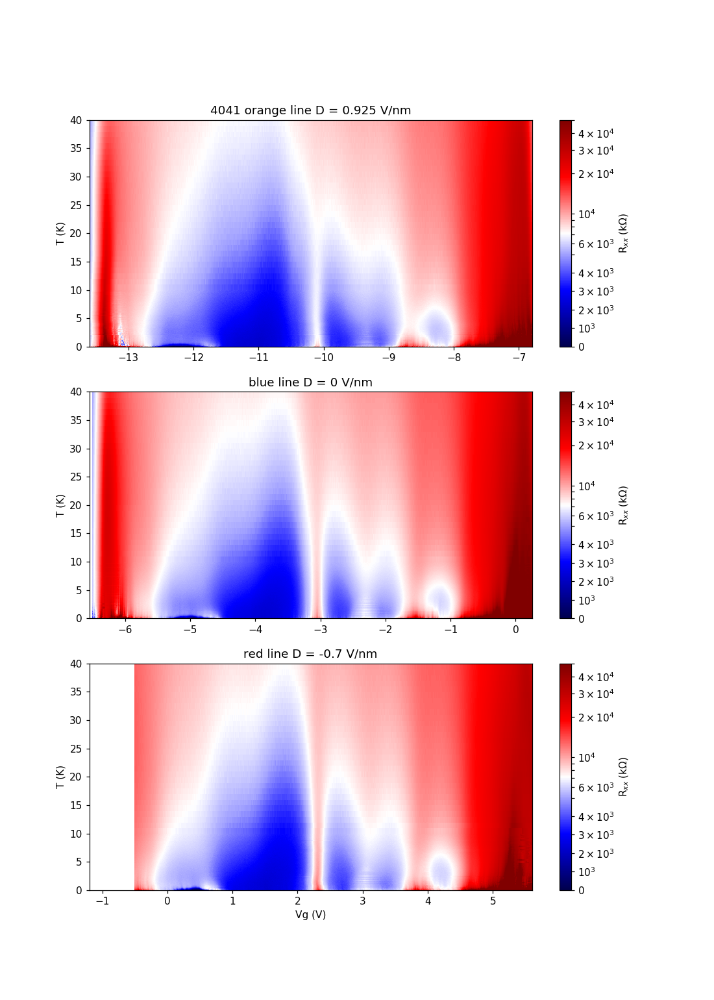

In [103]:
fig, ax = plt.subplots(3, 1, figsize=(10, 14))
coff = colors.SymLogNorm(5000, vmin=0, vmax=5e4)

p1 = ax[0].pcolormesh(tgate_orange, temps_high, R4041_orange_high, norm=coff, cmap='seismic')
ax[0].set_ylabel('T (K)')
ax[0].set_xlim(-13.6, -6.8)
ax[0].set_title('4041 orange line D = 0.925 V/nm')
fig.colorbar(p1, ax=ax[0], label='R$_{xx}$ (k$\Omega$)')

p2 = ax[1].pcolormesh(tgate_blue, temps_high, R4041_blue_high, norm=coff, cmap='seismic')
ax[1].set_ylabel('T (K)')
ax[1].set_xlim(-6.55, 0.25)
ax[1].set_title('blue line D = 0 V/nm')
fig.colorbar(p2, ax=ax[1], label='R$_{xx}$ (k$\Omega$)')

p3 = ax[2].pcolormesh(tgate_red, temps_high, R4041_red_high, norm=coff, cmap='seismic')
ax[2].set_ylabel('T (K)')
ax[2].set_xlabel('Vg (V)')
ax[2].set_xlim(-1.2, 5.6)
ax[2].set_title('red line D = -0.7 V/nm')
fig.colorbar(p3, ax=ax[2], label='R$_{xx}$ (k$\Omega$)')

# line cut of critical current and point of Fraunhofer 28-29 

<IPython.core.display.Javascript object>


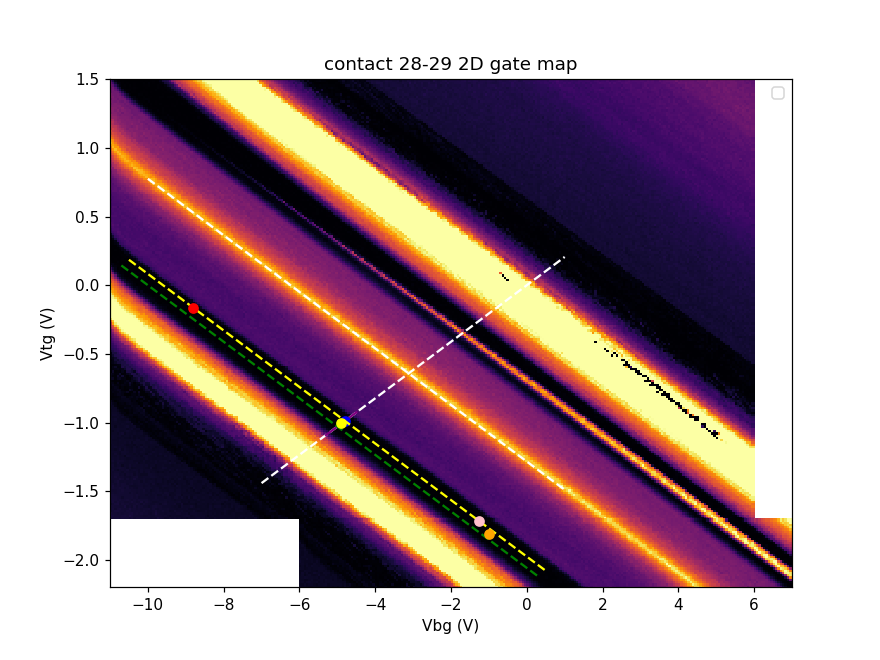

No handles with labels found to put in legend.


In [1211]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin865_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='white', linestyle='dashed')

#x3 = np.array([-5,5])
#plt.plot(x3, x3*(slDrc)+0.3, color='red', linestyle='dashed')

x4 = np.array([-4.5,-5.3])
plt.plot(x4, x4*(-slDrc), color='purple')

x5 = -4.8
plt.plot(x5, x5*(-slDrc), color='blue', marker='o')

#constant n line cross the maximized critical current point
b_maxSC_hole = x5*(-slDrc) - x5*slDrc
x6 = np.array([-10.5,0.5])
plt.plot(x6, x6*slDrc + b_maxSC_hole, color='yellow', linestyle='dashed')

#constant n line cross the x7
x7 = -5
b_SC_hole2 = x7*(-slDrc) - x7*slDrc
x8 = np.array([-10.7,0.3])
plt.plot(x8, x8*slDrc + b_SC_hole2, color='green', linestyle='dashed')


x6 = -1.25
plt.plot(x6, x6*slDrc+b_maxSC_hole, color='pink', marker='o')

x8 = -8.8
plt.plot(x8, x8*slDrc+b_maxSC_hole, color='red', marker='o')

x9 = -1
plt.plot(x9, x9*slDrc + b_SC2_hole40_41, color='orange', marker='o')

x10 = -4.9
plt.plot(x10, x10*slDrc + b_SC2_hole40_41, color='yellow', marker='o')



plt.legend()

In [411]:
data_dVdI1 = qc.load_data('data/2020-05-08/#036_M30_865_29-28__830_40-41_0p5nAexc_D0_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_17-47-39')

<IPython.core.display.Javascript object>


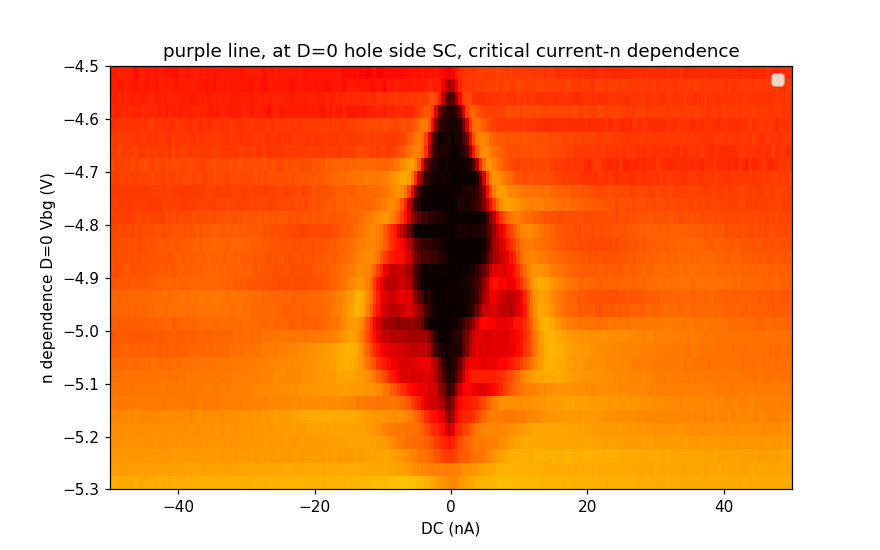

No handles with labels found to put in legend.


In [1077]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI1.srdc_volt_set[0,:]*10,data_dVdI1.zeroDparam_set[:],data_dVdI1.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(800, vmin=0, vmax=1e4))
plt.xlabel('DC (nA)')
plt.ylabel('n dependence D=0 Vbg (V)')
plt.title('purple line, at D=0 hole side SC, critical current-n dependence')
plt.legend()

In [449]:
data_dVdI2 = qc.load_data('data/2020-05-09/#007_M30_865_29-28__830_40-41_0p5nAexc_maxSChole_cosntant_n_D_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_11-50-46')

<IPython.core.display.Javascript object>


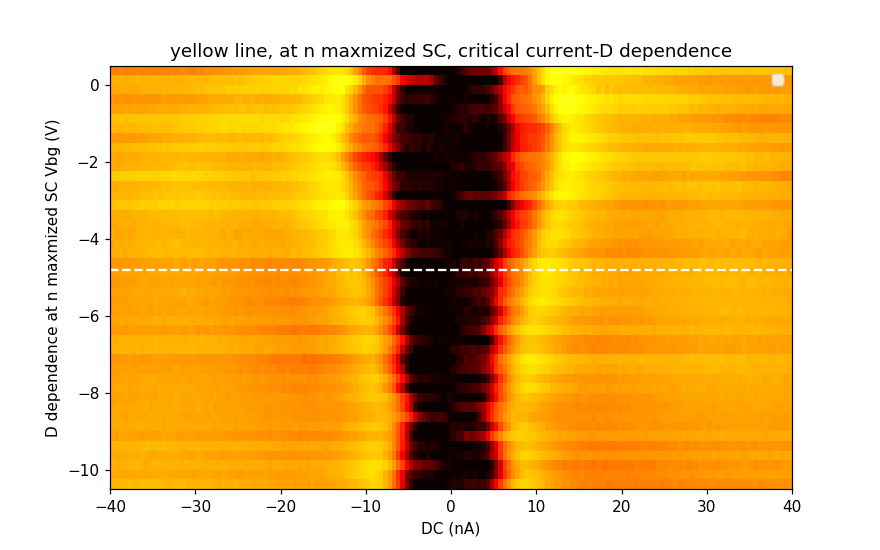

No handles with labels found to put in legend.


In [1149]:
plt.figure(figsize=(8,5)) # more data check the electrodes 40-41
plt.pcolormesh(data_dVdI2.srdc_volt_set[0,:]*10,data_dVdI2.constant_n_maxholeSC_set[:],data_dVdI2.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(500, vmin=0, vmax=6e3))
x1 = np.array([-40,40])
plt.plot(x1, x1*0-4.8, color='white', linestyle='dashed')
plt.xlabel('DC (nA)')
plt.ylabel('D dependence at n maxmized SC Vbg (V)')
plt.title('yellow line, at n maxmized SC, critical current-D dependence')
plt.legend()

critical current has D field dependence

In [496]:
data_dVdI3 = qc.load_data('data/2020-05-09/#011_M30_865_29-28__830_40-41_0p5nAexc_SChole_cosntant_n_D_sweep2_AC0.5nAdvdi_baseT_b=-0.8mT_16-12-31')

<IPython.core.display.Javascript object>


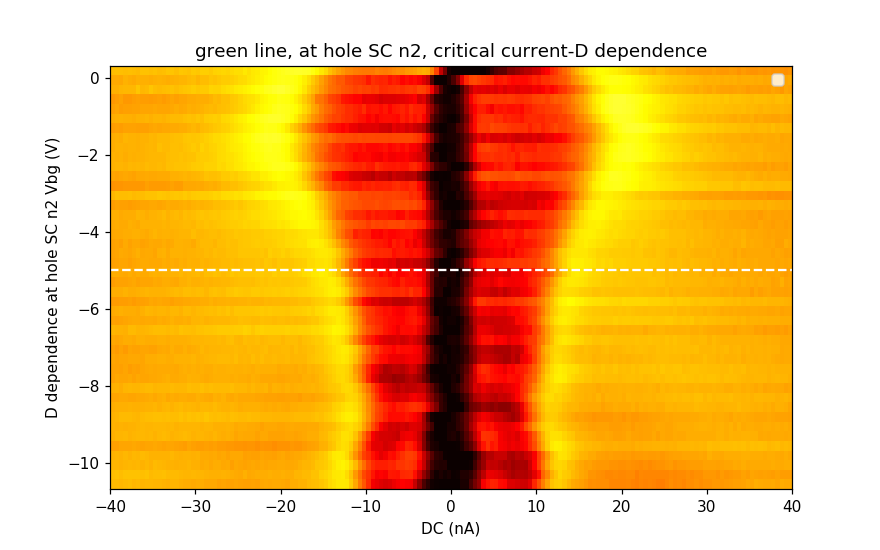

No handles with labels found to put in legend.


In [508]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI3.srdc_volt_set[0,:]*10,data_dVdI3.constant_n_holeSC2_set[:],data_dVdI3.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(700, vmin=0, vmax=6e3))
x1 = np.array([-40,40])
plt.plot(x1, x1*0-5, color='white', linestyle='dashed')
plt.xlabel('DC (nA)')
plt.ylabel('D dependence at hole SC n2 Vbg (V)')
plt.title('green line, at hole SC n2, critical current-D dependence')
plt.legend()

In [1016]:
data28_29_Fraunhofer1 = qc.load_data('data/2020-05-08/#041_M30_865_29-28__830_40-41_0p5nAexc_D0_vbg-4p8V_FraunhoferbaseT_23-41-30')

In [1020]:
data28_29_Fraunhofer3 = qc.load_data('data/2020-05-10/#002_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-4p8_FraunhoferbaseT_22-02-16')

In [1032]:
data28_29_Fraunhofer2 = qc.load_data('data/2020-05-09/#014_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_FraunhoferbaseT_20-36-38')

In [1050]:
data28_29_Fraunhofer4 = qc.load_data('data/2020-05-10/#001_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_FraunhoferbaseT_09-29-58')

In [1116]:
data28_29_Fraunhofer5 = qc.load_data('data/2020-05-11/#023_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-8p8_FraunhoferbaseT_22-39-03')

<IPython.core.display.Javascript object>


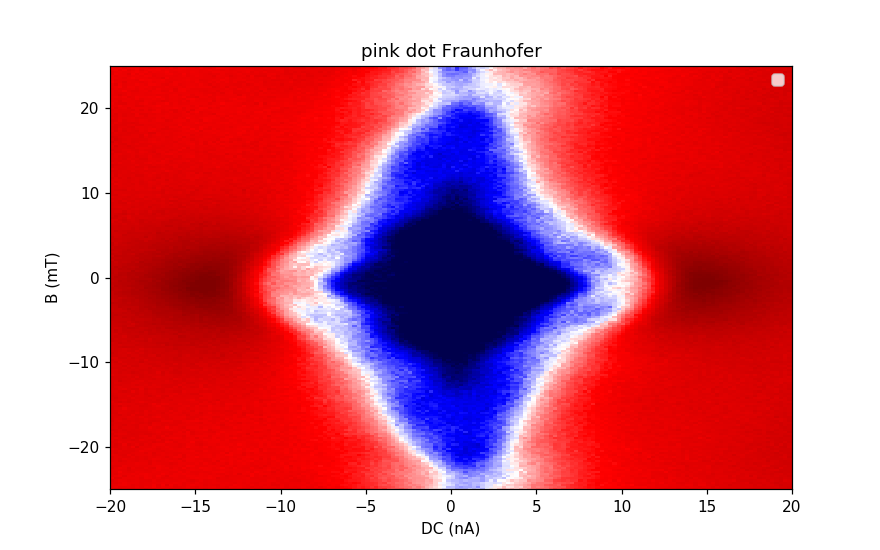

No handles with labels found to put in legend.


In [1140]:
coff = colors.SymLogNorm(700, vmin=100, vmax=2000)
plt.figure(figsize=(8,5))
plt.pcolormesh(data28_29_Fraunhofer4.srdc_volt_set[0,:]*10,data28_29_Fraunhofer4.triton_field_set_stable_set[:]*1000,data28_29_Fraunhofer4.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('pink dot Fraunhofer')
plt.legend()

<IPython.core.display.Javascript object>


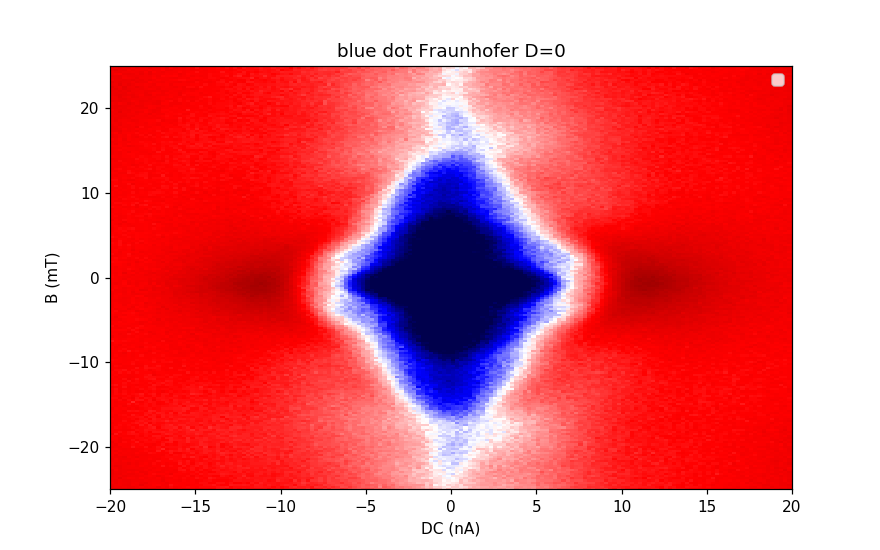

No handles with labels found to put in legend.


In [1148]:
coff = colors.SymLogNorm(700, vmin=100, vmax=2000)
plt.figure(figsize=(8,5))
plt.pcolormesh(data28_29_Fraunhofer3.srdc_volt_set[0,:]*10,data28_29_Fraunhofer3.triton_field_set_stable_set[:]*1000,data28_29_Fraunhofer3.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('blue dot Fraunhofer D=0')
plt.legend()

<IPython.core.display.Javascript object>


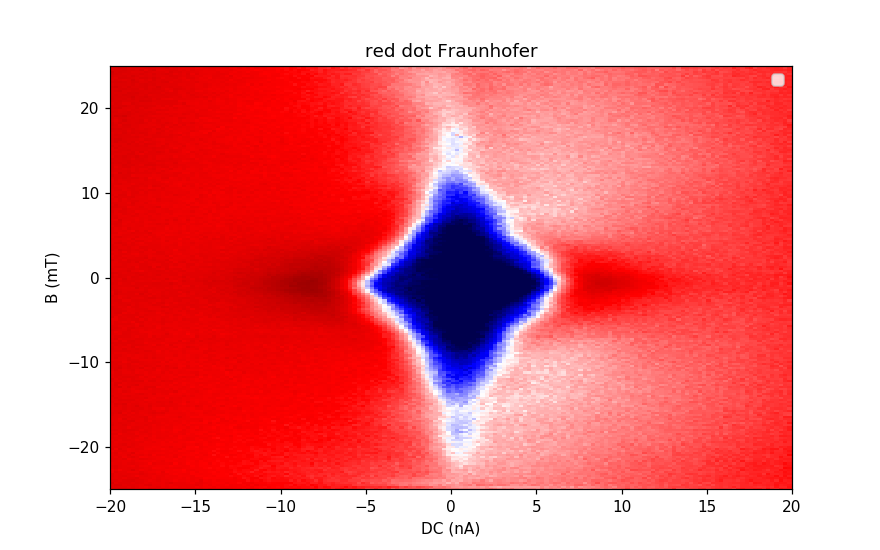

No handles with labels found to put in legend.


In [1242]:
coff = colors.SymLogNorm(700, vmin=100, vmax=2000)
plt.figure(figsize=(8,5))
plt.pcolormesh(data28_29_Fraunhofer5.srdc_volt_set[0,:]*10,data28_29_Fraunhofer5.triton_field_set_stable_set[:]*1000,data28_29_Fraunhofer5.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('red dot Fraunhofer')
plt.ylim(-25,25)
plt.legend()

<IPython.core.display.Javascript object>


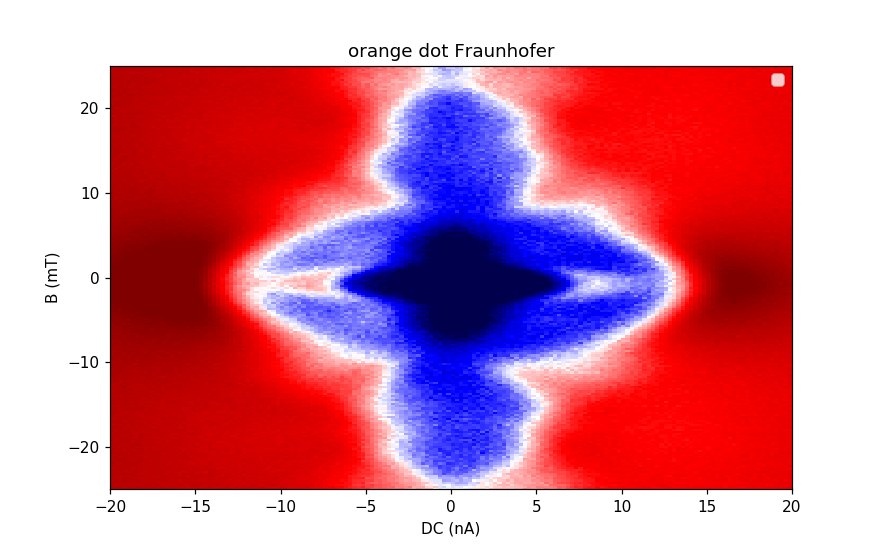

No handles with labels found to put in legend.


In [1212]:
coff = colors.SymLogNorm(700, vmin=100, vmax=2000)#not zero
plt.figure(figsize=(8,5))
plt.pcolormesh(data40_41_Fraunhofer6.lockin865_sine_outdc_set[0,:]*10,data40_41_Fraunhofer6.triton_field_set_stable_set[:]*1000,data40_41_Fraunhofer6.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylim(-25, 25)
plt.ylabel('B (mT)')
plt.title('orange dot Fraunhofer')
plt.legend()

<IPython.core.display.Javascript object>


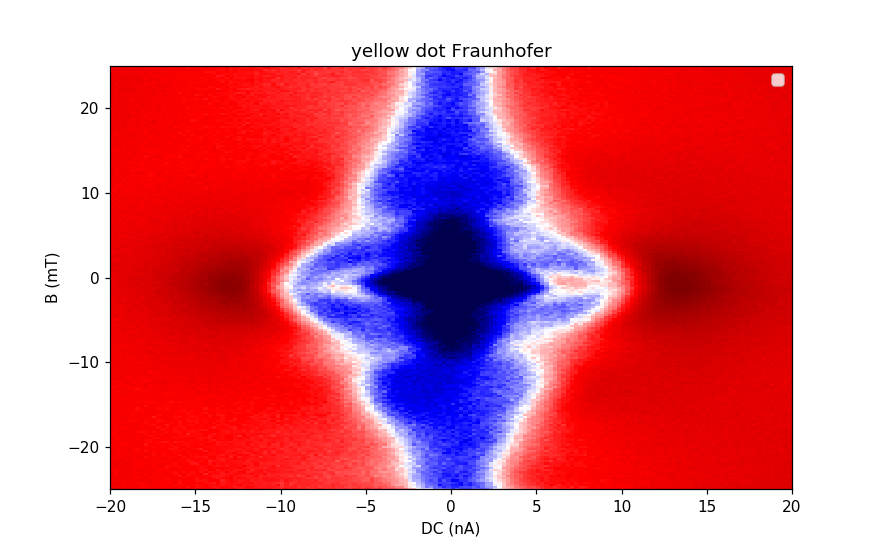

No handles with labels found to put in legend.


In [1227]:
coff = colors.SymLogNorm(700, vmin=100, vmax=2000)#not zero
plt.figure(figsize=(8,5))
plt.pcolormesh(data40_41_Fraunhofer7.lockin865_sine_outdc_set[0,:]*10,data40_41_Fraunhofer7.triton_field_set_stable_set[:]*1000,data40_41_Fraunhofer7.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylim(-25, 25)
plt.ylabel('B (mT)')
plt.title('yellow dot Fraunhofer')
plt.legend()

# line cut of critical current and point of Fraunhofer 40-41 

<IPython.core.display.Javascript object>


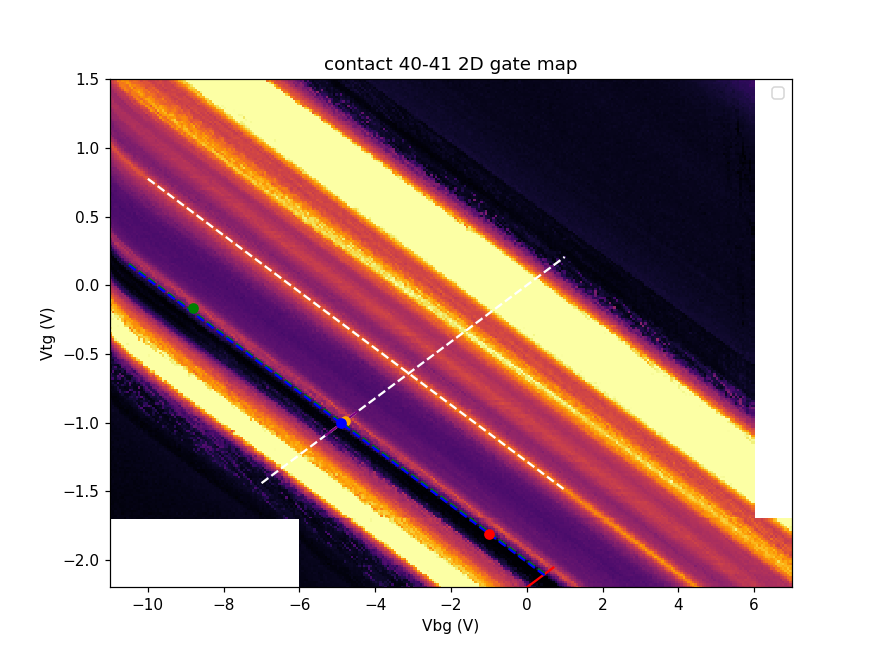

No handles with labels found to put in legend.


In [1241]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin830_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin830_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(4000, vmin=0, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 40-41 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='white', linestyle='dashed')

x4 = np.array([-4.5,-5.3])
plt.plot(x4, x4*(-slDrc), color='purple')

x5 = -4.8
plt.plot(x5, x5*(-slDrc), color='orange', marker='o')

#constant n line cross the maximized critical current point of 28-29
b_maxSC_hole = x5*(-slDrc) - x5*slDrc
x6 = np.array([-10.5,0.5])
#plt.plot(x6, x6*slDrc + b_maxSC_hole, color='yellow', linestyle='dashed')

x7 = np.array([0,0.7])
plt.plot(x7, x7*(-slDrc)-2.2, color='red')

x8 = 0.475
#plt.plot(x8, x8*(-slDrc)-2.2, color='red', marker='o')

#constant n line cross the maximized critical current point of 40-41 red dot
b_maxSC_hole40_41 = x8*(-slDrc) - 2.2 - x8*slDrc
x9 = np.array([-10.5,0.5])
plt.plot(x9, x9*slDrc + b_maxSC_hole40_41, color='green', linestyle='dashed')

x10 = 0.45
#constant n line cross the second point of 40-41 red dot
b_SC2_hole40_41 = x10*(-slDrc) - 2.2 - x10*slDrc
x11 = np.array([-10.5,0.5])
plt.plot(x11, x11*slDrc + b_SC2_hole40_41, color='blue', linestyle='dashed')

x12 = -4.9
plt.plot(x12, x12*slDrc + b_SC2_hole40_41, color='blue', marker='o')

x14 = -1
plt.plot(x14, x14*slDrc + b_SC2_hole40_41, color='red', marker='o')

x13 = -8.8
plt.plot(x13, x13*slDrc+b_maxSC_hole, color='green', marker='o')

plt.legend()

<IPython.core.display.Javascript object>


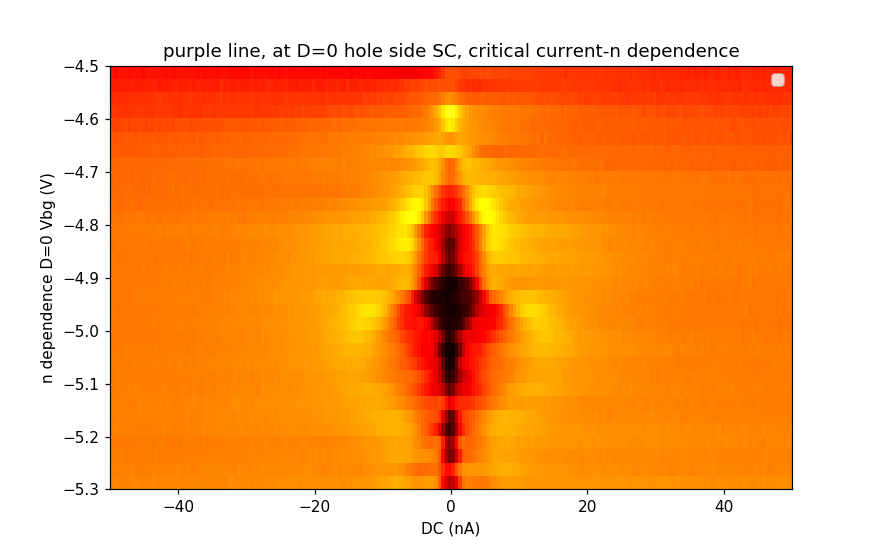

No handles with labels found to put in legend.


In [1055]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI1.srdc_volt_set[0,:]*10,data_dVdI1.zeroDparam_set[:],data_dVdI1.lockin830_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(4000, vmin=0, vmax=2e4))
plt.xlabel('DC (nA)')
plt.ylabel('n dependence D=0 Vbg (V)')
plt.title('purple line, at D=0 hole side SC, critical current-n dependence')
plt.legend()

<IPython.core.display.Javascript object>


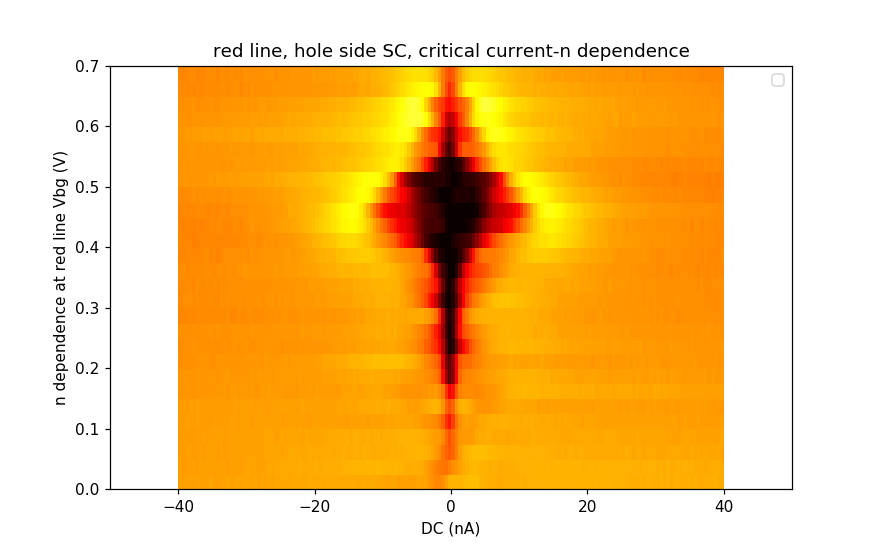

No handles with labels found to put in legend.


In [1270]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI4.srdc_volt_set[0,:]*10,data_dVdI4.constant_D_redline_nsw_set[:],data_dVdI4.lockin830_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(4000, vmin=0, vmax=2e4))
plt.xlabel('DC (nA)')
plt.ylabel('n dependence at red line Vbg (V)')
plt.title('red line, hole side SC, critical current-n dependence')
plt.xlim(-50,50)
plt.legend()

In [1170]:
data_dVdI5 = qc.load_data('data/2020-05-11/#014_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxSC_40_41_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT_18-39-28')

<IPython.core.display.Javascript object>


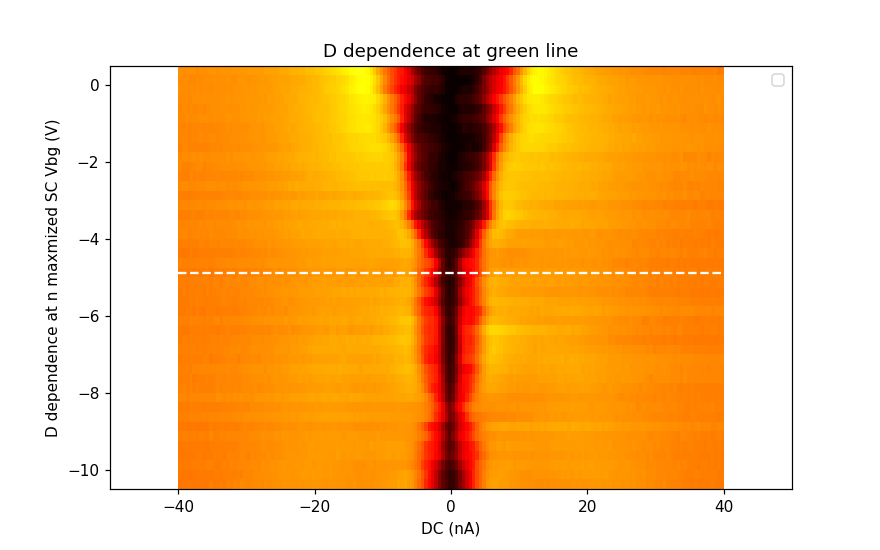

No handles with labels found to put in legend.


In [1238]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI5.srdc_volt_set[0,:]*10,data_dVdI5.constant_n_maxSC_40_41_Dsw_set[:],data_dVdI5.lockin830_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(4000, vmin=0, vmax=2e4))
x1 = np.array([-40,40])
plt.plot(x1, x1*0-4.87, color='white', linestyle='dashed')
plt.xlabel('DC (nA)')
plt.ylabel('D dependence at n maxmized SC Vbg (V)')
plt.title('D dependence at green line')
plt.xlim(-50,50)
plt.legend()

In [1172]:
data_dVdI6 = qc.load_data('data/2020-05-12/#004_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT_13-03-02')

<IPython.core.display.Javascript object>


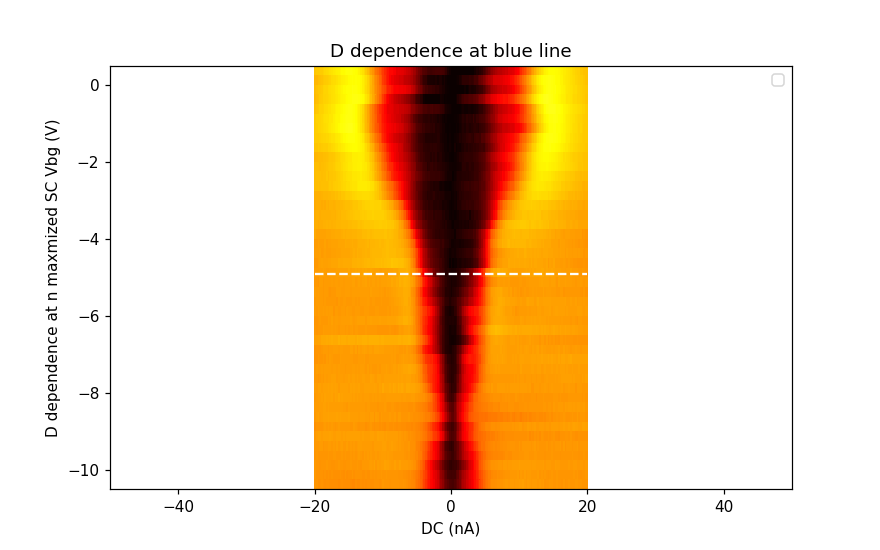

No handles with labels found to put in legend.


In [1237]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI6.lockin865_sine_outdc_set[0,:]*10,data_dVdI6.constant_n_SC2_40_41_Dsw_set[:],data_dVdI6.lockin830_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(4000, vmin=0, vmax=2e4))
x1 = np.array([-20,20])
plt.plot(x1, x1*0-4.895, color='white', linestyle='dashed')
plt.xlabel('DC (nA)')
plt.ylabel('D dependence at n maxmized SC Vbg (V)')
plt.title('D dependence at blue line')
plt.xlim(-50,50)
plt.legend()

In [1181]:
data40_41_Fraunhofer6 = qc.load_data('data/2020-05-12/#008_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-1_FraunhoferbaseT_17-00-22')

<IPython.core.display.Javascript object>


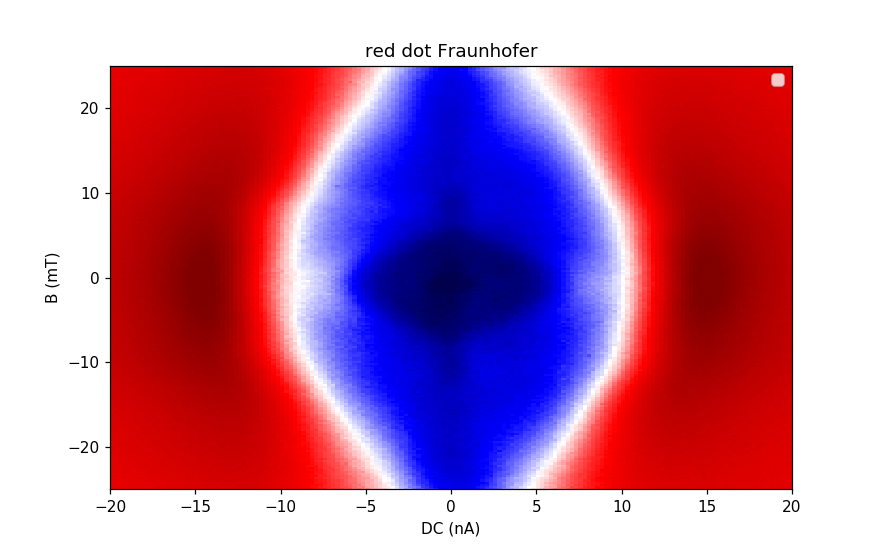

No handles with labels found to put in legend.


In [1208]:
coff = colors.SymLogNorm(4000, vmin=0, vmax=9000)
plt.figure(figsize=(8,5))
plt.pcolormesh(data40_41_Fraunhofer6.lockin865_sine_outdc_set[0,:]*10,data40_41_Fraunhofer6.triton_field_set_stable_set[:]*1000,data40_41_Fraunhofer6.lockin830_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylim(-25, 25)
plt.ylabel('B (mT)')
plt.title('red dot Fraunhofer')
plt.legend()

In [1223]:
data40_41_Fraunhofer7 = qc.load_data('data/2020-05-13/#001_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-4p9_FraunhoferbaseT_05-38-25')

<IPython.core.display.Javascript object>


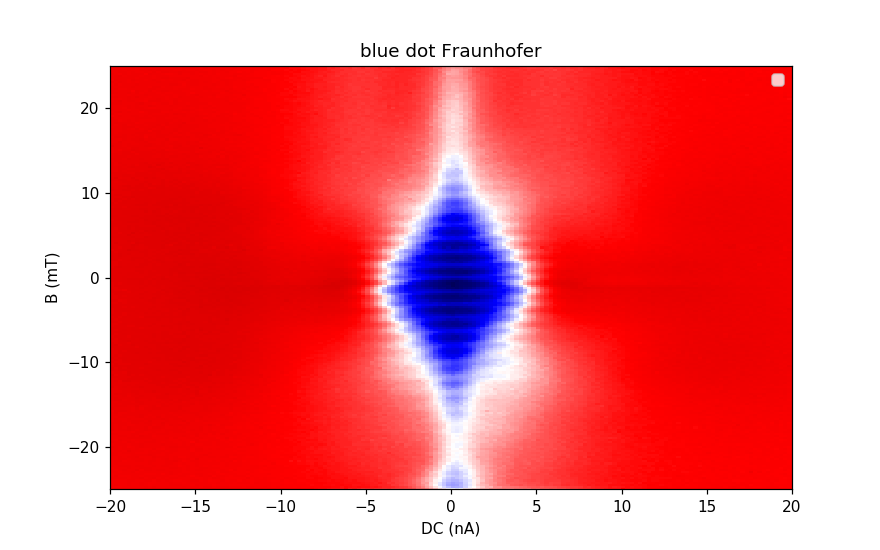

No handles with labels found to put in legend.


In [1225]:
coff = colors.SymLogNorm(4000, vmin=0, vmax=9000)
plt.figure(figsize=(8,5))
plt.pcolormesh(data40_41_Fraunhofer7.lockin865_sine_outdc_set[0,:]*10,data40_41_Fraunhofer7.triton_field_set_stable_set[:]*1000,data40_41_Fraunhofer7.lockin830_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylim(-25, 25)
plt.ylabel('B (mT)')
plt.title('blue dot Fraunhofer')
plt.legend()

<IPython.core.display.Javascript object>


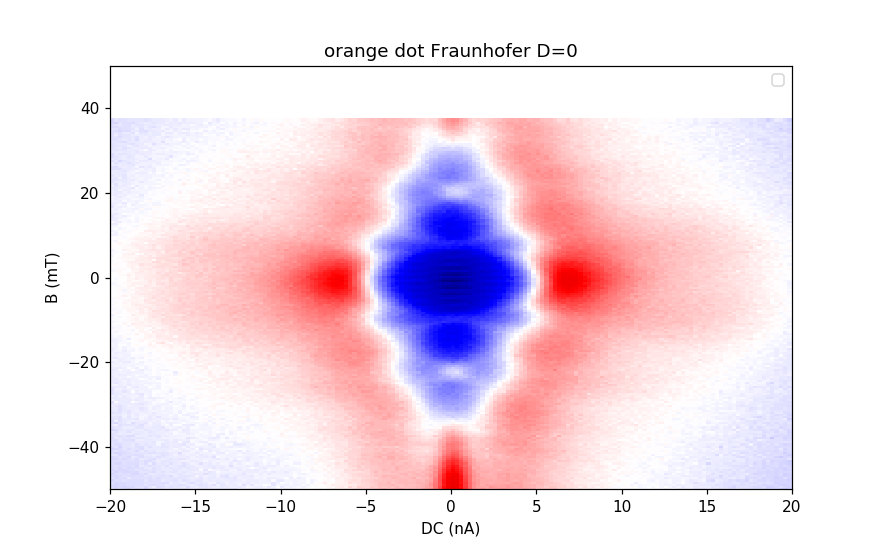

No handles with labels found to put in legend.


In [1183]:
coff = colors.SymLogNorm(8000, vmin=1000, vmax=12000)#not zero
plt.figure(figsize=(8,5))
plt.pcolormesh(data_Fraunhofer1.srdc_volt_set[0,:]*10,data_Fraunhofer1.triton_field_set_stable_set[:176]*1000,data_Fraunhofer1.lockin830_X[:176,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylim(-50, 50)
plt.ylabel('B (mT)')
plt.title('orange dot Fraunhofer D=0')
plt.legend()

<IPython.core.display.Javascript object>


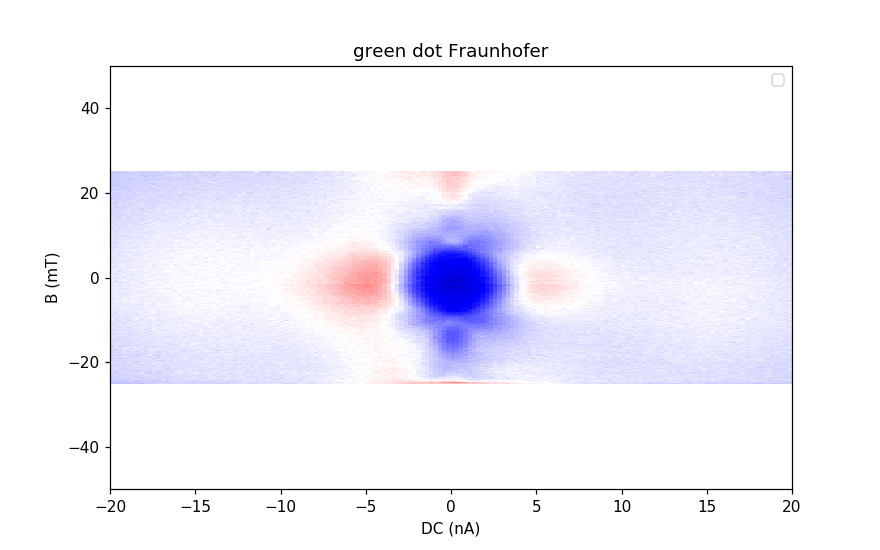

No handles with labels found to put in legend.


In [1179]:
coff = colors.SymLogNorm(8000, vmin=1000, vmax=12000)#not zero
plt.figure(figsize=(8,5))
plt.pcolormesh(data28_29_Fraunhofer5.srdc_volt_set[0,:]*10,data28_29_Fraunhofer5.triton_field_set_stable_set[:]*1000,data28_29_Fraunhofer5.lockin830_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('green dot Fraunhofer')
plt.ylim(-50,50)
plt.legend()

# line cut of critical current and point of Fraunhofer 28-29 electron SC

<IPython.core.display.Javascript object>


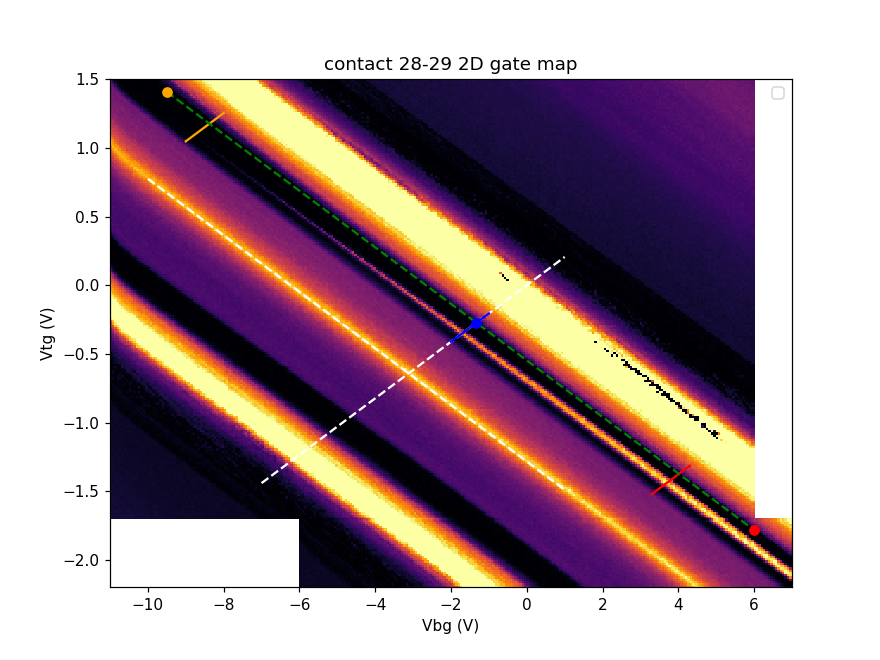

No handles with labels found to put in legend.


In [1348]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin865_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x0 = np.array([-7,1])
plt.plot(x0, x0*(-slDrc), color='white', linestyle='dashed')

x2 = np.array([-2,-1])
plt.plot(x2, x2*(-slDrc), color='blue')

x3 = np.array([-9,-8])
plt.plot(x3, x3*(-slDrc)+2.9, color='orange')

x4 = np.array([3.3,4.3])
plt.plot(x4, x4*(-slDrc)-2.2, color='red')

x5 = -8.375

#constant n line cross the maximized critical current point of 28-29 electron SC red dot
b_maxSC_electron_28_29 = x5*(-slDrc) + 2.9 - x5*slDrc
x6 = np.array([-9.5,6])
plt.plot(x6, x6*slDrc + b_maxSC_electron_28_29, color='green', linestyle='dashed')

x7 = -9.5
plt.plot(x7, x7*slDrc + b_maxSC_electron_28_29 , color='orange', marker='o')

x8 = -1.33
plt.plot(x8, x8*slDrc + b_maxSC_electron_28_29 , color='blue', marker='o')

x9 = 6
plt.plot(x9, x9*slDrc + b_maxSC_electron_28_29 , color='red', marker='o')

plt.legend()

In [1244]:
data_dVdI7 = qc.load_data('data/2020-05-13/#003_M30_865_29-28__830_40-41_0p5nAexc_constantDcut_orangeline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_18-35-24')

<IPython.core.display.Javascript object>


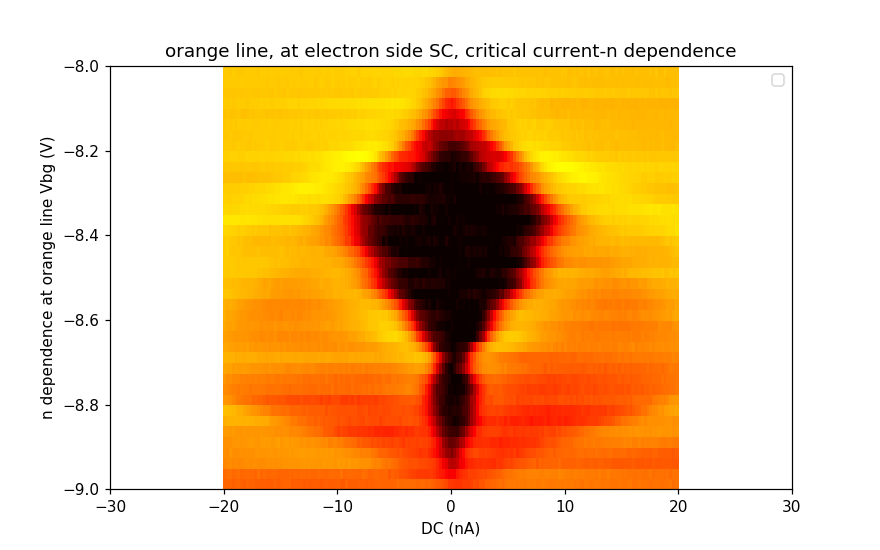

No handles with labels found to put in legend.


In [1257]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI7.lockin865_sine_outdc_set[0,:]*10,data_dVdI7.constant_D_orangeline_nsw_set[:],data_dVdI7.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(800, vmin=0, vmax=8e3))
plt.xlabel('DC (nA)')
plt.ylabel('n dependence at orange line Vbg (V)')
plt.title('orange line, at electron side SC, critical current-n dependence')
plt.xlim(-30,30)
plt.legend()

In [1303]:
data_dVdI9 = qc.load_data('data/2020-05-14/#003_M30_865_29-28__830_40-41_0p5nAexc_zeroDparam_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_14-03-28')

<IPython.core.display.Javascript object>


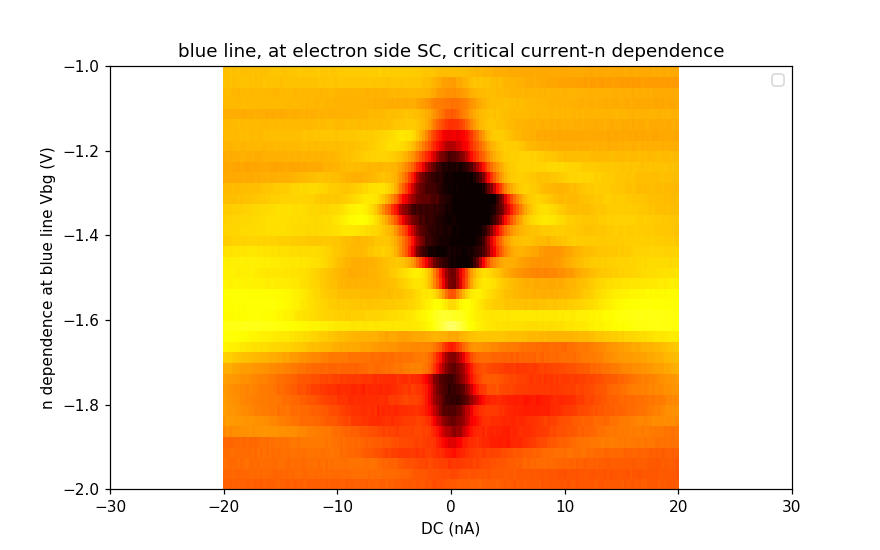

No handles with labels found to put in legend.


In [1307]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI9.lockin865_sine_outdc_set[0,:]*10,data_dVdI9.zeroDparam_set[:],data_dVdI9.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(800, vmin=0, vmax=1e4))
plt.xlabel('DC (nA)')
plt.ylabel('n dependence at blue line Vbg (V)')
plt.title('blue line, at electron side SC, critical current-n dependence')
plt.xlim(-30,30)
plt.legend()

In [1310]:
data_dVdI10 = qc.load_data('data/2020-05-14/#005_M30_865_29-28__830_40-41_0p5nAexc_constantDcut_redline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_16-32-01')

<IPython.core.display.Javascript object>


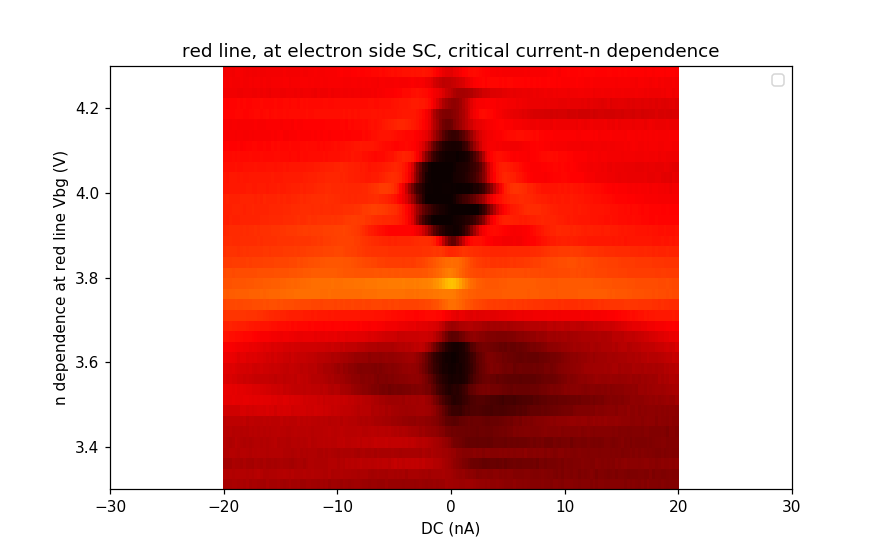

No handles with labels found to put in legend.


In [1314]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI10.lockin865_sine_outdc_set[0,:]*10,data_dVdI10.constant_D_redline_nsw_set[:],data_dVdI10.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.xlabel('DC (nA)')
plt.ylabel('n dependence at red line Vbg (V)')
plt.title('red line, at electron side SC, critical current-n dependence')
plt.xlim(-30,30)
plt.legend()

In [1258]:
data_dVdI8 = qc.load_data('data/2020-05-13/#004_M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT_21-20-51')

<IPython.core.display.Javascript object>


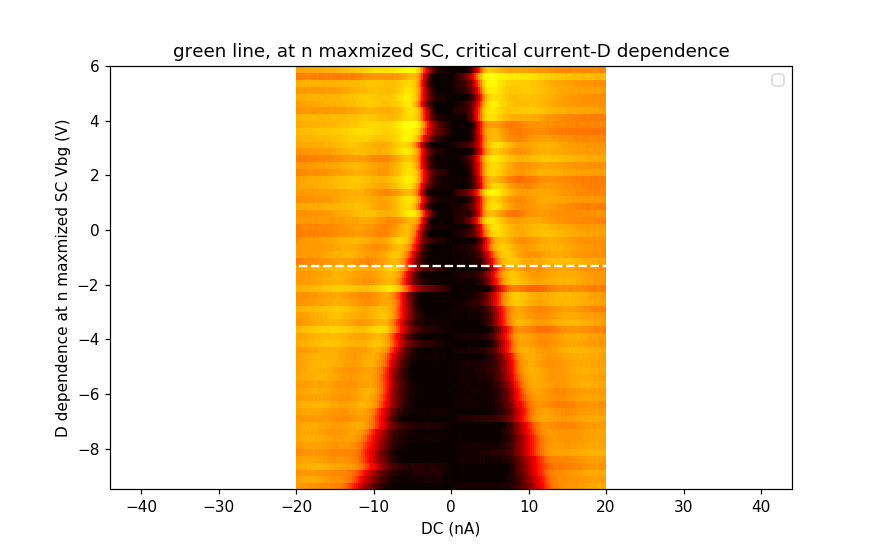

No handles with labels found to put in legend.


In [1309]:
plt.figure(figsize=(8,5)) 
plt.pcolormesh(data_dVdI8.lockin865_sine_outdc_set [0,:]*10,data_dVdI8.constant_n_electronSC_28_29_Dsw_set[:],data_dVdI8.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(2000, vmin=0, vmax=8e3))
x1 = np.array([-40,40])
plt.plot(x1, x1*0-1.33, color='white', linestyle='dashed')
plt.xlabel('DC (nA)')
plt.ylabel('D dependence at n maxmized SC Vbg (V)')
plt.title('green line, at n maxmized SC, critical current-D dependence')
plt.legend()

In [1290]:
data28_29_Fraunhofer8 = qc.load_data('data/2020-05-14/#001_M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_-9p5_FraunhoferbaseT_00-50-28')

<IPython.core.display.Javascript object>


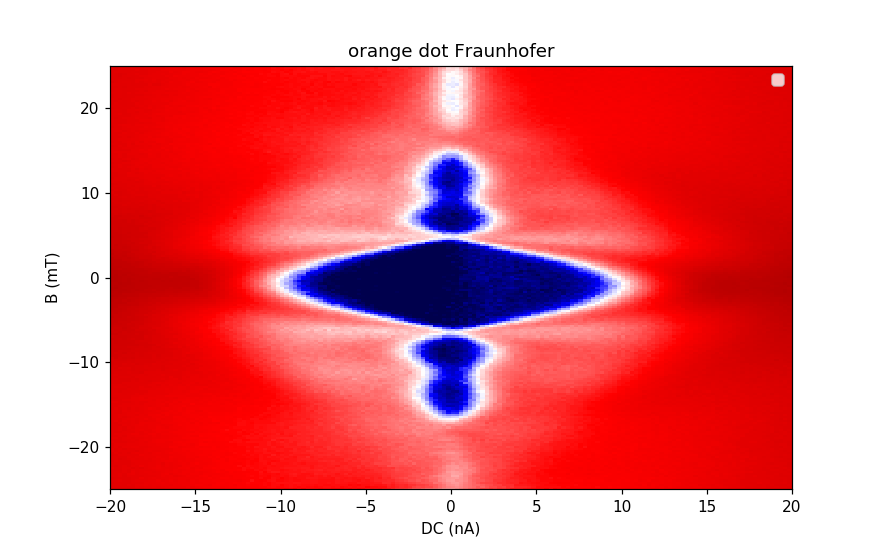

No handles with labels found to put in legend.


In [1325]:
coff = colors.SymLogNorm(300, vmin=0, vmax=4000)#not zero
plt.figure(figsize=(8,5))
plt.pcolormesh(data28_29_Fraunhofer8.lockin865_sine_outdc_set[0,:]*10,data28_29_Fraunhofer8.triton_field_set_stable_set[:]*1000,data28_29_Fraunhofer8.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('orange dot Fraunhofer')
plt.ylim(-25,25)
plt.legend()

In [1315]:
data28_29_Fraunhofer9 = qc.load_data('data/2020-05-14/#009_M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_-1p33_FraunhoferbaseT_19-04-03')

<IPython.core.display.Javascript object>


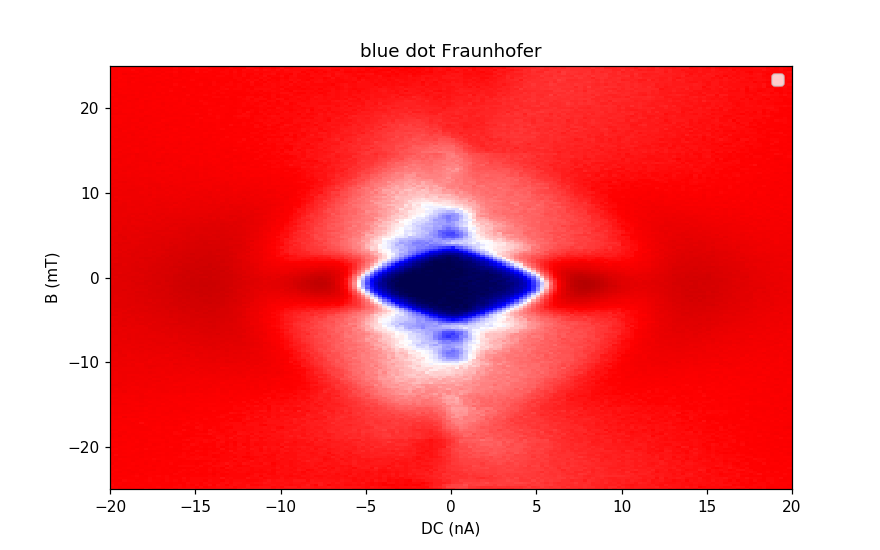

No handles with labels found to put in legend.


In [1349]:
coff = colors.SymLogNorm(1500, vmin=0, vmax=4000)#not zero
plt.figure(figsize=(8,5))
plt.pcolormesh(data28_29_Fraunhofer9.lockin865_sine_outdc_set[0,:]*10,data28_29_Fraunhofer9.triton_field_set_stable_set[:]*1000,data28_29_Fraunhofer9.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('blue dot Fraunhofer')
plt.ylim(-25,25)
plt.legend()

In [1338]:
data28_29_Fraunhofer10 = qc.load_data('data/2020-05-15/#001_M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_6_FraunhoferbaseT_07-43-01')

<IPython.core.display.Javascript object>


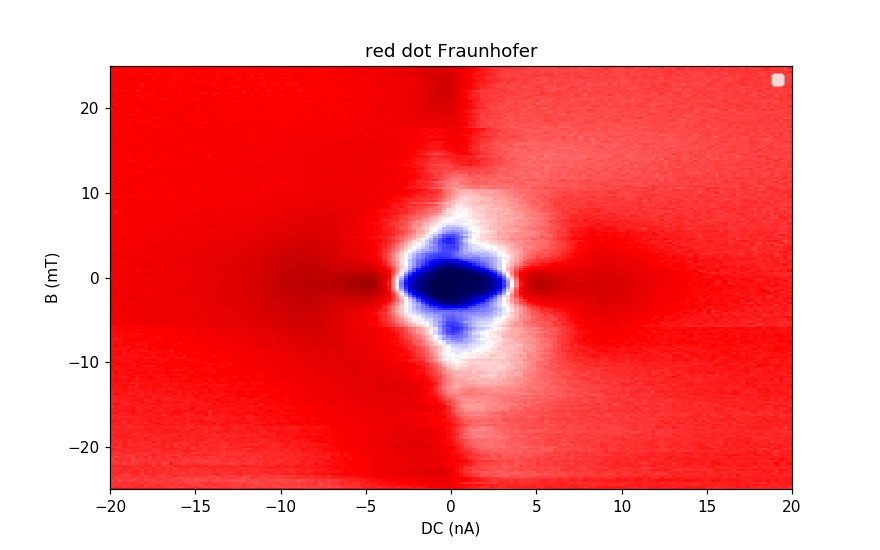

No handles with labels found to put in legend.


In [1350]:
coff = colors.SymLogNorm(2500, vmin=0, vmax=4000)#not zero
plt.figure(figsize=(8,5))
plt.pcolormesh(data28_29_Fraunhofer10.lockin865_sine_outdc_set[0,:]*10,data28_29_Fraunhofer10.triton_field_set_stable_set[:]*1000,data28_29_Fraunhofer10.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('red dot Fraunhofer')
plt.ylim(-25,25)
plt.legend()

# WAL

<IPython.core.display.Javascript object>


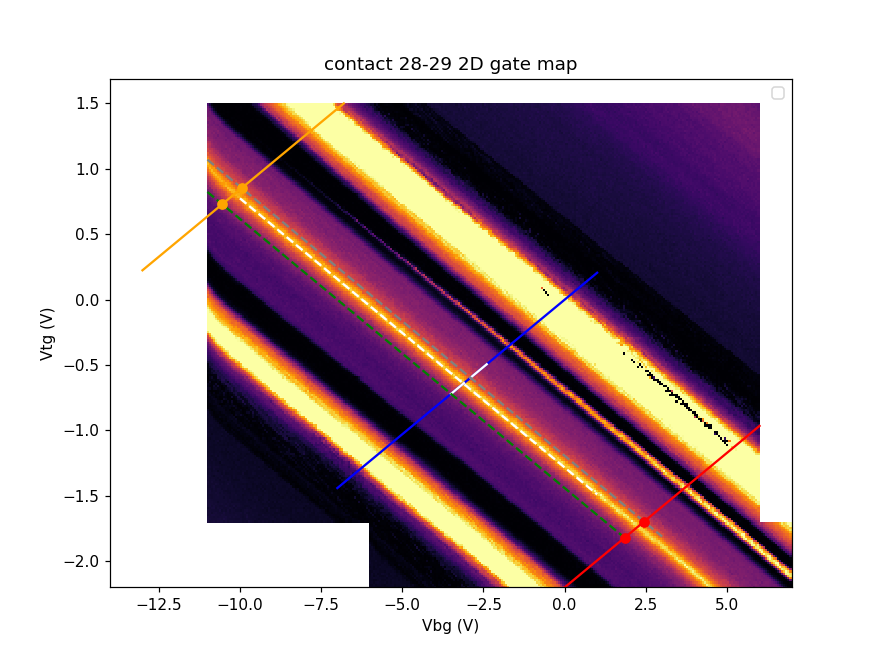

No handles with labels found to put in legend.


In [13]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate1.srframe_volt_p1_set[0,:],data_2Dgate1.srframe_volt_p5_set[:],data_2Dgate1.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.pcolormesh(data_2Dgate2.srframe_volt_p1_set[0,:],data_2Dgate2.srframe_volt_p5_set[:31],data_2Dgate2.lockin865_X[:31,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=1e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='blue')

x2_1 = np.array([-3.5,-3.1])
plt.plot(x2_1, x2_1*(-slDrc), color='white')

x2_2 = np.array([-2.9,-2.4])
plt.plot(x2_2, x2_2*(-slDrc), color='white')

x_ref = -3.5
y_ref = x_ref*(-slDrc)
x_green = np.array([-11,2])
plt.plot(x_green, x_green*(slDrc)+y_ref-slDrc*x_ref, color='green', linestyle='dashed')

x_ref2 = -2.9
y_ref2 = x_ref2*(-slDrc)
x_grey = np.array([-11,3])
plt.plot(x_grey, x_grey*(slDrc)+y_ref2-slDrc*x_ref2, color='grey', linestyle='dashed')


x4 = np.array([-13,-6.8])
plt.plot(x4, x4*(-slDrc)+2.9, color='orange')

x4_1 = (slDrc*x_ref +2.9 - y_ref)/2/slDrc
plt.plot(x4_1, x4_1*(-slDrc)+2.9, color='orange', marker='o')

x4_2 = (slDrc*x_ref2 +2.9 - y_ref2)/2/slDrc
plt.plot(x4_2, x4_2*(-slDrc)+2.9, color='orange', marker='o')

x6 = np.array([0,6])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')

x6_1 = (slDrc*x_ref -2.2 - y_ref)/2/slDrc
plt.plot(x6_1, x6_1*(-slDrc)-2.2, color='red', marker='o')

x6_2 = (slDrc*x_ref2 -2.2 - y_ref2)/2/slDrc
plt.plot(x6_2, x6_2*(-slDrc)-2.2, color='red', marker='o')


plt.legend()

In [128]:
x4_1

-10.545373866817643

In [132]:
x4_2

-9.945373866817643

# M30 other contact 

In [243]:
data_gate2 = qc.load_data('data/2020-05-05/#013_M30_baseT_865_38-39__830_34-33_0p5nA_backgate_12-41-01')
data_gate3 = qc.load_data('data/2020-05-05/#014_M30_baseT_865_39-40__830_38-39_0p5nA_backgate_12-54-16')

<IPython.core.display.Javascript object>


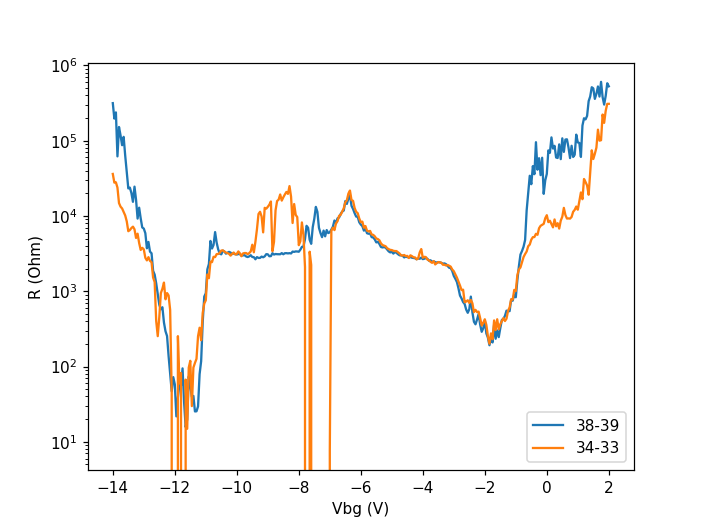

In [379]:
plt.figure()
plt.semilogy(data_gate2.srframe_volt_p1_set, npd.Rxxfromdata(data_gate2, 0.5e-9, 'lockin865'), label='38-39')
plt.semilogy(data_gate2.srframe_volt_p1_set, npd.Rxxfromdata(data_gate2, 0.5e-9, 'lockin830'), label='34-33')
#plt.semilogy(data_gate3.srframe_volt_p1_set, npd.Rxxfromdata(data_gate3, 0.5e-9, 'lockin865'), label='39-40')
plt.xlabel('Vbg (V)')
plt.ylabel('R (Ohm)')
plt.legend()

In [46]:
data_2Dgate3 = qc.load_data('data/2020-06-16/#006_M30_865_38-39__830_29-28_0p5nA_2dgatesweep_baseT_23-31-27')

In [49]:
data_2Dgate4 = qc.load_data('data/2020-06-18/#001_M30_865_38-39__830_29-28_0p5nA_2dgatesweep_baseT_00-49-22')

<IPython.core.display.Javascript object>


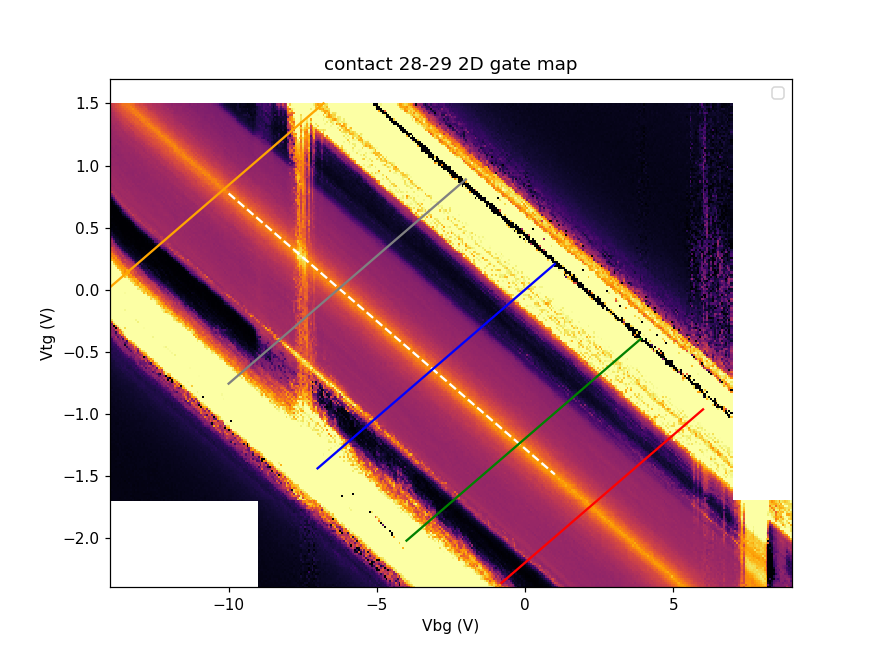

No handles with labels found to put in legend.


In [59]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate3.srframe_volt_p1_set[0,:],data_2Dgate3.srdc_volt_set[:],data_2Dgate3.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate4.srframe_volt_p1_set[0,:],data_2Dgate4.srdc_volt_set[:43],data_2Dgate4.lockin865_X[:43,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-7,1])
plt.plot(x2, x2*(-slDrc), color='blue')

#x3 = np.array([-5,5])
#plt.plot(x3, x3*(slDrc)+0.3, color='red', linestyle='dashed')

x4 = np.array([-14,-6.8])
plt.plot(x4, x4*(-slDrc)+2.9, color='orange')

x5 = np.array([-4,3.9])
plt.plot(x5, x5*(-slDrc)-1.2, color='green')

x6 = np.array([-0.8,6])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')

x7 = np.array([-10,-2])
plt.plot(x7, x7*(-slDrc)+1.3, color='grey')



plt.legend()

<IPython.core.display.Javascript object>


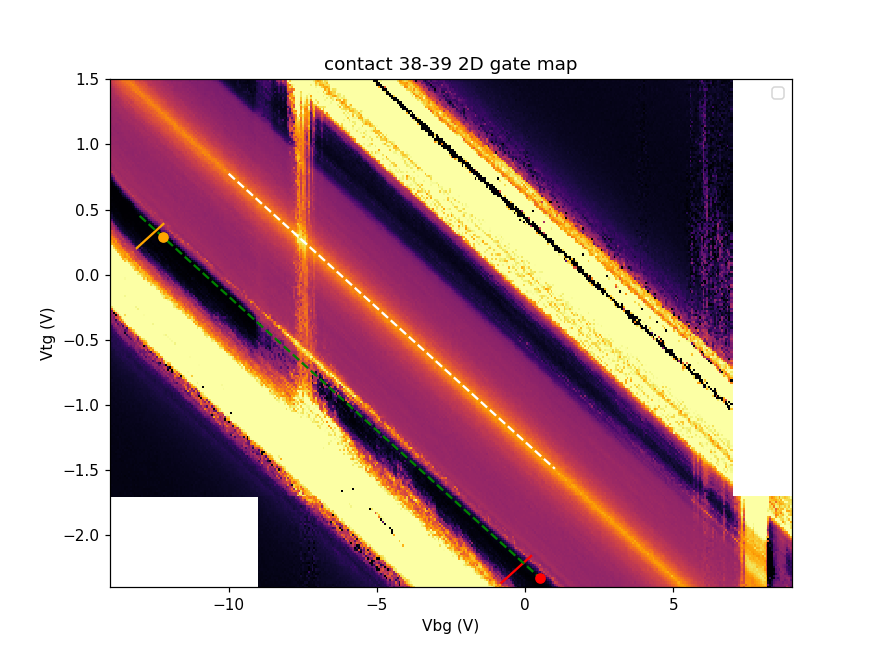

No handles with labels found to put in legend.


In [104]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate3.srframe_volt_p1_set[0,:],data_2Dgate3.srdc_volt_set[:],data_2Dgate3.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate4.srframe_volt_p1_set[0,:],data_2Dgate4.srdc_volt_set[:43],data_2Dgate4.lockin865_X[:43,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 38-39 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')


x4 = np.array([-13.1,-12.2])
plt.plot(x4, x4*(-slDrc)+2.9, color='orange')

x6 = np.array([-0.8,0.2])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')

x7 = np.array([-13,0.5])
plt.plot(x7, x7*slDrc+x4_1*(-slDrc)+2.9-x4_1*slDrc, color='green', linestyle='dashed')

x7_1 = 0.5
plt.plot(x7_1, x7_1*slDrc+x4_1*(-slDrc)+2.9-x4_1*slDrc, color='red', marker='o')

x7_2 = -12.2
plt.plot(x7_2, x7_2*slDrc+x4_1*(-slDrc)+2.9-x4_1*slDrc, color='orange', marker='o')


plt.legend()

In [79]:
data_dVdI3839_3 = qc.load_data('data/2020-06-18/#009_M30_865_39-38__830_28-29_0p5nAexc_constant_n_maxSChole_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_18-03-04')

<IPython.core.display.Javascript object>


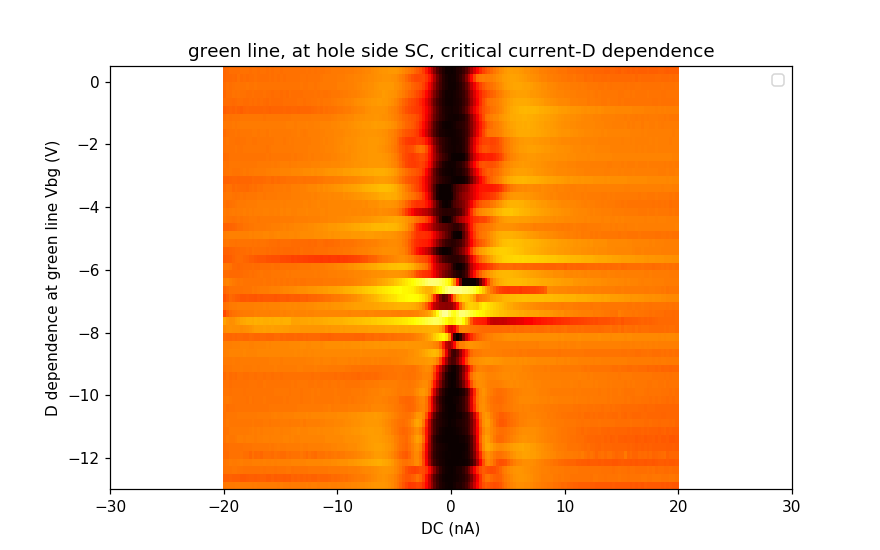

No handles with labels found to put in legend.


In [81]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI3839_3.lockin865_sine_outdc_set[0,:]*10,data_dVdI3839_3.constant_n_holeSC_38_39_Dsw_set[:],data_dVdI3839_3.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(5000, vmin=0, vmax=20e3))
plt.xlabel('DC (nA)')
plt.ylabel('D dependence at green line Vbg (V)')
plt.title('green line, at hole side SC, critical current-D dependence')
plt.xlim(-30,30)
plt.legend()

In [63]:
data_dVdI3839_1 = qc.load_data('data/2020-06-18/#007_M30_865_39-38__830_28-29_0p5nAexc_constantDcut_orangeline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_11-45-01')

<IPython.core.display.Javascript object>


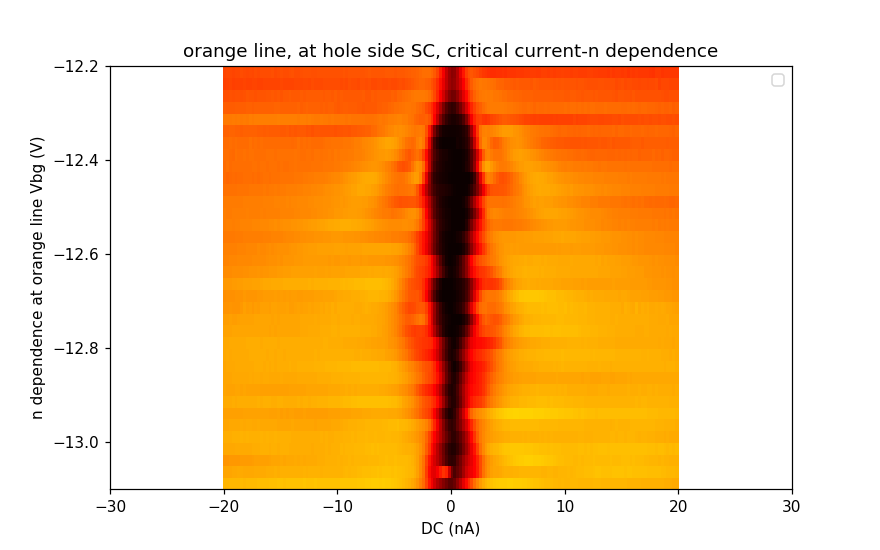

No handles with labels found to put in legend.


In [69]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI3839_1.lockin865_sine_outdc_set[0,:]*10,data_dVdI3839_1.constant_D_orangeline_nsw_set[:],data_dVdI3839_1.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(5000, vmin=0, vmax=20e3))
plt.xlabel('DC (nA)')
plt.ylabel('n dependence at orange line Vbg (V)')
plt.title('orange line, at hole side SC, critical current-n dependence')
plt.xlim(-30,30)
plt.legend()

In [70]:
data_dVdI3839_2 = qc.load_data('data/2020-06-18/#008_M30_865_39-38__830_28-29_0p5nAexc_constantDcut_redline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_15-04-26')

<IPython.core.display.Javascript object>


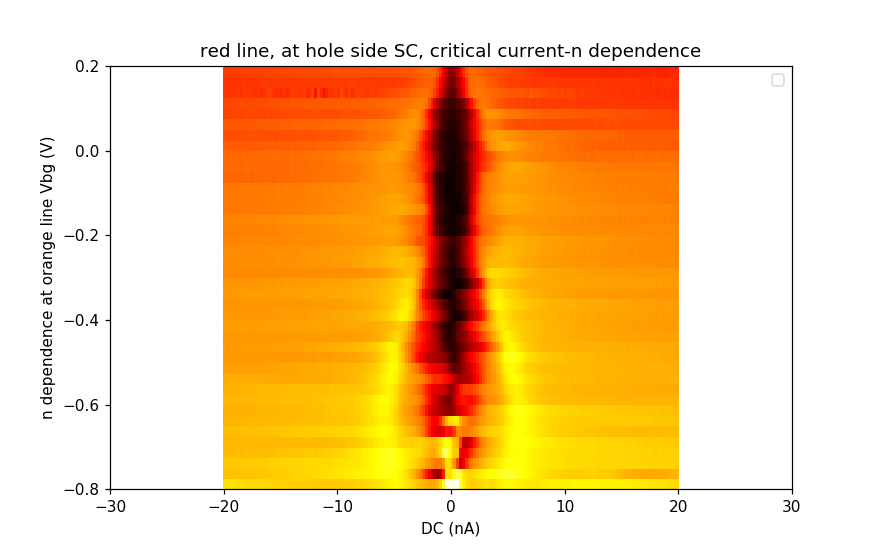

No handles with labels found to put in legend.


In [72]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI3839_2.lockin865_sine_outdc_set[0,:]*10,data_dVdI3839_2.constant_D_redline_nsw_set[:],data_dVdI3839_2.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(5000, vmin=0, vmax=20e3))
plt.xlabel('DC (nA)')
plt.ylabel('n dependence at orange line Vbg (V)')
plt.title('red line, at hole side SC, critical current-n dependence')
plt.xlim(-30,30)
plt.legend()

In [105]:
data38_39_Fraunhofer1 = qc.load_data('data/2020-06-18/#010_M30_865_38-39__830_28-29_0p5nAexc_constant_n_holeSC_38_39_Dsw_0p5_FraunhoferbaseT_22-20-19')

<IPython.core.display.Javascript object>


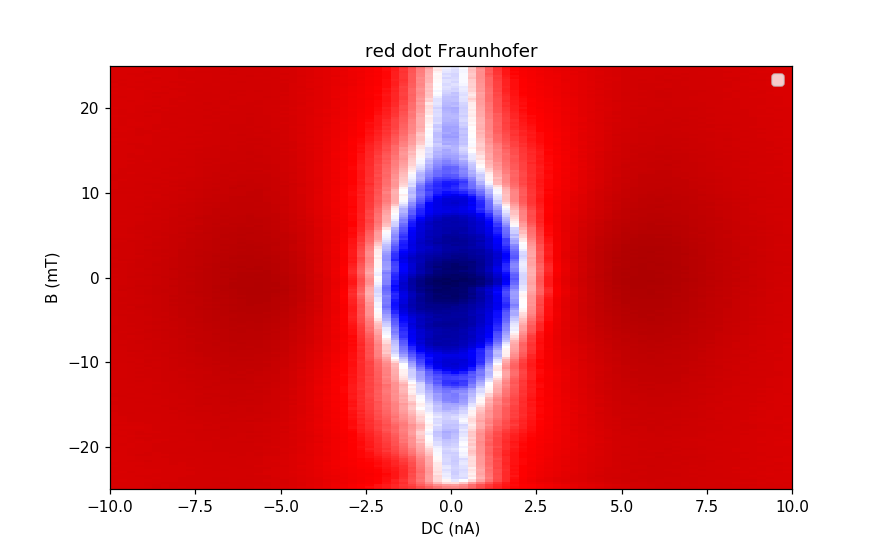

No handles with labels found to put in legend.


In [110]:
coff = colors.SymLogNorm(2500, vmin=0, vmax=8000)
plt.figure(figsize=(8,5))
plt.pcolormesh(data38_39_Fraunhofer1.lockin865_sine_outdc_set[0,:]*10,data38_39_Fraunhofer1.triton_field_set_stable_set[:]*1000,data38_39_Fraunhofer1.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('red dot Fraunhofer')
plt.ylim(-25,25)
plt.legend()

In [112]:
data38_39_Fraunhofer2 = qc.load_data('data/2020-06-19/#001_M30_865_38-39__830_28-29_0p5nAexc_constant_n_holeSC_38_39_Dsw_-12p2_FraunhoferbaseT_05-16-30')

<IPython.core.display.Javascript object>


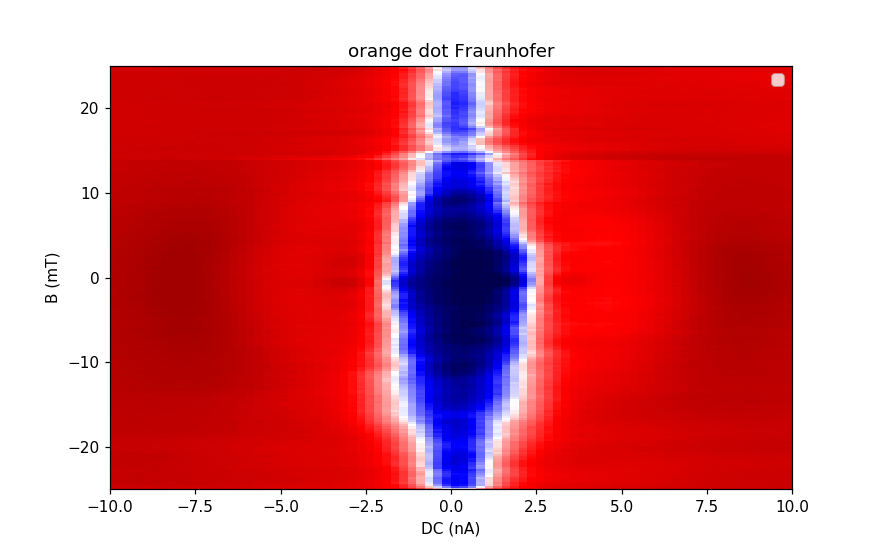

No handles with labels found to put in legend.


In [113]:
coff = colors.SymLogNorm(2500, vmin=0, vmax=8000)
plt.figure(figsize=(8,5))
plt.pcolormesh(data38_39_Fraunhofer2.lockin865_sine_outdc_set[0,:]*10,data38_39_Fraunhofer2.triton_field_set_stable_set[:]*1000,data38_39_Fraunhofer2.lockin865_X[:,:]/0.5e-9, norm=coff, cmap='seismic')
plt.xlabel('DC (nA)')
plt.ylabel('B (mT)')
plt.title('orange dot Fraunhofer')
plt.ylim(-25,25)
plt.legend()

<IPython.core.display.Javascript object>


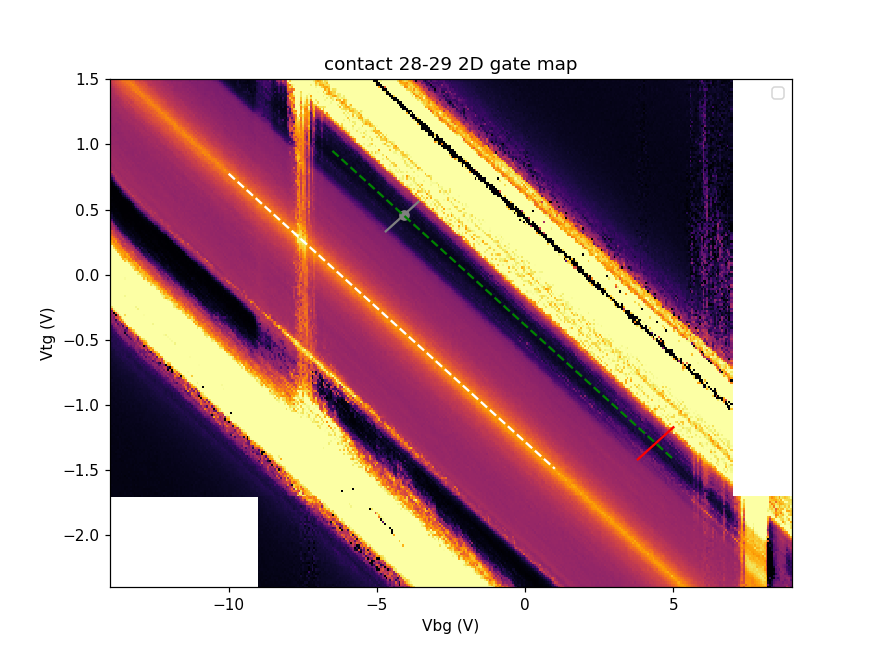

No handles with labels found to put in legend.


In [96]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate3.srframe_volt_p1_set[0,:],data_2Dgate3.srdc_volt_set[:],data_2Dgate3.lockin865_X[:,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate4.srframe_volt_p1_set[0,:],data_2Dgate4.srdc_volt_set[:43],data_2Dgate4.lockin865_X[:43,:]/0.5e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 28-29 2D gate map')

x1 = np.array([-10,1])
plt.plot(x1, x1*slDrc + bDrc, color='white', linestyle='dashed')

x2 = np.array([-4.7,-3.6])
plt.plot(x2, x2*(-slDrc)+1.3, color='grey')

x2_1 = -4.1
plt.plot(x2_1, x2_1*(-slDrc)+1.3, color='grey', marker='o')

x6 = np.array([3.8,5])
plt.plot(x6, x6*(-slDrc)-2.2, color='red')


x7 = np.array([-6.5,5])
plt.plot(x7, x7*slDrc+x2_1*(-slDrc)+1.3-x2_1*slDrc, color='green', linestyle='dashed')

plt.legend()

In [114]:
data_dVdI3839_4 = qc.load_data('data/2020-06-19/#004_M30_865_39-38__830_28-29_0p5nAexc_constant_n_maxSCelectron_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_21-20-41')

<IPython.core.display.Javascript object>


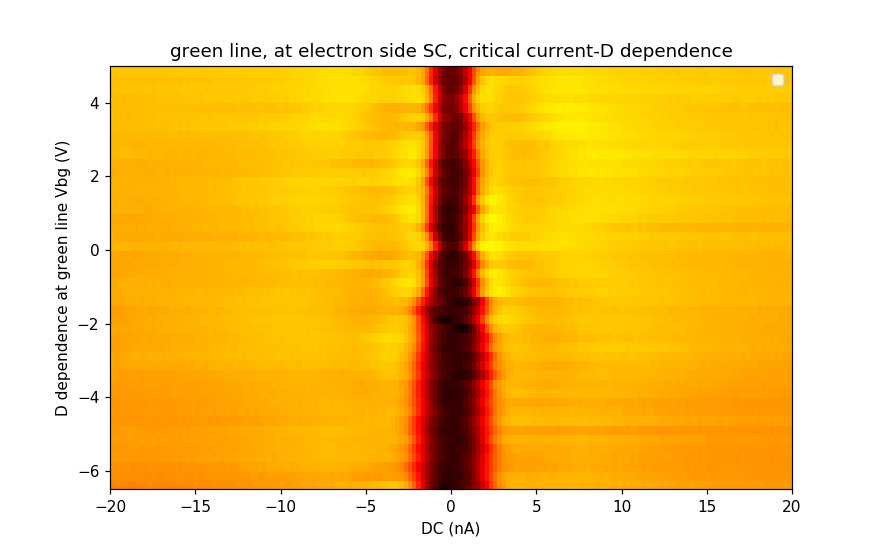

No handles with labels found to put in legend.


In [122]:
plt.figure(figsize=(8,5))
plt.pcolormesh(data_dVdI3839_4.lockin865_sine_outdc_set[0,:]*10,data_dVdI3839_4.constant_n_electronSC_38_39_Dsw_set[:],data_dVdI3839_4.lockin865_X[:,:]/0.5e-9,cmap='hot',norm = colors.SymLogNorm(3000, vmin=0, vmax=10e3))
plt.xlabel('DC (nA)')
plt.ylabel('D dependence at green line Vbg (V)')
plt.title('green line, at electron side SC, critical current-D dependence')
plt.xlim(-20,20)
plt.legend()

# 38-39 fan diagram

In [123]:
dfan_3839 = qc.load_data('data/2020-06-20/#005_M30_865_39-38__830_39-33_1nA_baseT_B-n_D0_sweep_15-53-10')

<IPython.core.display.Javascript object>


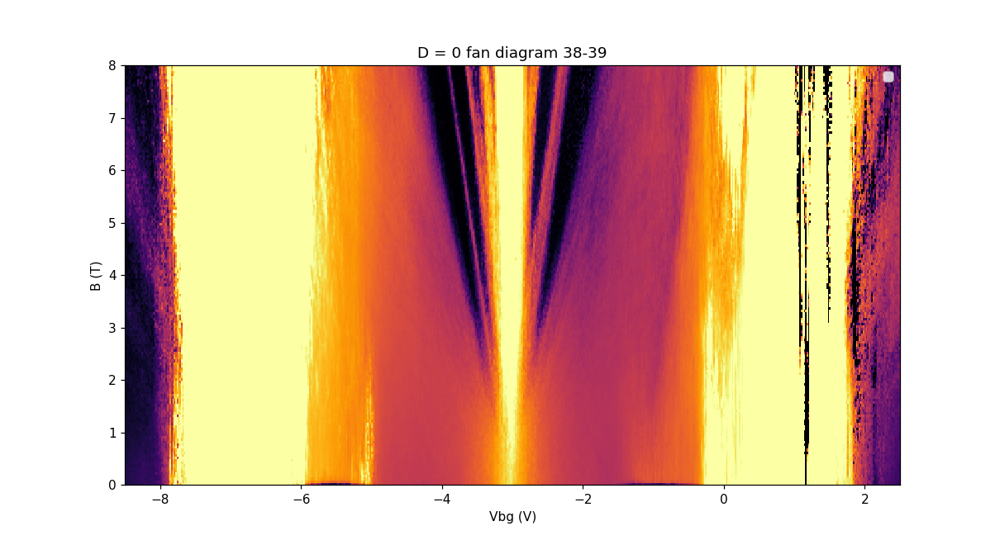

No handles with labels found to put in legend.


In [124]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan_3839.zeroDparam_set[0,:],dfan_3839.triton_field_set_stable_set[:],dfan_3839.lockin865_X[:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=2e4))
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D = 0 fan diagram 38-39')
plt.legend()

<IPython.core.display.Javascript object>


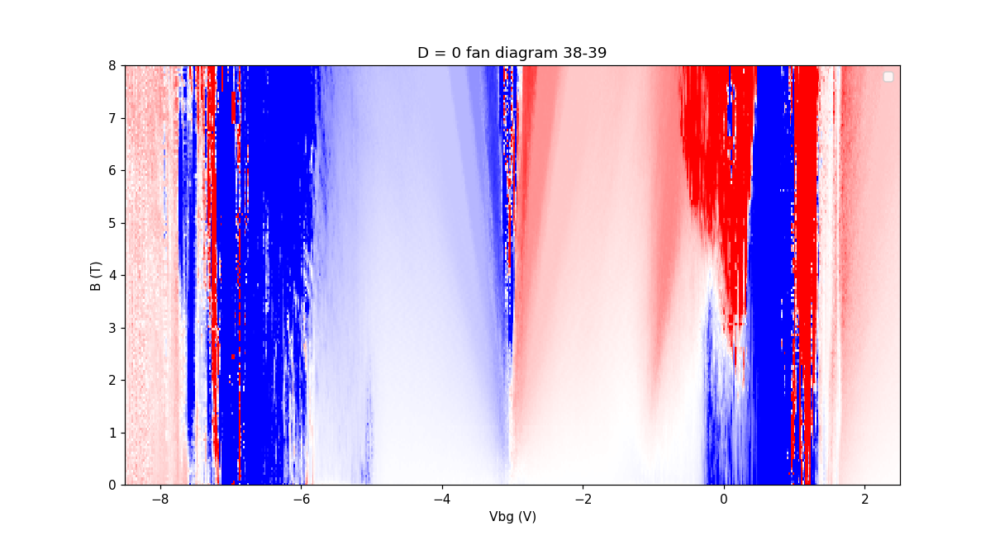

No handles with labels found to put in legend.


In [126]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan_3839.zeroDparam_set[0,:],dfan_3839.triton_field_set_stable_set[:],dfan_3839.lockin830_X[:,:]/1e-9,cmap='bwr', vmin=-3e4, vmax=3e4)
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D = 0 fan diagram 38-39')
plt.legend()

<IPython.core.display.Javascript object>


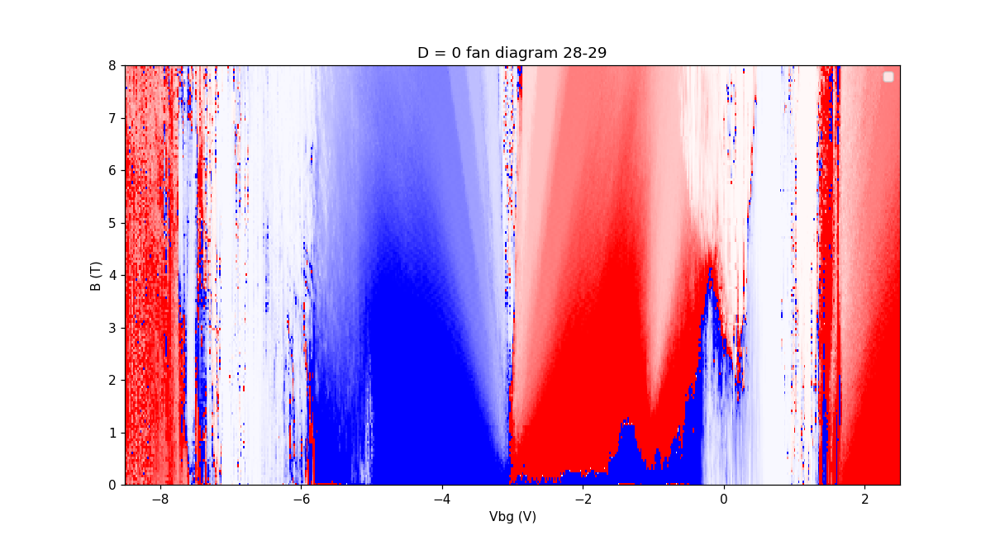

C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
No handles with labels found to put in legend.


In [128]:
plt.figure(figsize=(11,6))
plt.pcolormesh(dfan_3839.zeroDparam_set[0,:],dfan_3839.triton_field_set_stable_set[:],(1/(dfan_3839.lockin830_X[:,:]/1e-9))/(1.602e-19**2/6.6e-34),cmap='bwr', vmin=-8, vmax=8)
plt.xlabel('Vbg (V)')
plt.ylabel('B (T)')
plt.title('D = 0 fan diagram 28-29')
plt.legend()

<IPython.core.display.Javascript object>


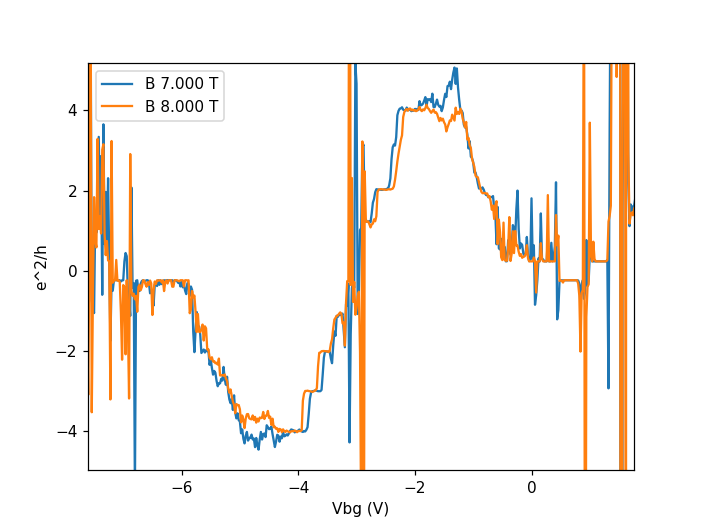

In [132]:
plt.figure()
for i in range(2):
    indx = 140 + i*20
    plt.plot(dfan_3839.zeroDparam_set[0,:], (1/(dfan_3839.lockin830_X[indx,:]/1e-9))/(1.602e-19**2/6.6e-34), label='B {:.3f} T'.format(dfan_3839.triton_field_set_stable_set[indx]))
plt.xlabel('Vbg (V)')
plt.ylabel('e^2/h')
plt.legend()

In [6]:
data_2Dgate8T = qc.load_data('data/2020-06-22/#001_M30_865_38-39__830_39-33_1nA_2dgatesweep_baseT_8T_03-02-07')

In [7]:
data_2Dgate8T_1 = qc.load_data('data/2020-06-23/#001_M30_865_38-39__830_39-33_1nA_2dgatesweep_baseT_8T_01-03-25')

In [8]:
data_2Dgate8T_2 = qc.load_data('data/2020-06-23/#002_M30_865_38-39__830_39-33_1nA_2dgatesweep_baseT_8T_06-58-25')

<IPython.core.display.Javascript object>


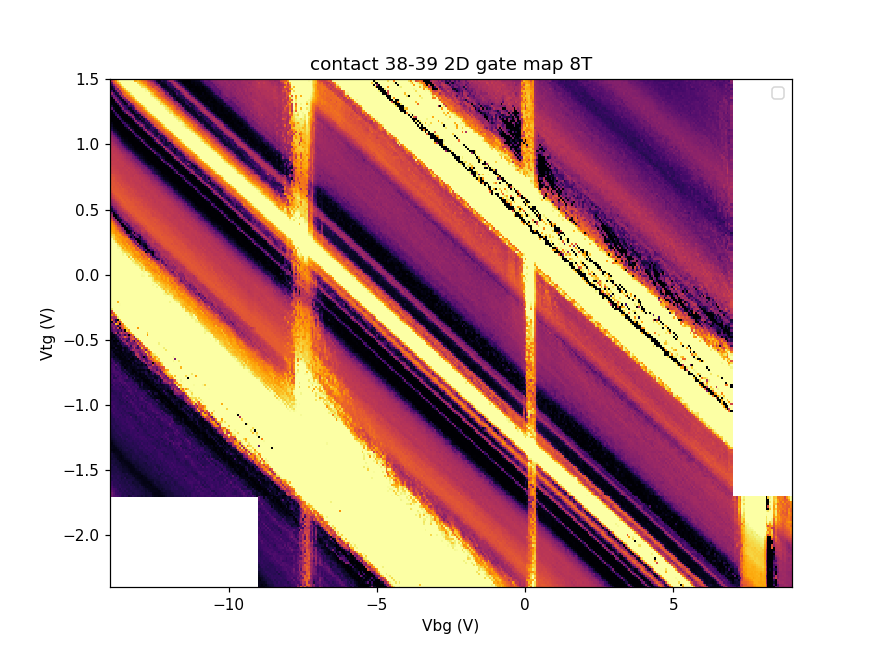

No handles with labels found to put in legend.


In [11]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate8T.srframe_volt_p1_set[0,:],data_2Dgate8T.srdc_volt_set[:151],data_2Dgate8T.lockin865_X[:151,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate8T_1.srframe_volt_p1_set[0,:],data_2Dgate8T_1.srdc_volt_set[:],data_2Dgate8T_1.lockin865_X[:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.pcolormesh(data_2Dgate8T_2.srframe_volt_p1_set[0,:],data_2Dgate8T_2.srdc_volt_set[:],data_2Dgate8T_2.lockin865_X[:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 38-39 2D gate map 8T')

plt.legend()

<IPython.core.display.Javascript object>


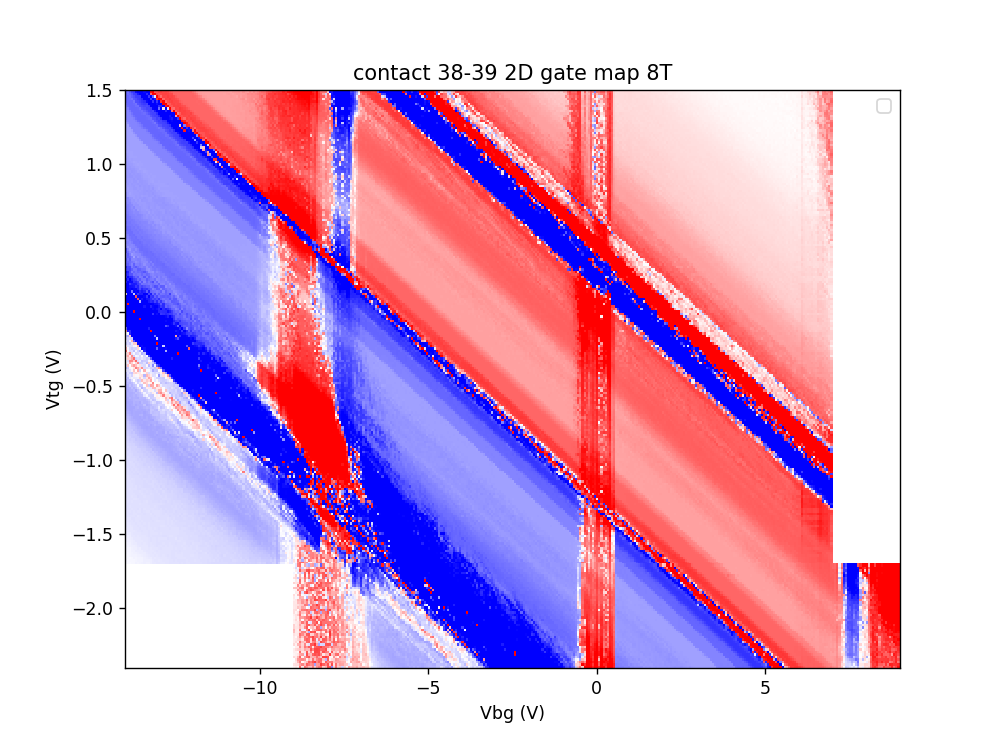

No handles with labels found to put in legend.


In [17]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate8T.srframe_volt_p1_set[0,:],data_2Dgate8T.srdc_volt_set[:151],data_2Dgate8T.lockin830_X[:151,:]/1e-9,cmap='bwr',norm = colors.SymLogNorm(8000, vmin=-5e4, vmax=5e4))
plt.pcolormesh(data_2Dgate8T_1.srframe_volt_p1_set[0,:],data_2Dgate8T_1.srdc_volt_set[:],data_2Dgate8T_1.lockin830_X[:,:]/1e-9,cmap='bwr',norm = colors.SymLogNorm(8000, vmin=-5e4, vmax=5e4))
plt.pcolormesh(data_2Dgate8T_2.srframe_volt_p1_set[0,:],data_2Dgate8T_2.srdc_volt_set[:],data_2Dgate8T_2.lockin830_X[:,:]/1e-9,cmap='bwr',norm = colors.SymLogNorm(8000, vmin=-5e4, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 38-39 2D gate map 8T')

plt.legend()

In [23]:
data_2Dgate5T = qc.load_data('data/2020-06-25/#001_M30_865_38-39__830_39-33_1nA_2dgatesweep_baseT_5T_09-52-00')

<IPython.core.display.Javascript object>


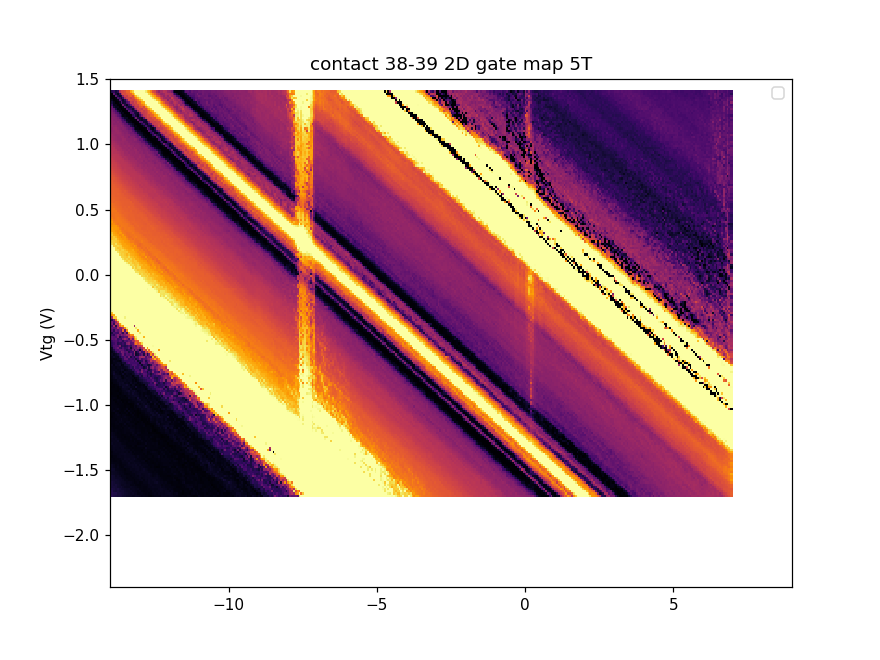

No handles with labels found to put in legend.


In [32]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate5T.srframe_volt_p1_set[0,:],data_2Dgate5T.srdc_volt_set[:188],data_2Dgate5T.lockin865_X[:188,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.ylabel('Vtg (V)')
plt.title('contact 38-39 2D gate map 5T')
plt.xlim(-14,9)
plt.ylim(-2.4,1.5)
plt.legend()

<IPython.core.display.Javascript object>


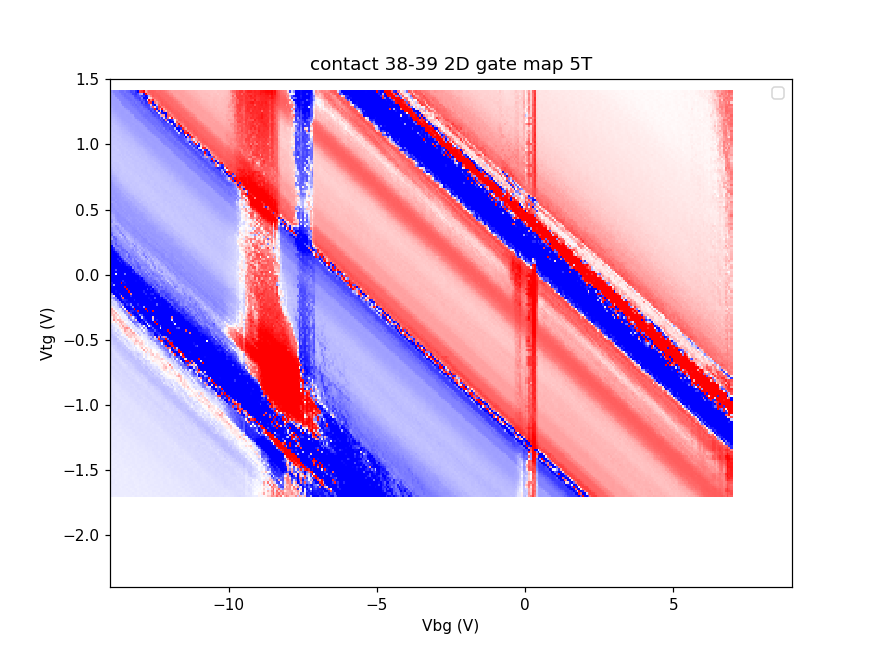

No handles with labels found to put in legend.


In [33]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate5T.srframe_volt_p1_set[0,:],data_2Dgate3T.srdc_volt_set[:188],data_2Dgate5T.lockin830_X[:188,:]/1e-9,cmap='bwr',norm = colors.SymLogNorm(8000, vmin=-5e4, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 38-39 2D gate map 5T')
plt.xlim(-14,9)
plt.ylim(-2.4,1.5)
plt.legend()

In [13]:
data_2Dgate3T = qc.load_data('data/2020-06-23/#004_M30_865_38-39__830_39-33_1nA_2dgatesweep_baseT_3T_20-04-26')

<IPython.core.display.Javascript object>


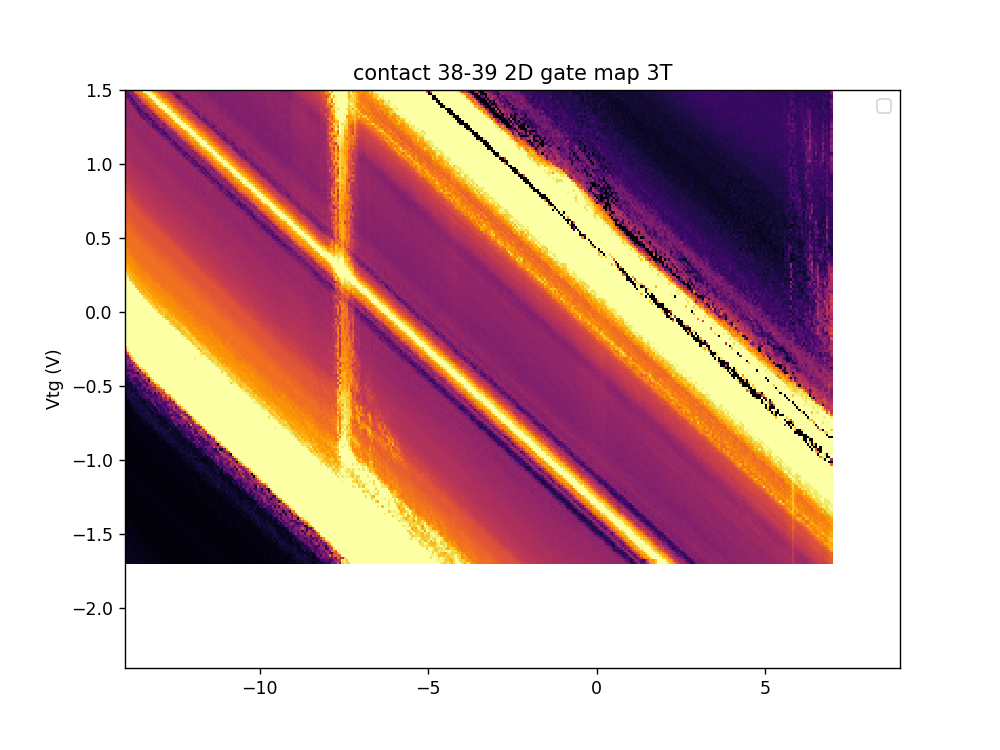

No handles with labels found to put in legend.


In [18]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate3T.srframe_volt_p1_set[0,:],data_2Dgate3T.srdc_volt_set[:],data_2Dgate3T.lockin865_X[:,:]/1e-9,cmap='inferno',norm = colors.SymLogNorm(2000, vmin=0, vmax=5e4))
plt.ylabel('Vtg (V)')
plt.title('contact 38-39 2D gate map 3T')
plt.xlim(-14,9)
plt.ylim(-2.4,1.5)
plt.legend()

<IPython.core.display.Javascript object>


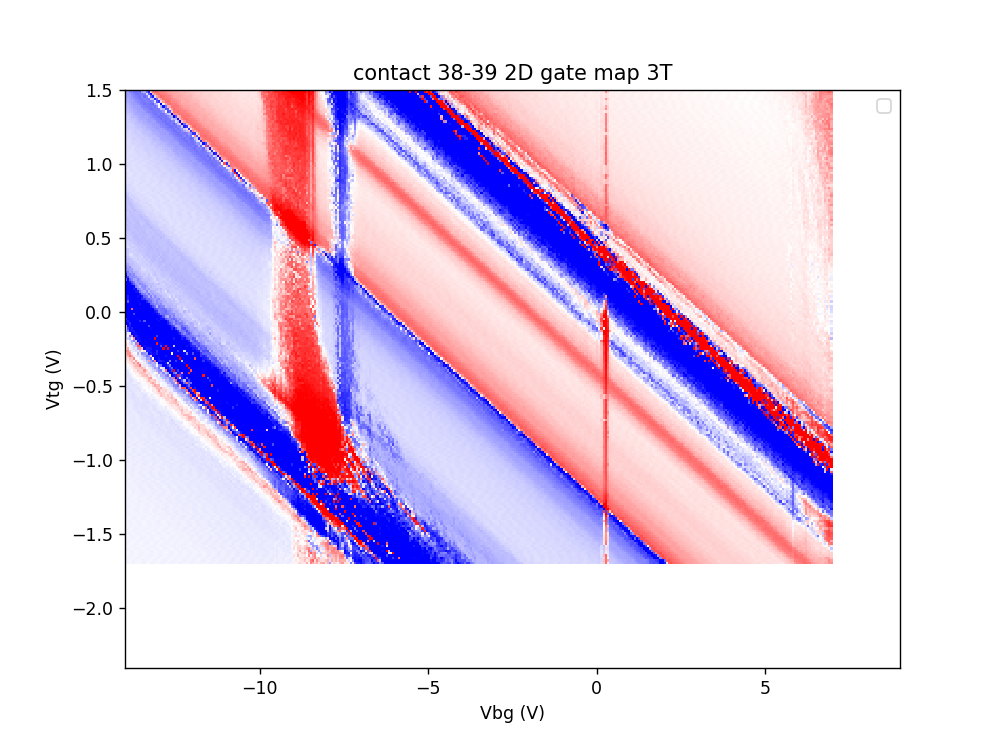

No handles with labels found to put in legend.


In [22]:
plt.figure(figsize=(8,6))
plt.pcolormesh(data_2Dgate3T.srframe_volt_p1_set[0,:],data_2Dgate3T.srdc_volt_set[:],data_2Dgate3T.lockin830_X[:,:]/1e-9,cmap='bwr',norm = colors.SymLogNorm(8000, vmin=-5e4, vmax=5e4))
plt.xlabel('Vbg (V)')
plt.ylabel('Vtg (V)')
plt.title('contact 38-39 2D gate map 3T')
plt.xlim(-14,9)
plt.ylim(-2.4,1.5)
plt.legend()